# Wykresy testów wydajnościowych

### Funkcja do liczenia średnich z plików csv dla MPI

In [2]:
import pandas as pd

def reduce_mean_seq(path):
    df = pd.read_csv(path)
    result = df.groupby("power")["time"].mean().reset_index()
    result.to_csv(path, index=False)
    print("Zapisano wynik do", path)

def reduce_mean(path):
    df = pd.read_csv(path)
    result = (
        df.groupby(["power", "processes"], as_index=False)
        .agg({
            "time": "mean",
            "abs_err": "mean",
            "rel_err": "mean"
        })
    )
    result.to_csv(path, index=False)
    print("Zapisano wynik do", path)

In [32]:
reduce_mean_seq("../results/seq/seq_sum_int.csv")
reduce_mean_seq("../results/seq/seq_sum_double.csv")
reduce_mean_seq("../results/seq/seq_min_int.csv")
reduce_mean_seq("../results/seq/seq_min_double.csv")
reduce_mean_seq("../results/seq/seq_max_int.csv")
reduce_mean_seq("../results/seq/seq_max_double.csv")
reduce_mean_seq("../results/seq/seq_prefix_int.csv")
reduce_mean_seq("../results/seq/seq_prefix_double.csv")

Zapisano wynik do ../results/seq/seq_sum_int.csv
Zapisano wynik do ../results/seq/seq_sum_double.csv
Zapisano wynik do ../results/seq/seq_min_int.csv
Zapisano wynik do ../results/seq/seq_min_double.csv
Zapisano wynik do ../results/seq/seq_max_int.csv
Zapisano wynik do ../results/seq/seq_max_double.csv
Zapisano wynik do ../results/seq/seq_prefix_int.csv
Zapisano wynik do ../results/seq/seq_prefix_double.csv


In [47]:
CPU_BANDWIDTH = 83.2
GPU_BANDWIDTH = 504.0

## MPI

### Funkcje do wyświetlania wykresów dla MPI

In [147]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_time_vs_elements(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania (ms) w zależności od ilości elementów (2^p)
    Serie odpowiadają liczbie procesów.
    Dodatkowo rysujemy linię z danych sekwencyjnych df_seq (kolumny: power, time).
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("processes"):
        plt.plot(2**group["power"], group["time"], marker='o', label=f"Procesów: {proc}")

    if df_seq is not None and not df_seq.empty:
        plt.plot(2**df_seq["power"], df_seq["time"], marker='x', linestyle='--', color='k', linewidth=2, label="Sekwencyjnie")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_abs_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd bezwzględny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("processes"):
        plt.plot(2**group["power"], group["abs_err"], marker='o', label=f"Procesów: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd bezwzględny")
    plt.title(f"Błąd bezwzględny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_rel_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd względny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("processes"):
        plt.plot(2**group["power"], group["rel_err"], marker='o', label=f"Procesów: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd względny")
    plt.title(f"Błąd względny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_time_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania w zależności od liczby procesów
    (dla każdego rozmiaru danych osobna linia).
    Dla każdego power rysujemy dodatkowo poziomą, przerywaną linię z czasu sekwencyjnego
    używając tego samego koloru co linia dla danej grupy. Legenda jest poza obszarem wykresu.
    """
    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        line = plt.plot(group["processes"], group["time"], marker='o', label=f"Elementów: 2^{power}")
        color = line[0].get_color()

        if df_seq is not None and not df_seq.empty:
            seq_row = df_seq[df_seq["power"] == power]
            if not seq_row.empty:
                seq_time = seq_row["time"].values[0]
                x_min, x_max = group["processes"].min(), group["processes"].max()
                plt.hlines(seq_time, x_min, x_max, colors=color, linestyles='--', linewidth=1.5, label=f"sequential 2^{power}")

    plt.yscale('log')
    plt.xlabel("Liczba procesów")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od liczby procesów ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()

# --- NOWA FUNKCJA: przepustowość vs liczba procesów ---
def plot_bandwith_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: przepustowość (GB/s) w zależności od liczby procesów.
    Serie: różne rozmiary danych (2^power).
    Rysuje poziomą przerywaną linię z teoretycznym maksimum (GPU dla 'cuda' w dtype_label, w przeciwnym razie CPU).
    """
    # określ rozmiar pojedynczego elementu w bajtach na podstawie dtype_label
    lbl = dtype_label.lower()
    if "double" in lbl:
        elem_size = 8
    elif "int64" in lbl or "int64_t" in lbl:
        elem_size = 8
    else:
        # domyślnie zwykły int -> 4 bajty
        elem_size = 4

    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        # liczba elementów = 2^power
        elements = 2 ** int(power)
        # czas w sekundach (zakładamy, że kolumna 'time' jest w ms)
        times_s = group["time"].astype(float) / 1000.0
        # unikamy dzielenia przez zero
        times_s = times_s.replace(0, 1e-9)

        # przepustowość w GB/s
        bandwidth_gbs = (elements * elem_size) / times_s / 1e9

        plt.plot(group["processes"], bandwidth_gbs, marker="o", label=f"Elementów: 2^{power}")

    # wybierz teoretyczne maksimum na podstawie technologii zawartej w dtype_label
    theoretical_max = GPU_BANDWIDTH if "cuda" in lbl else CPU_BANDWIDTH
    x_min, x_max = df["processes"].min(), df["processes"].max()
    plt.hlines(theoretical_max, x_min, x_max, colors="k", linestyles="--", linewidth=1.5, label=f"Teoretyczne maksimum ({theoretical_max} GB/s)")

    plt.xlabel("Liczba procesów")
    plt.ylabel("Przepustowość [GB/s]")
    plt.title(f"Przepustowość w zależności od liczby procesów ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()

### MPI - SUM - INT

Zapisano wynik do ../results/mpi/mpi_sum_int.csv


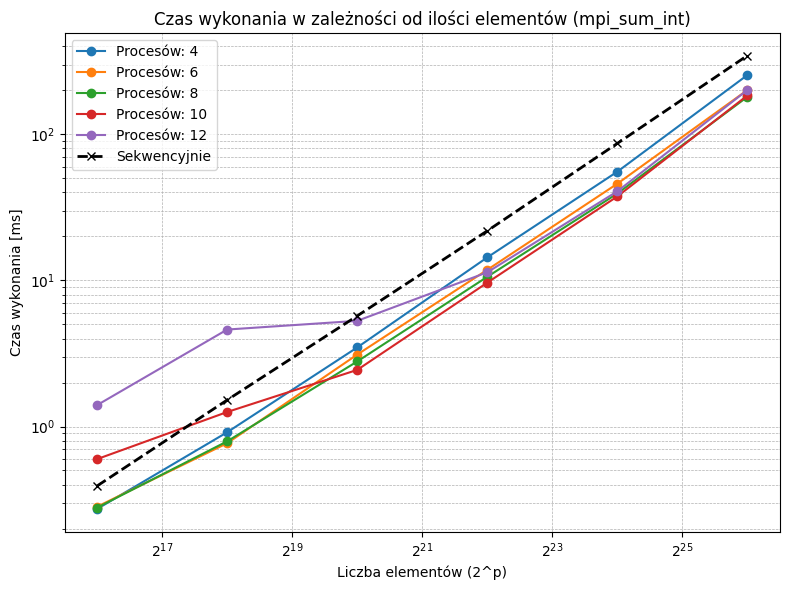

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


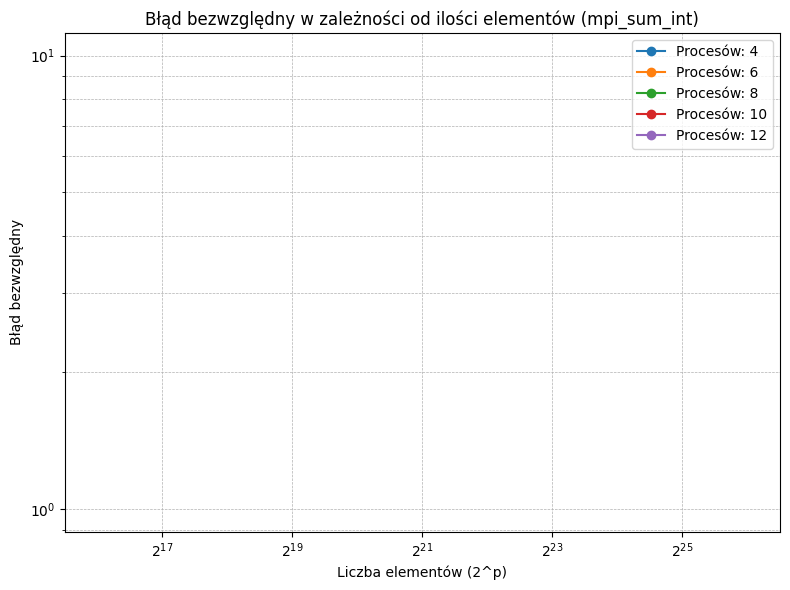

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


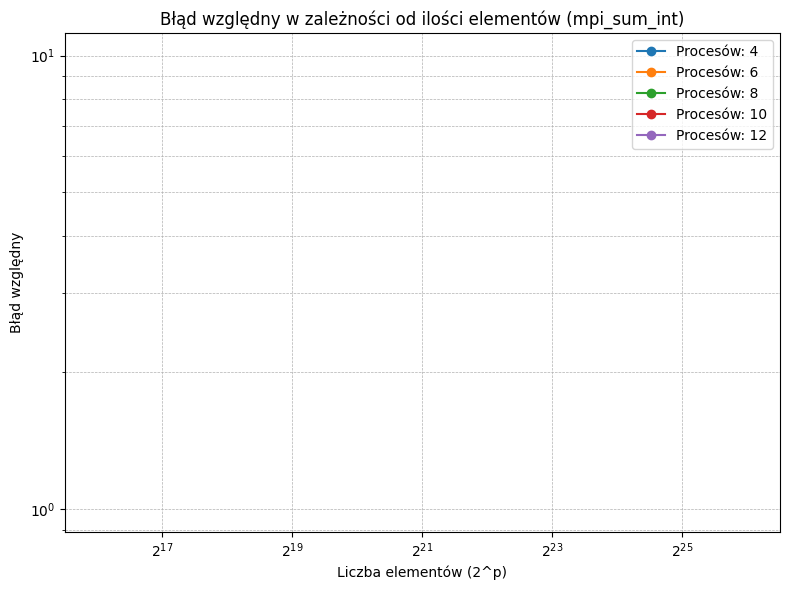

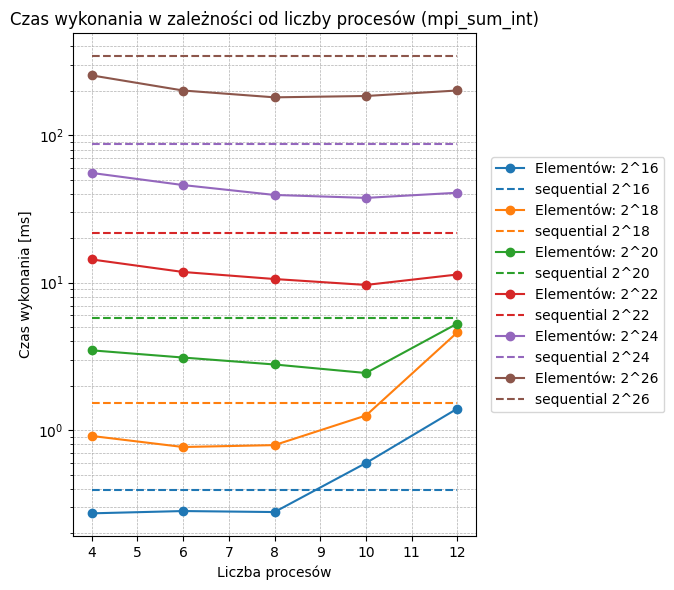

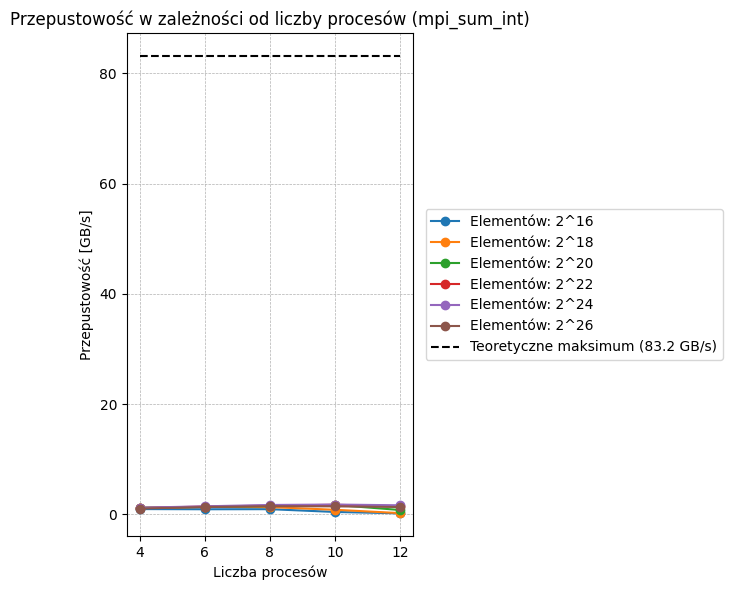

In [51]:
tech = "mpi"
op = "sum"
datatype = "int"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)


### MPI - SUM - DOUBLE

Zapisano wynik do ../results/mpi/mpi_sum_double.csv


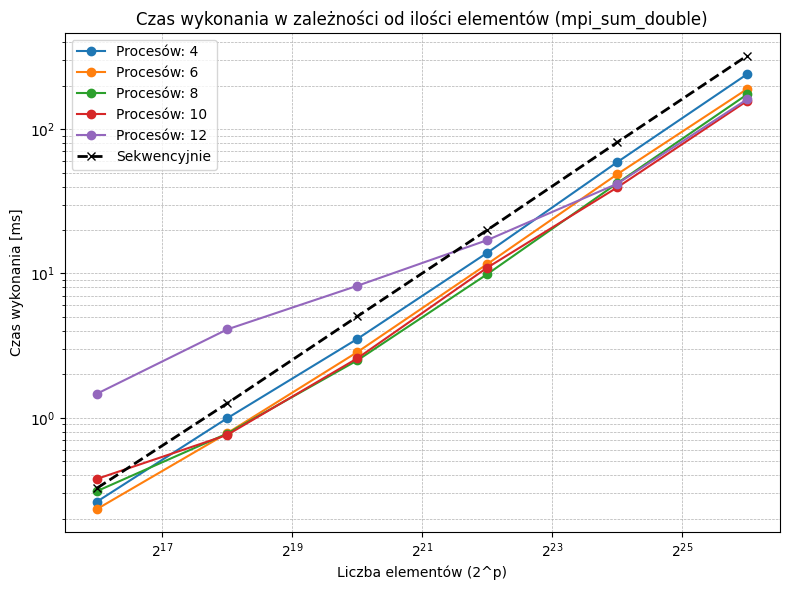

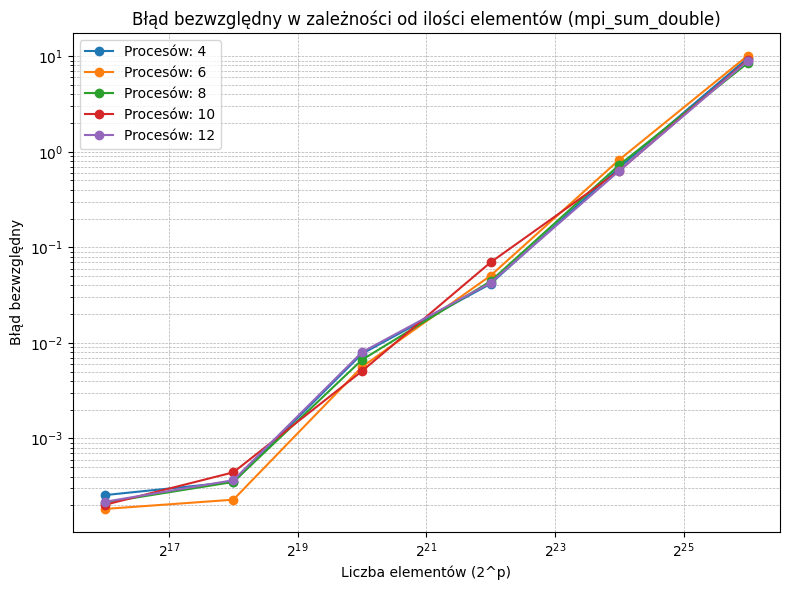

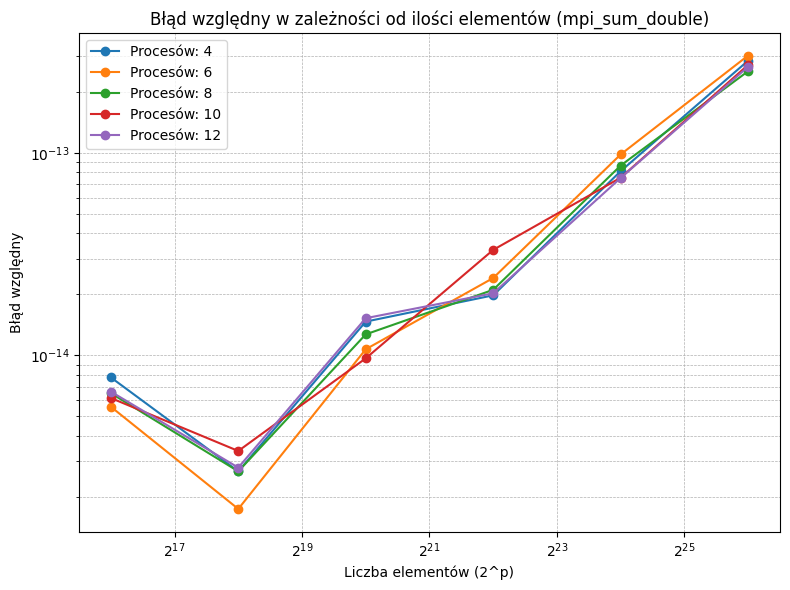

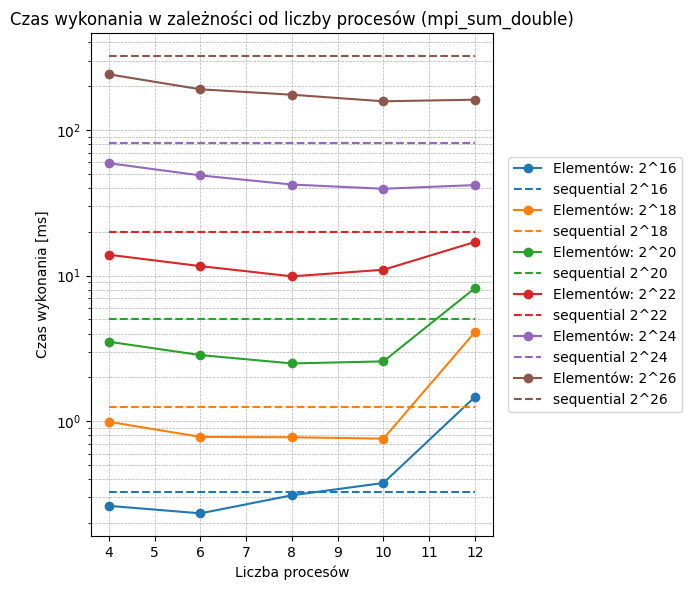

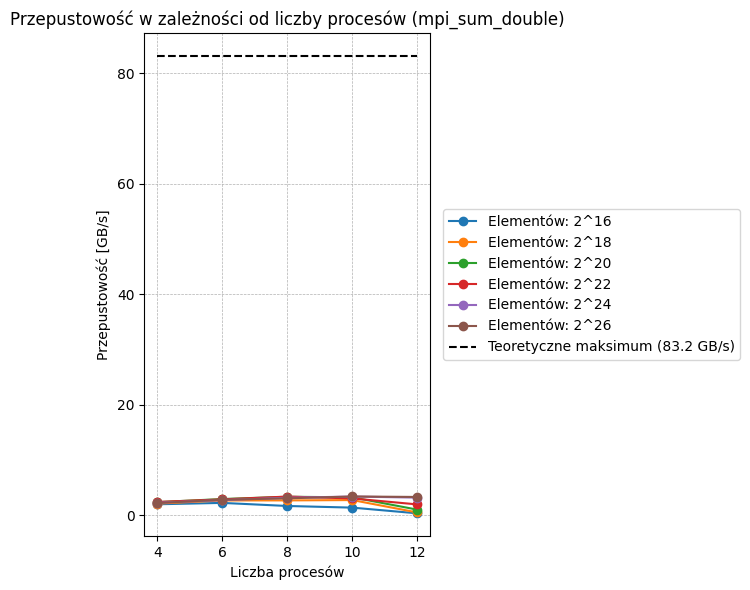

In [52]:
tech = "mpi"
op = "sum"
datatype = "double"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - MIN - INT

Zapisano wynik do ../results/mpi/mpi_min_int.csv


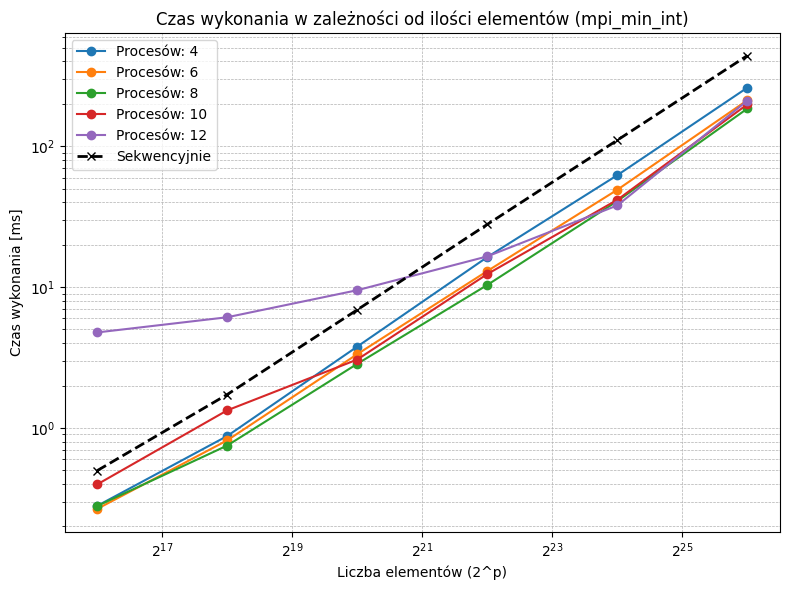

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


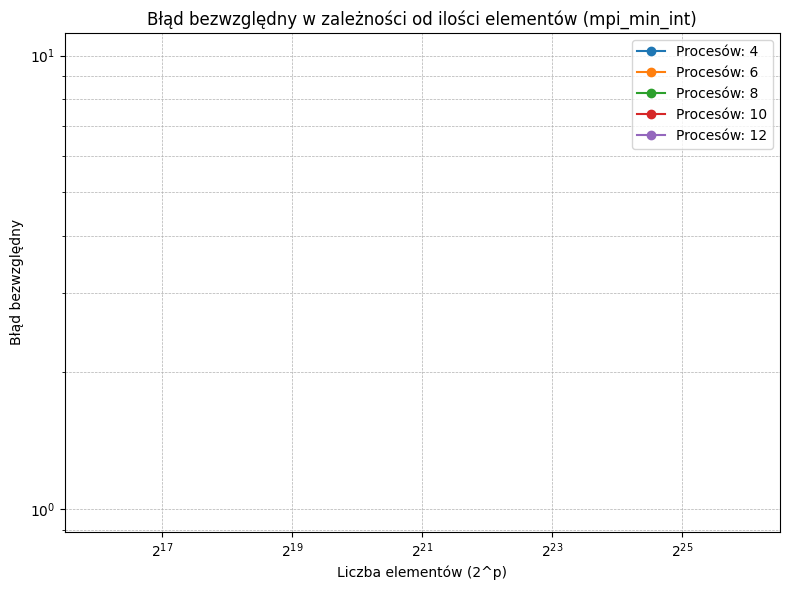

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


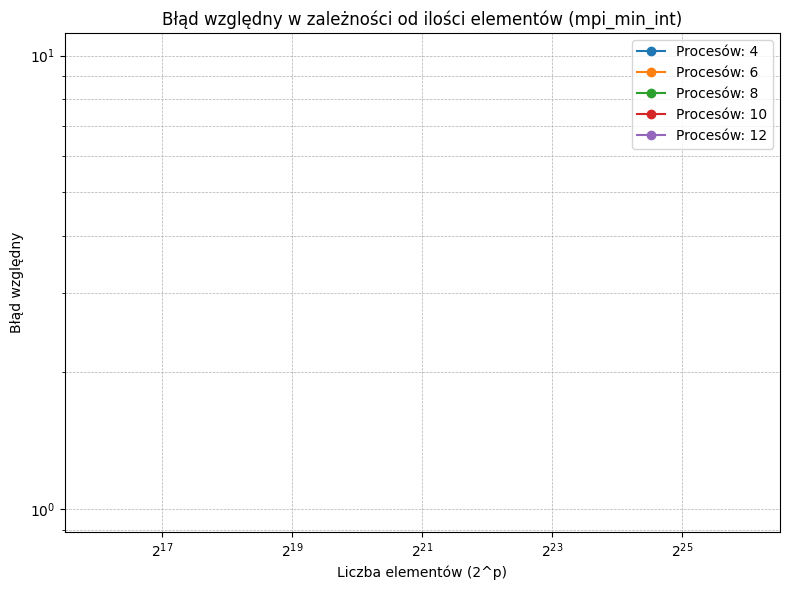

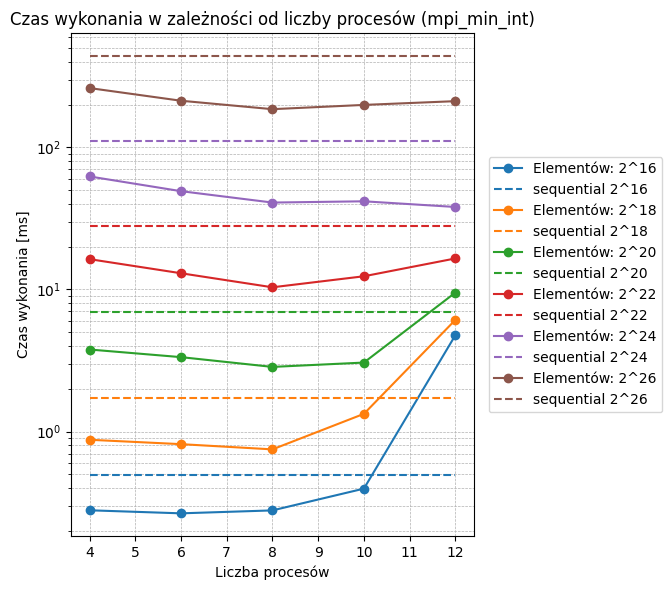

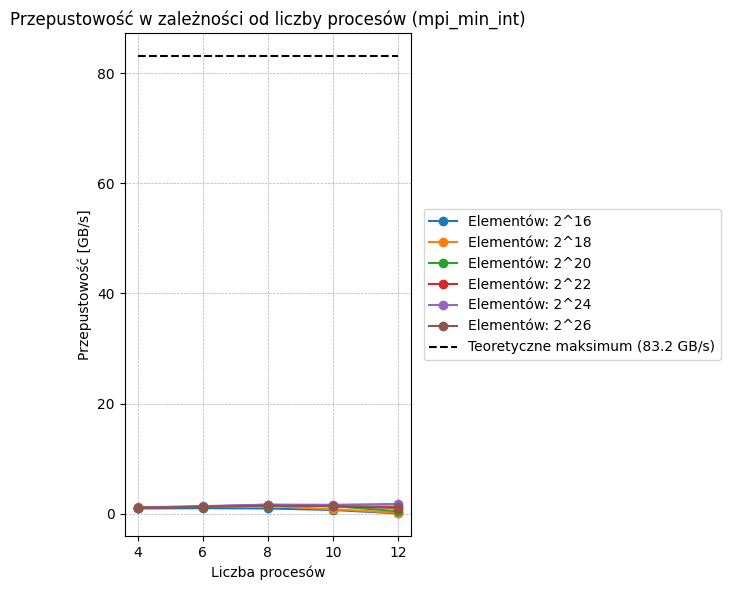

In [53]:
tech = "mpi"
op = "min"
datatype = "int"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - MIN - DOUBLE

Zapisano wynik do ../results/mpi/mpi_min_double.csv


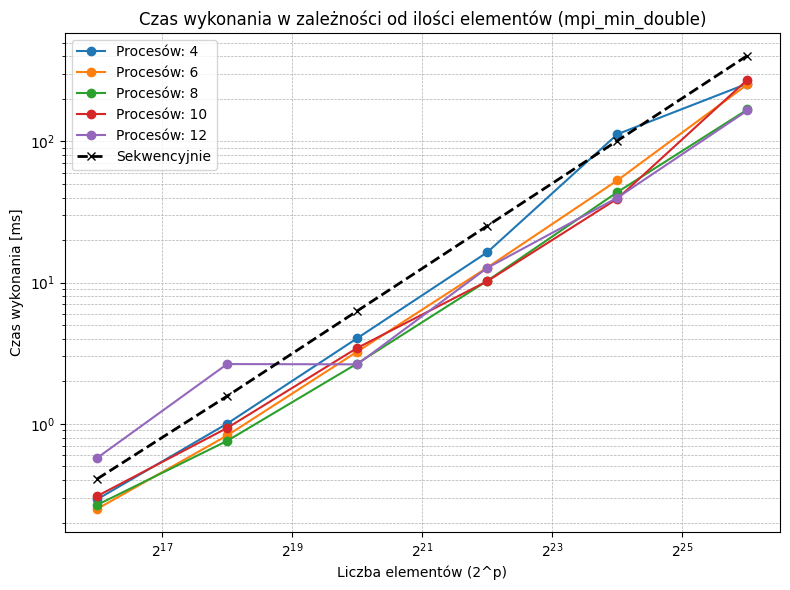

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


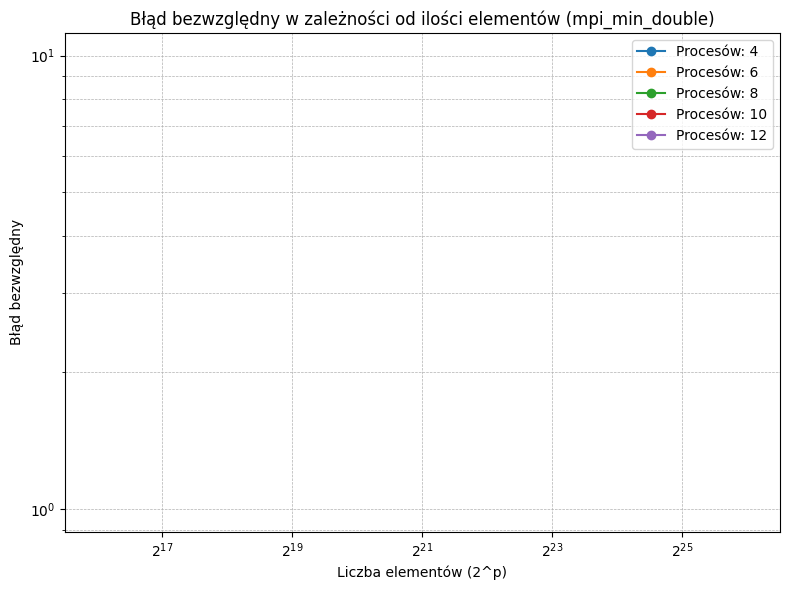

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


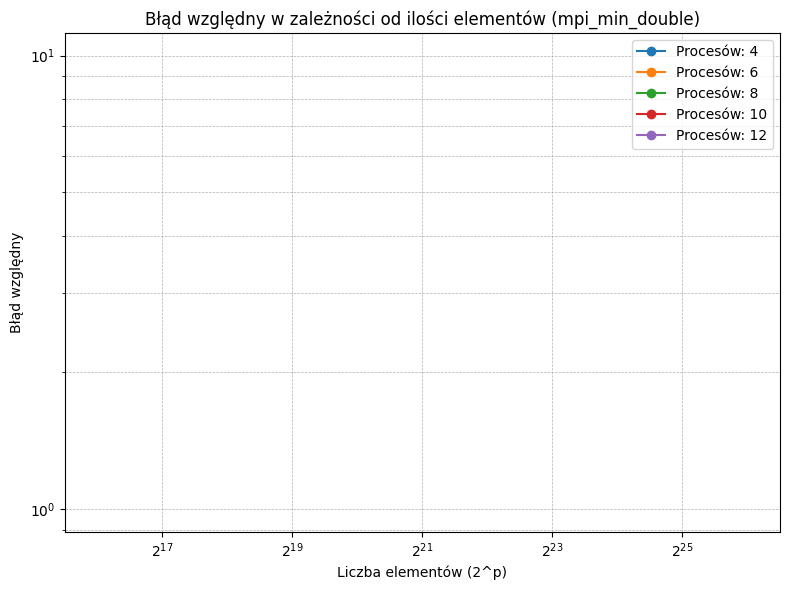

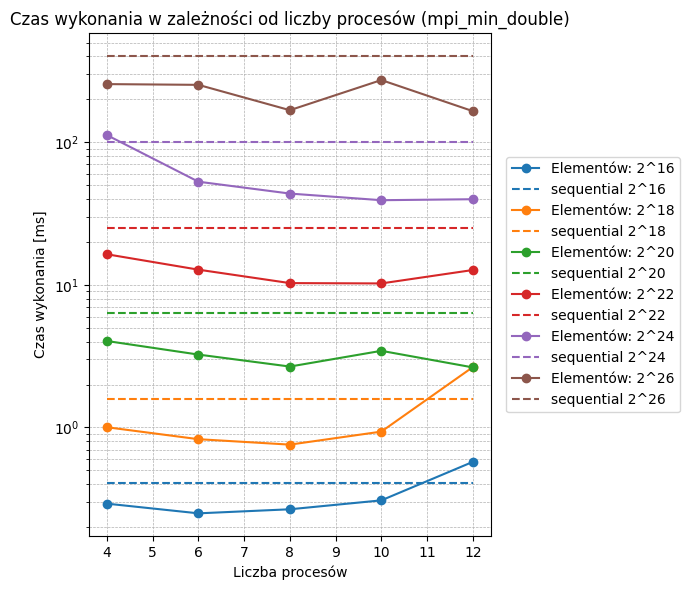

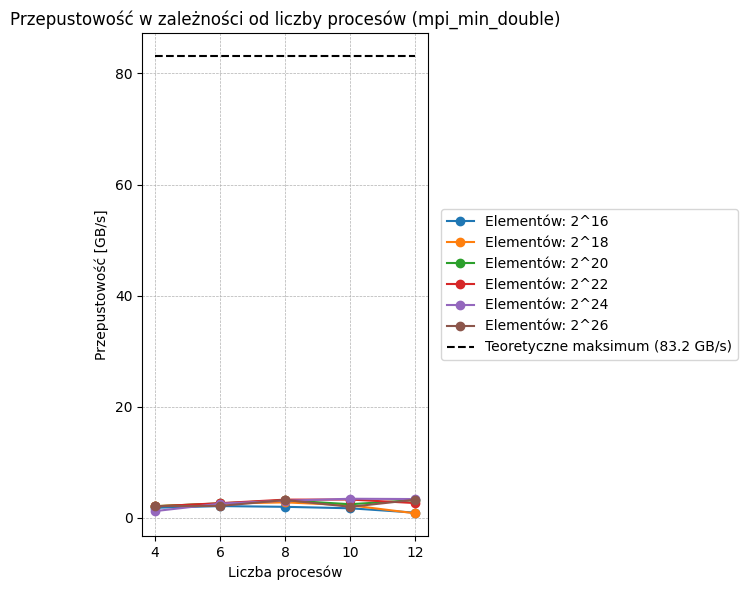

In [54]:
tech = "mpi"
op = "min"
datatype = "double"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - MAX - INT

Zapisano wynik do ../results/mpi/mpi_max_int.csv


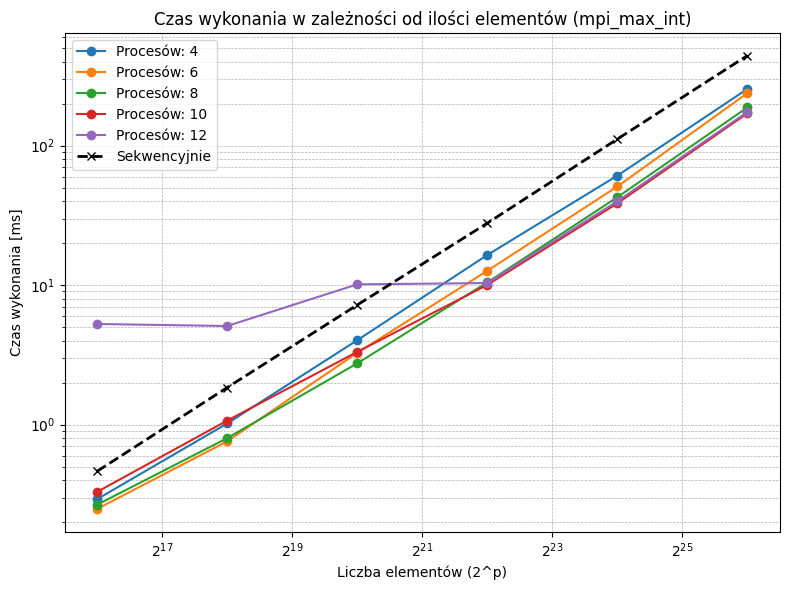

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


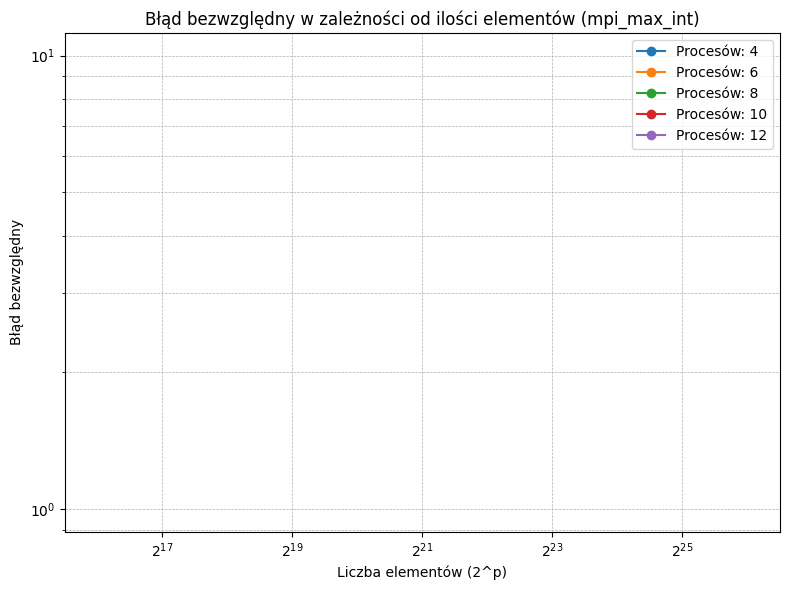

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


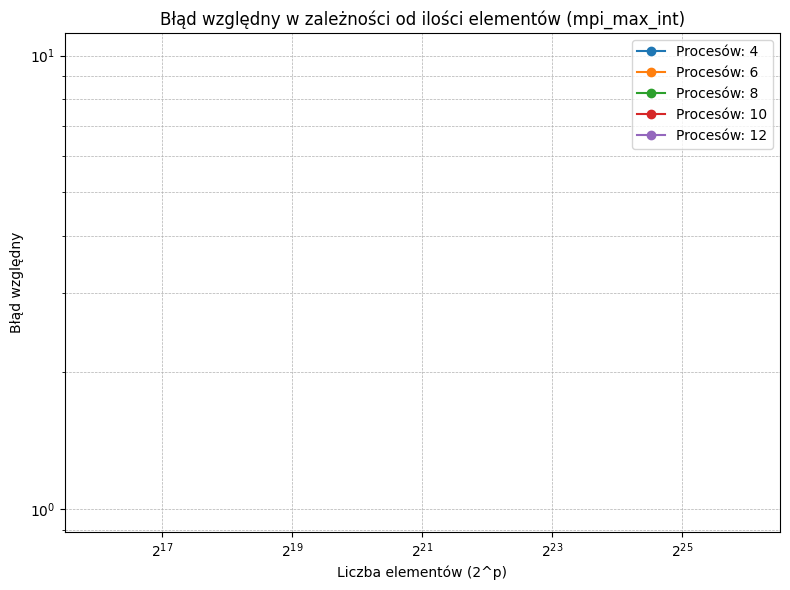

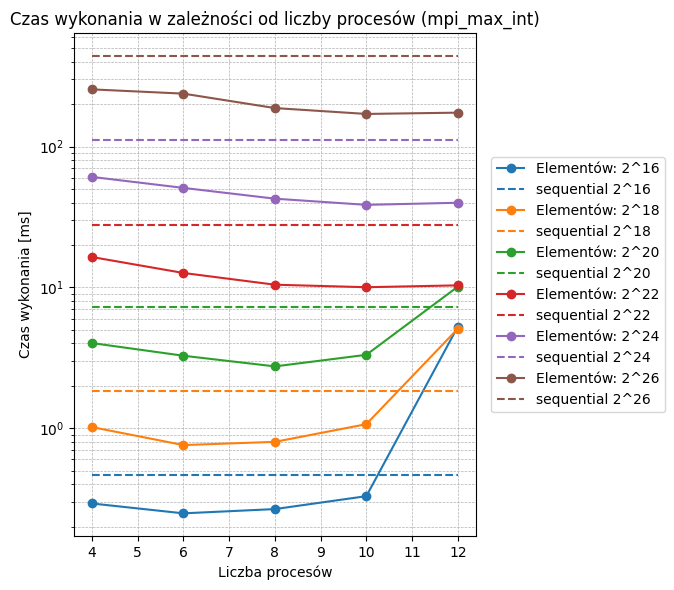

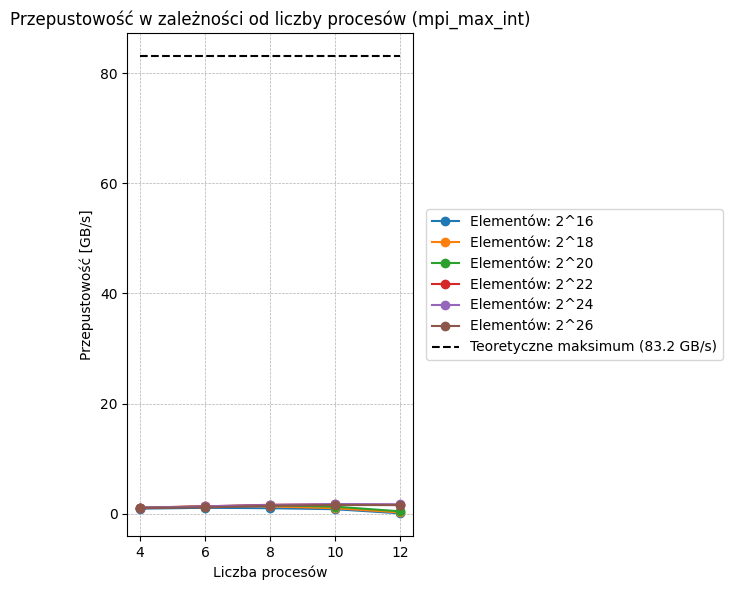

In [55]:
tech = "mpi"
op = "max"
datatype = "int"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - MAX - DOUBLE

Zapisano wynik do ../results/mpi/mpi_max_double.csv


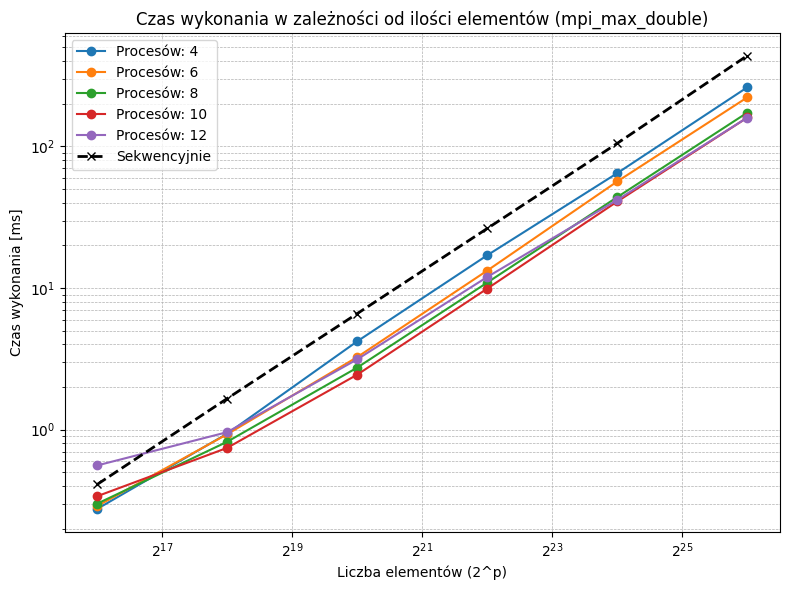

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


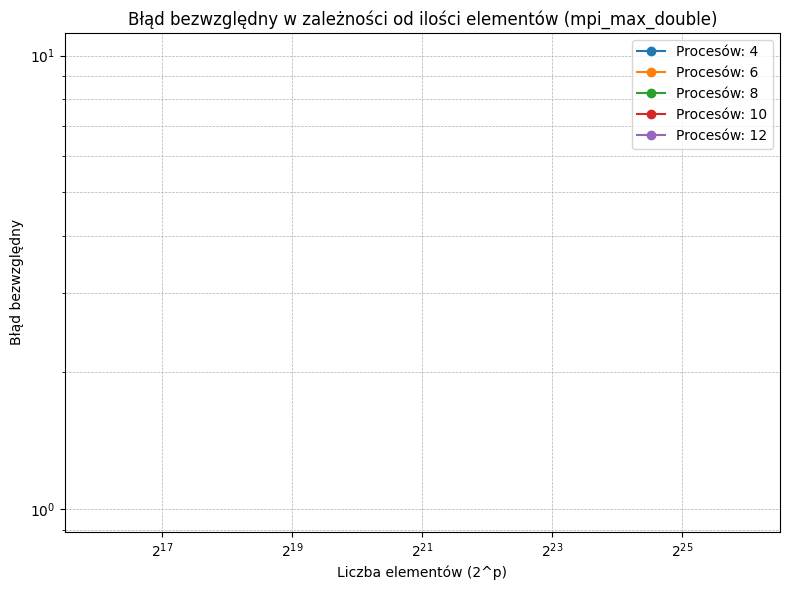

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2711519491.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


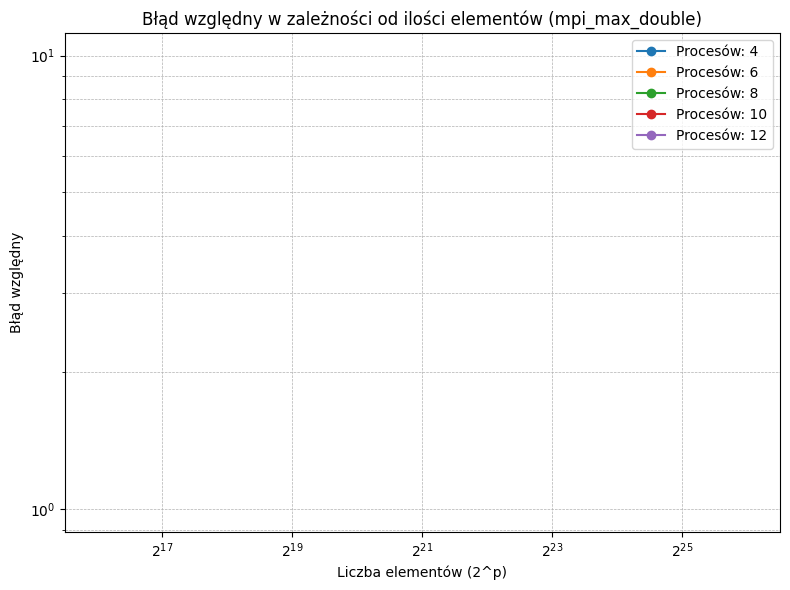

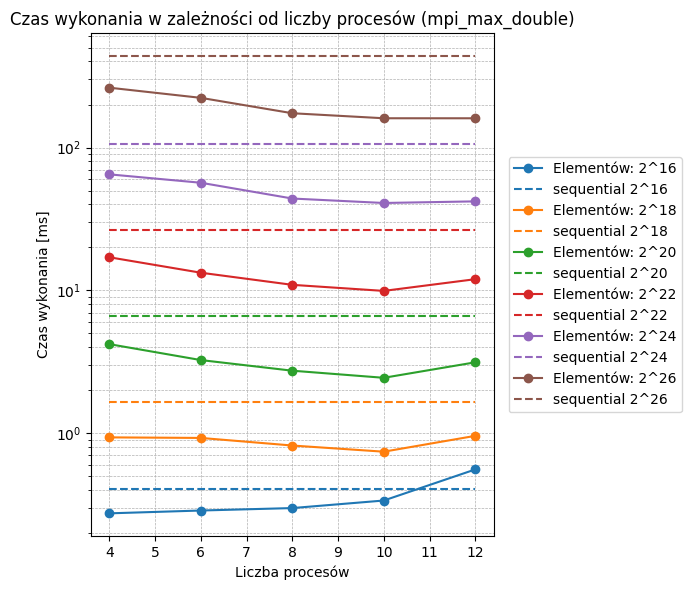

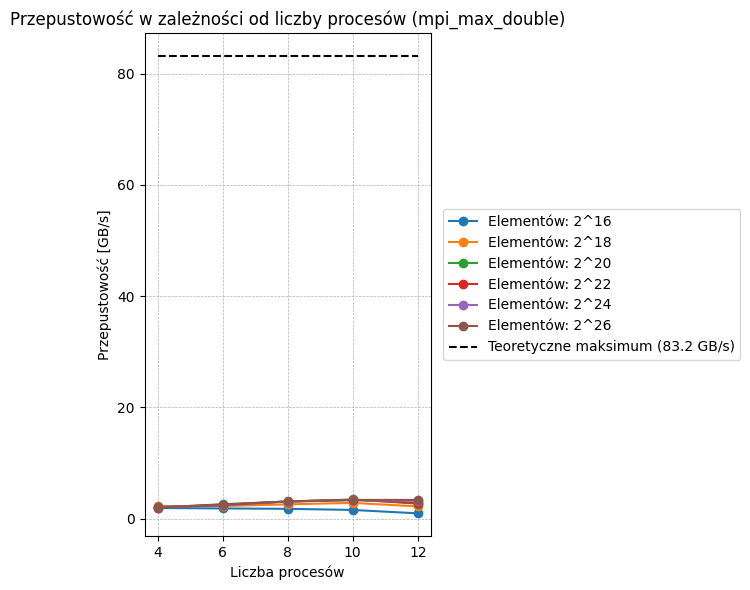

In [57]:
tech = "mpi"
op = "max"
datatype = "double"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - PREFIX - INT

Zapisano wynik do ../results/mpi/mpi_prefix_int.csv


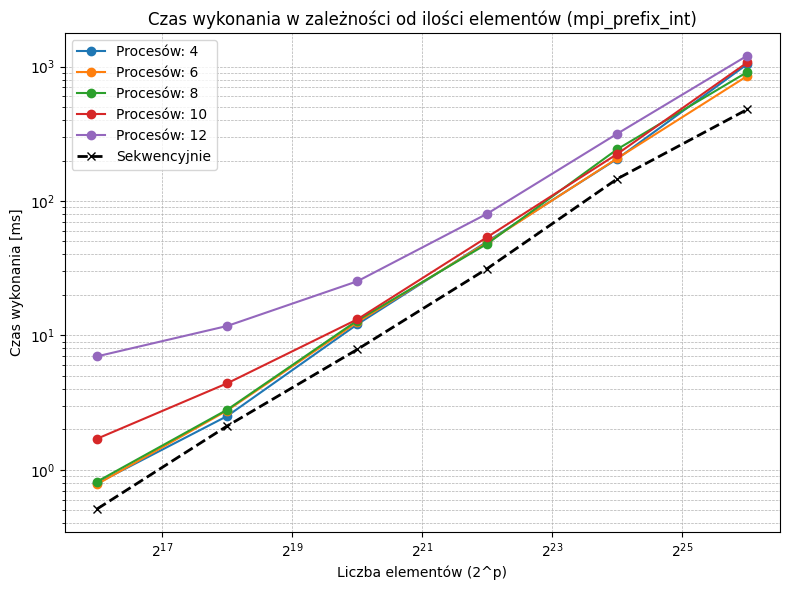

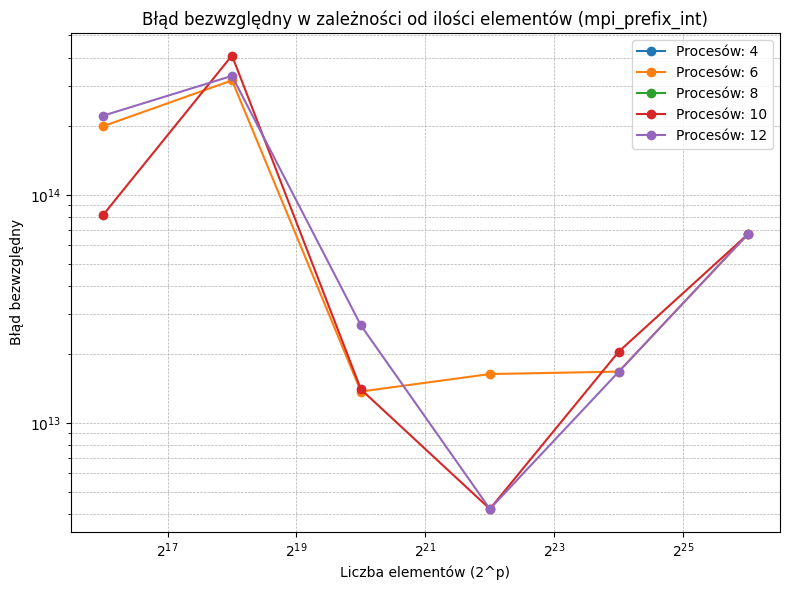

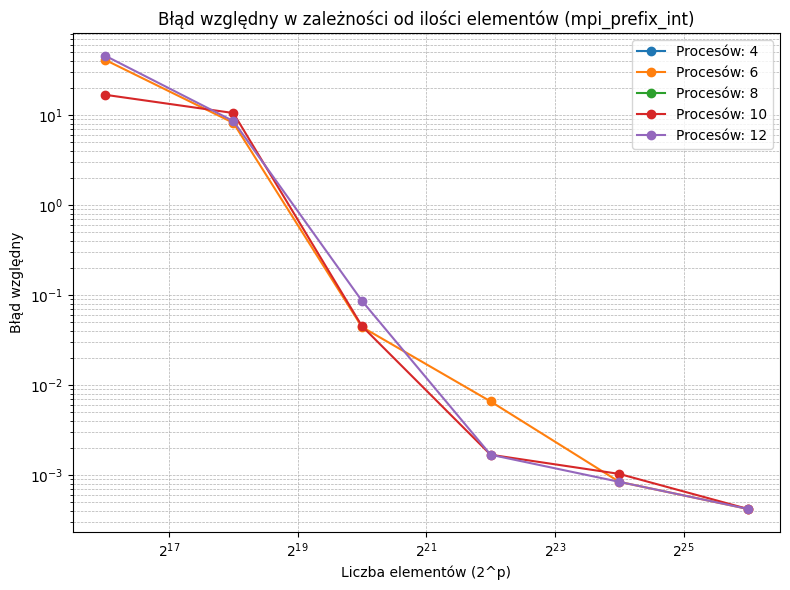

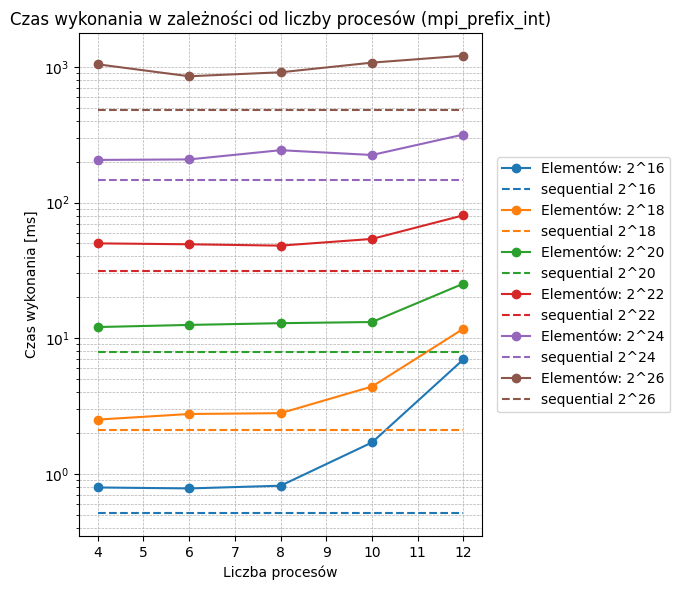

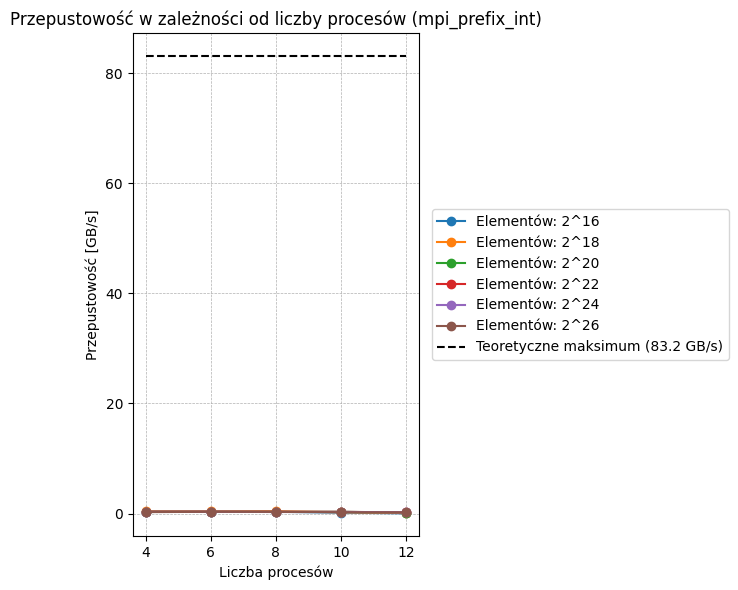

In [58]:
tech = "mpi"
op = "prefix"
datatype = "int"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### MPI - PREFIX - DOUBLE

Zapisano wynik do ../results/mpi/mpi_prefix_double.csv


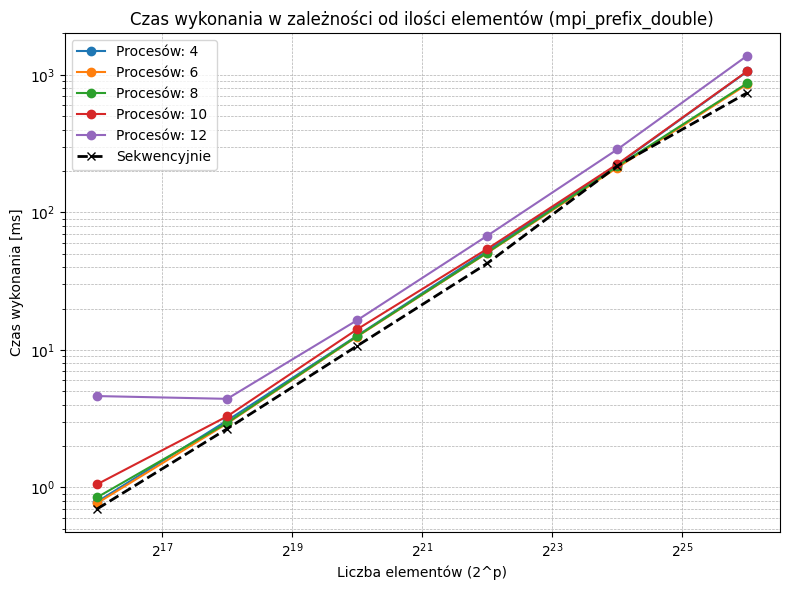

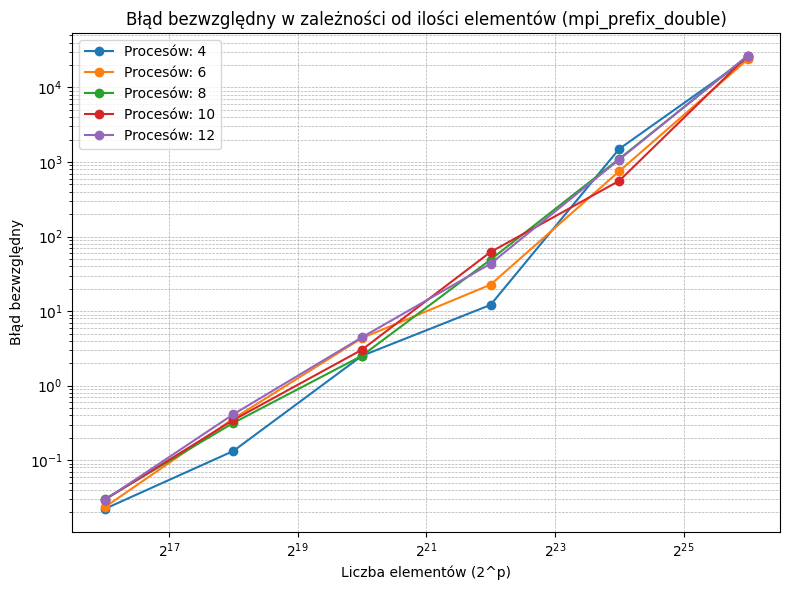

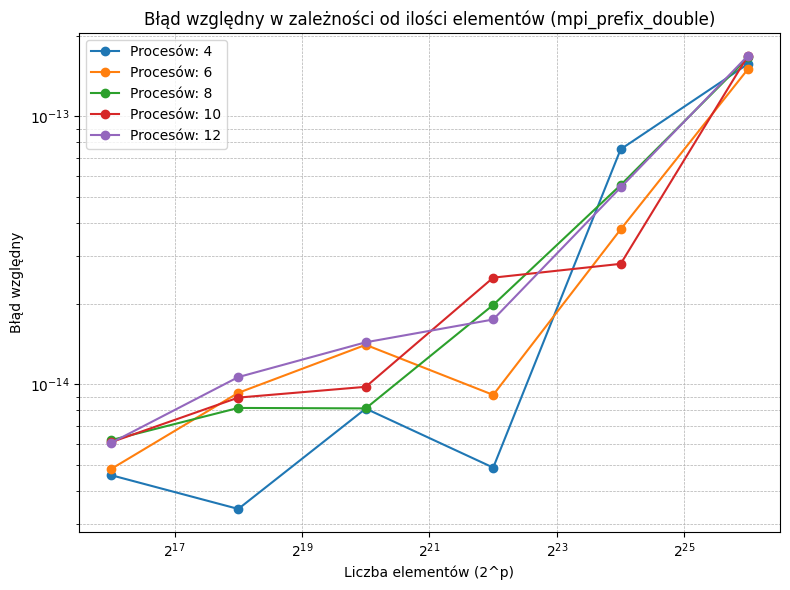

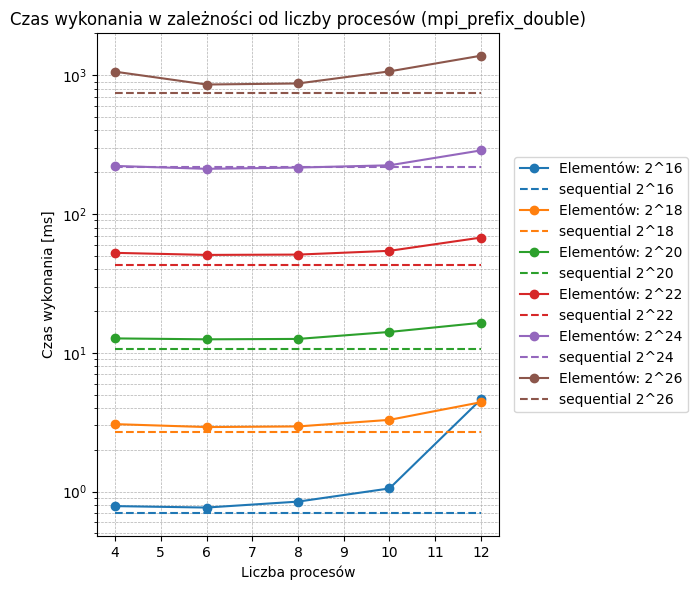

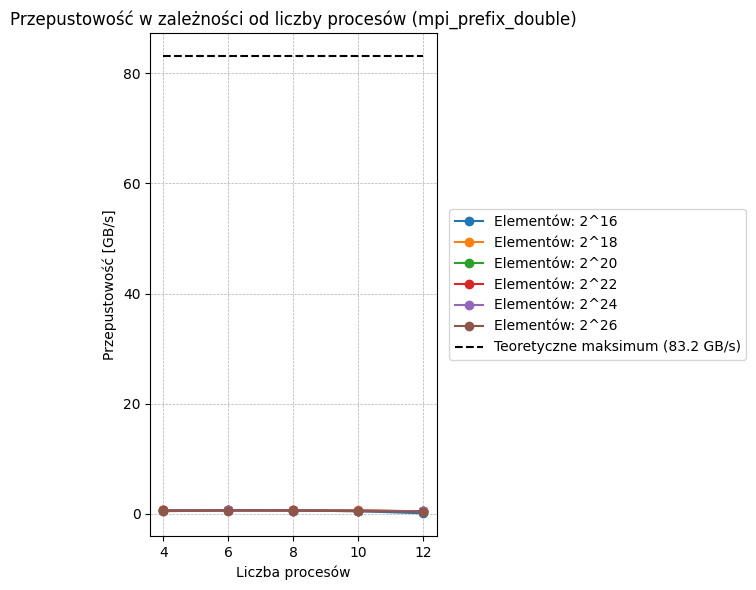

In [148]:
tech = "mpi"
op = "prefix"
datatype = "double"

reduce_mean(f"../results/mpi/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

## OPENMP

### Funkcja do liczenia średnich z plików csv dla OpenMP

In [122]:
def reduce_mean_openmp(path):
    df = pd.read_csv(path)
    result = (
        df.groupby(["power", "threads"], as_index=False)
        .agg({
            "time": "mean",
            "abs_err": "mean",
            "rel_err": "mean"
        })
    )
    result.to_csv(path, index=False)
    print("Zapisano wynik do", path)

### Funkcja do wyświetlania wykresów dla OpenMP

In [80]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_time_vs_elements(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania (ms) w zależności od ilości elementów (2^power)
    Serie odpowiadają liczbie wątków.
    Dodatkowo rysujemy linię z danych sekwencyjnych df_seq (kolumny: power, time).
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["time"], marker='o', label=f"Wątków: {proc}")

    if df_seq is not None and not df_seq.empty:
        plt.plot(2**df_seq["power"], df_seq["time"], marker='x', linestyle='--', color='k', linewidth=2, label="Sekwencyjnie")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_abs_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd bezwzględny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["abs_err"], marker='o', label=f"Wątków: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd bezwzględny")
    plt.title(f"Błąd bezwzględny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_rel_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd względny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["rel_err"], marker='o', label=f"Wątków: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd względny")
    plt.title(f"Błąd względny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_time_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania w zależności od liczby wątków
    (dla każdego rozmiaru danych osobna linia).
    Dla każdego power rysujemy dodatkowo poziomą, przerywaną linię z czasu sekwencyjnego
    używając tego samego koloru co linia dla danej grupy. Legenda jest poza obszarem wykresu.
    """
    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        line = plt.plot(group["threads"], group["time"], marker='o', label=f"Elementów 2^{power}")
        color = line[0].get_color()

        if df_seq is not None and not df_seq.empty:
            seq_row = df_seq[df_seq["power"] == power]
            if not seq_row.empty:
                seq_time = seq_row["time"].values[0]
                x_min, x_max = group["threads"].min(), group["threads"].max()
                plt.hlines(seq_time, x_min, x_max, colors=color, linestyles='--', linewidth=1.5, label=f"Elementów: 2^{power} (Sekwencyjnie)")

    # plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba wątków")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od liczby wątków ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()


# --- NOWA FUNKCJA: przepustowość vs liczba procesów ---
def plot_bandwith_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: przepustowość (GB/s) w zależności od liczby procesów.
    Serie: różne rozmiary danych (2^power).
    Rysuje poziomą przerywaną linię z teoretycznym maksimum (GPU dla 'cuda' w dtype_label, w przeciwnym razie CPU).
    """
    # określ rozmiar pojedynczego elementu w bajtach na podstawie dtype_label
    lbl = dtype_label.lower()
    if "double" in lbl:
        elem_size = 8
    elif "int64" in lbl or "int64_t" in lbl:
        elem_size = 8
    else:
        # domyślnie zwykły int -> 4 bajty
        elem_size = 4

    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        # liczba elementów = 2^power
        elements = 2 ** int(power)
        # czas w sekundach (zakładamy, że kolumna 'time' jest w ms)
        times_s = group["time"].astype(float) / 1000.0
        # unikamy dzielenia przez zero
        times_s = times_s.replace(0, 1e-9)

        # przepustowość w GB/s
        bandwidth_gbs = (elements * elem_size) / times_s / 1e9

        plt.plot(group["threads"], bandwidth_gbs, marker="o", label=f"Elementów: 2^{power}")

    # wybierz teoretyczne maksimum na podstawie technologii zawartej w dtype_label
    theoretical_max = GPU_BANDWIDTH if "cuda" in lbl else CPU_BANDWIDTH
    x_min, x_max = df["threads"].min(), df["threads"].max()
    plt.hlines(theoretical_max, x_min, x_max, colors="k", linestyles="--", linewidth=1.5, label=f"Teoretyczne maksimum ({theoretical_max} GB/s)")

    plt.xlabel("Liczba wątków")
    plt.ylabel("Przepustowość [GB/s]")
    plt.title(f"Przepustowość w zależności od liczby wątków ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()

### OpenMP - SUM - INT

Zapisano wynik do ../results/openmp/openmp_sum_int.csv


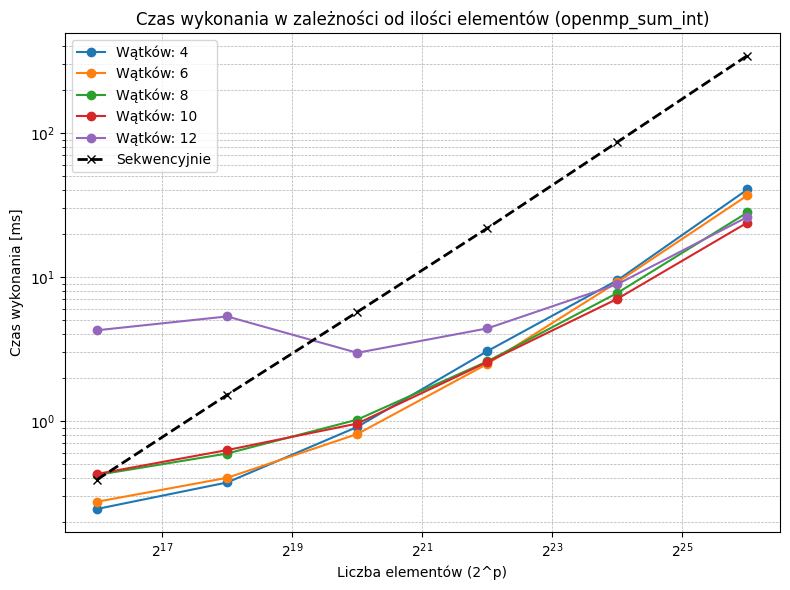

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


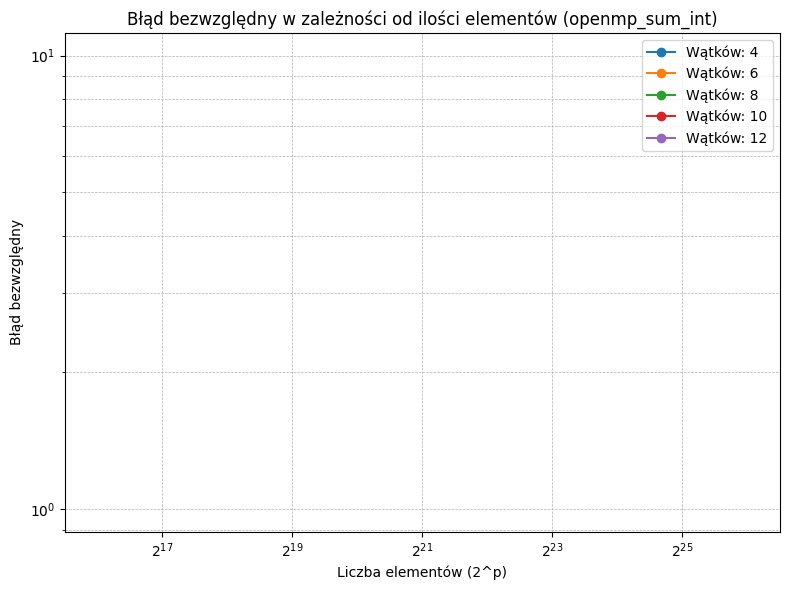

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


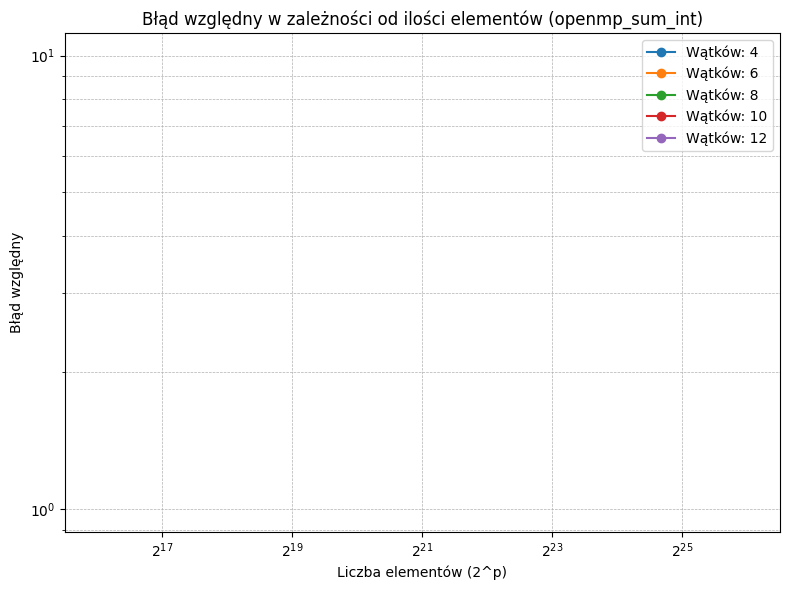

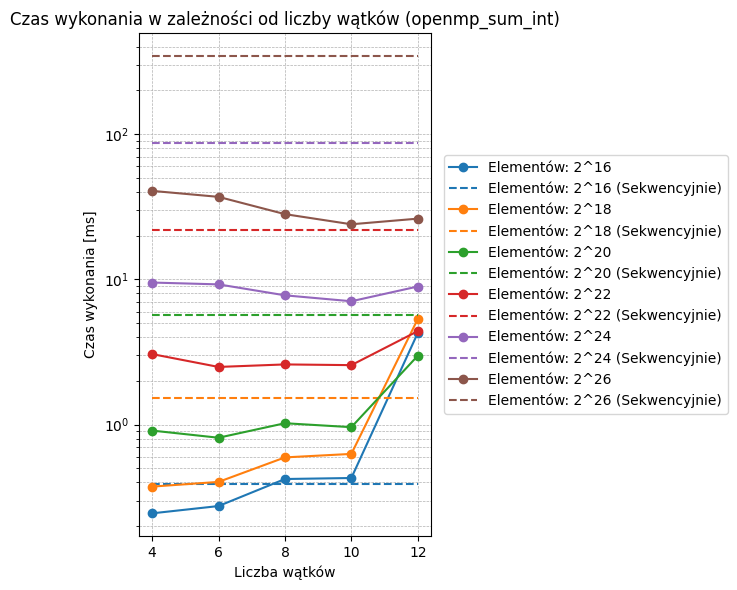

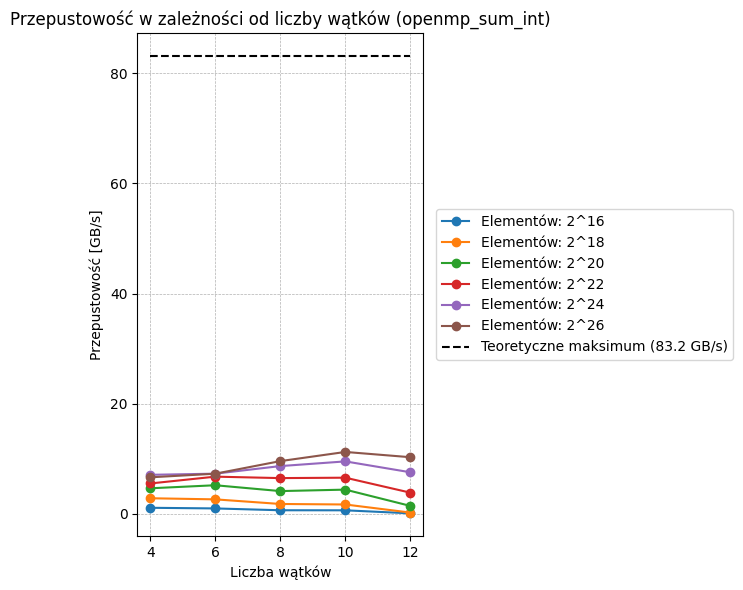

In [81]:
tech = "openmp"
op = "sum"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - SUM - DOUBLE

Zapisano wynik do ../results/openmp/openmp_sum_double.csv


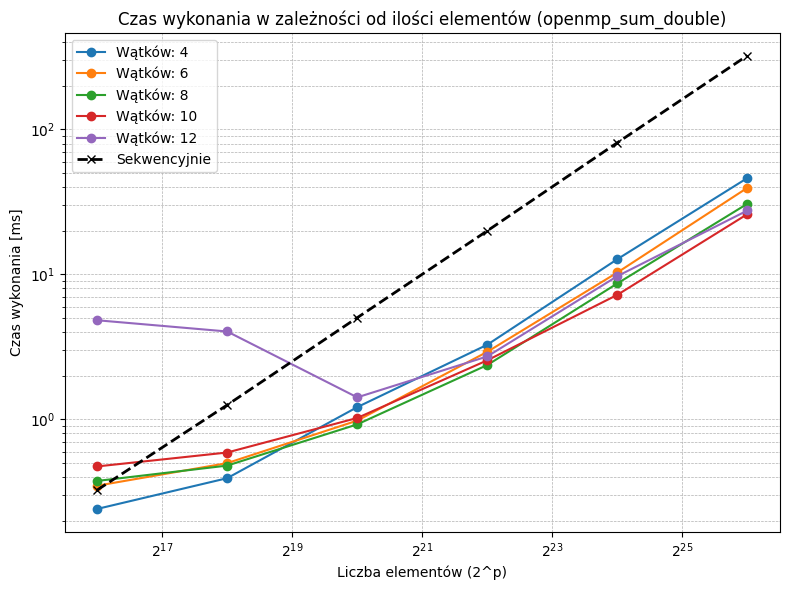

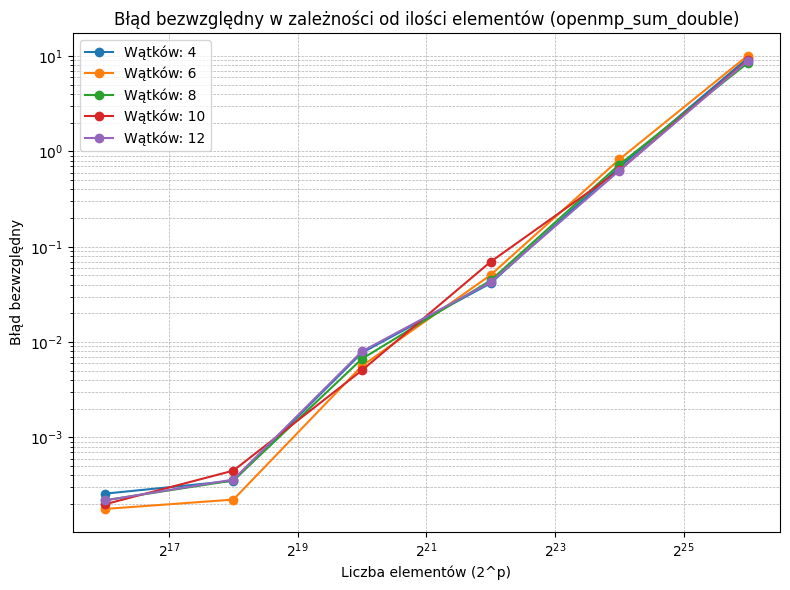

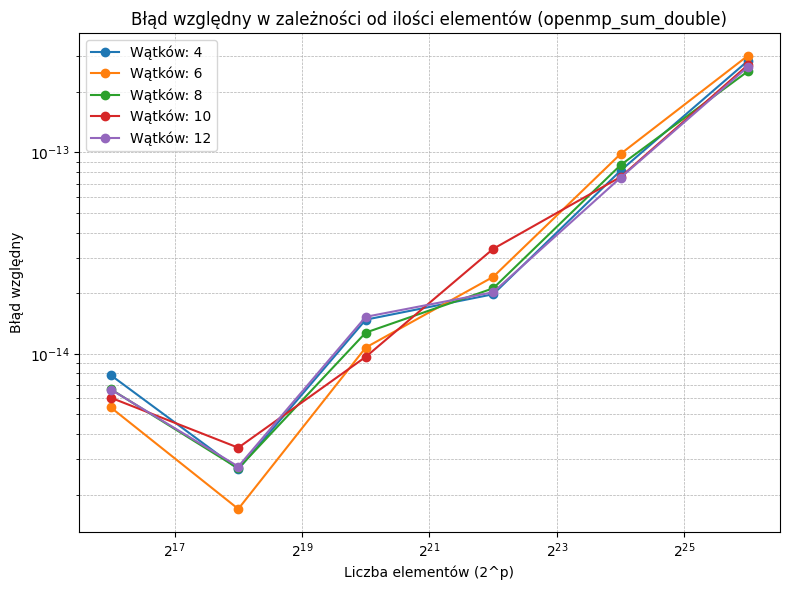

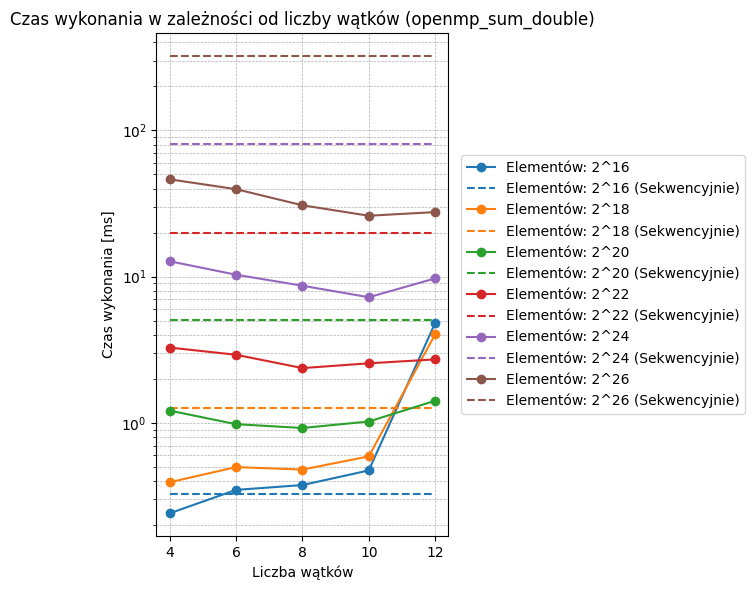

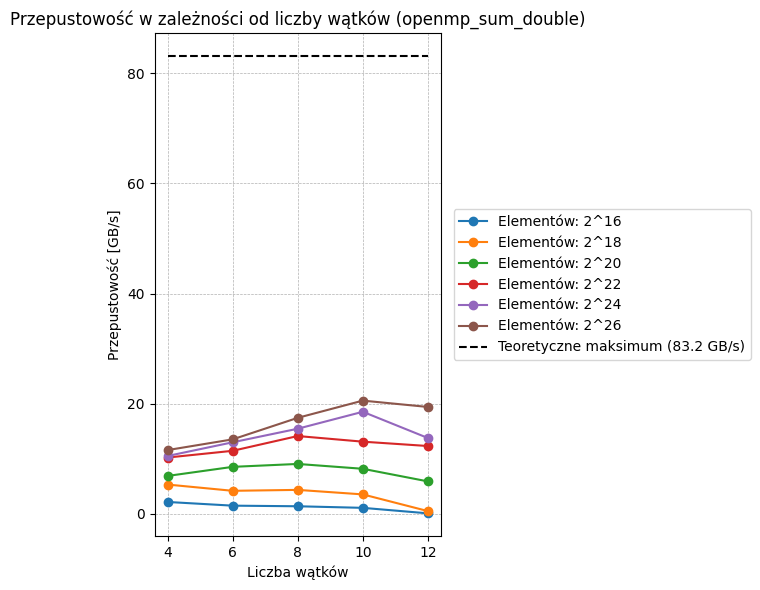

In [82]:
tech = "openmp"
op = "sum"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - MIN - INT

Zapisano wynik do ../results/openmp/openmp_min_int.csv


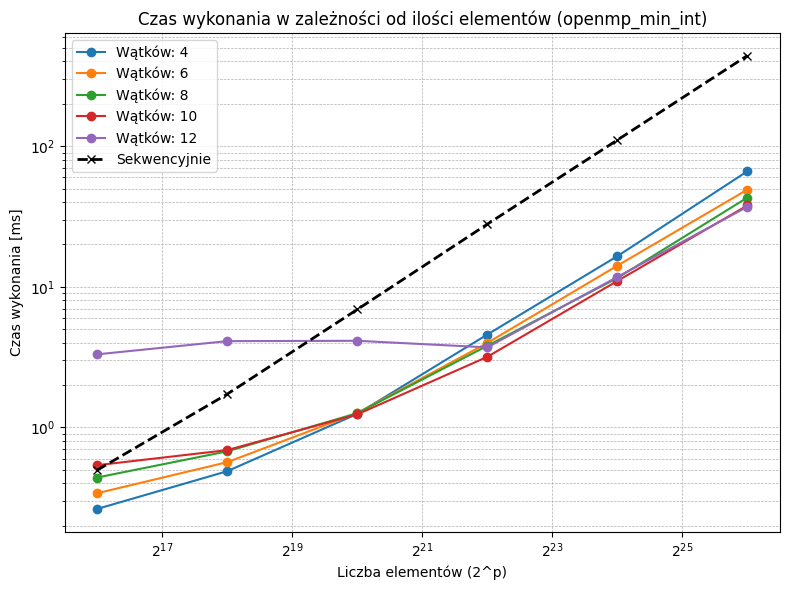

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


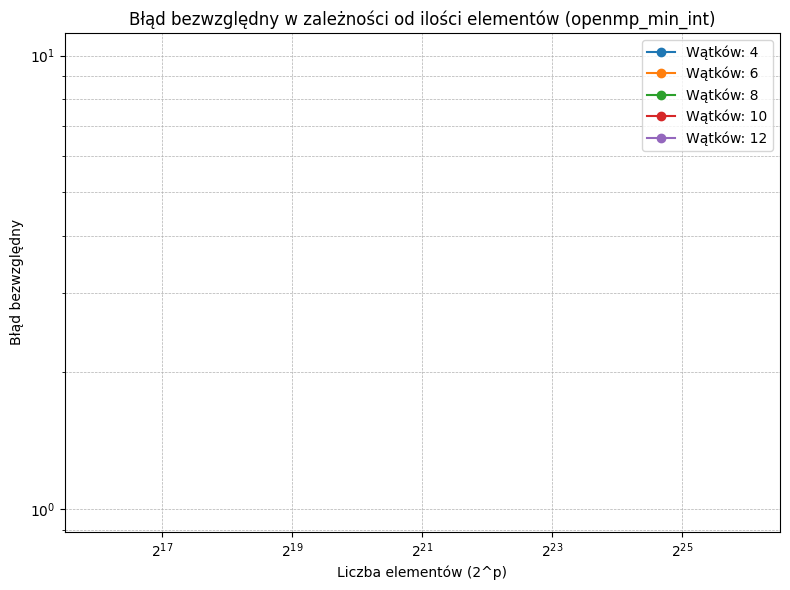

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


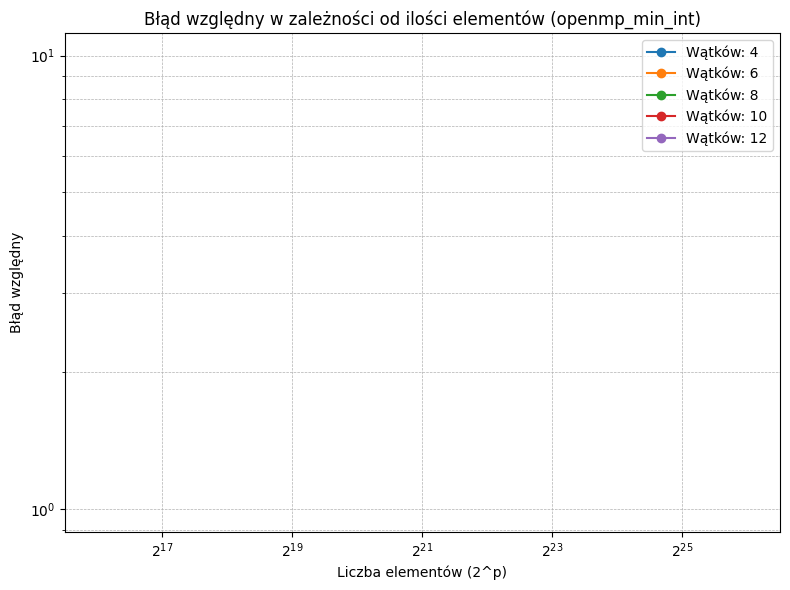

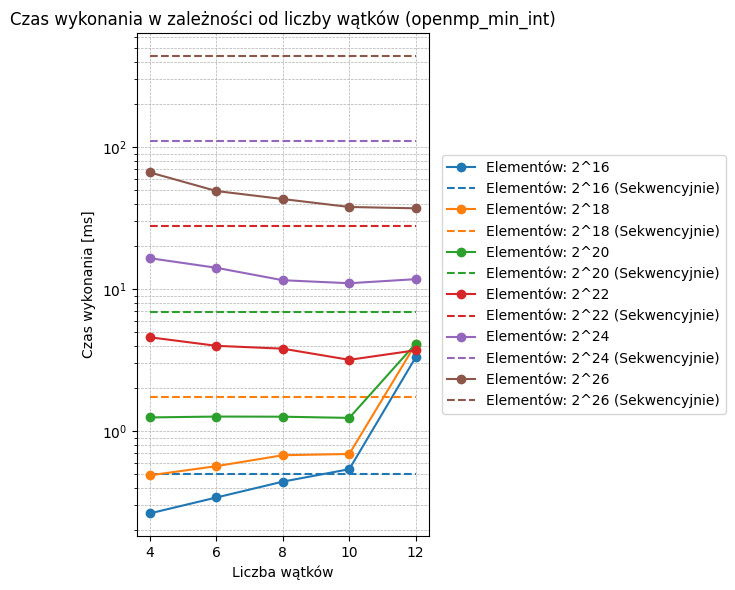

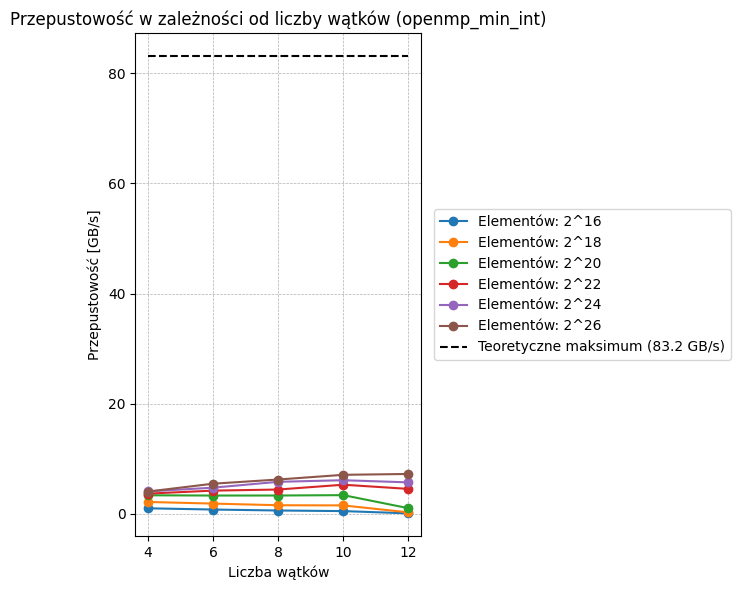

In [83]:
tech = "openmp"
op = "min"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - MIN - DOUBLE

Zapisano wynik do ../results/openmp/openmp_min_double.csv


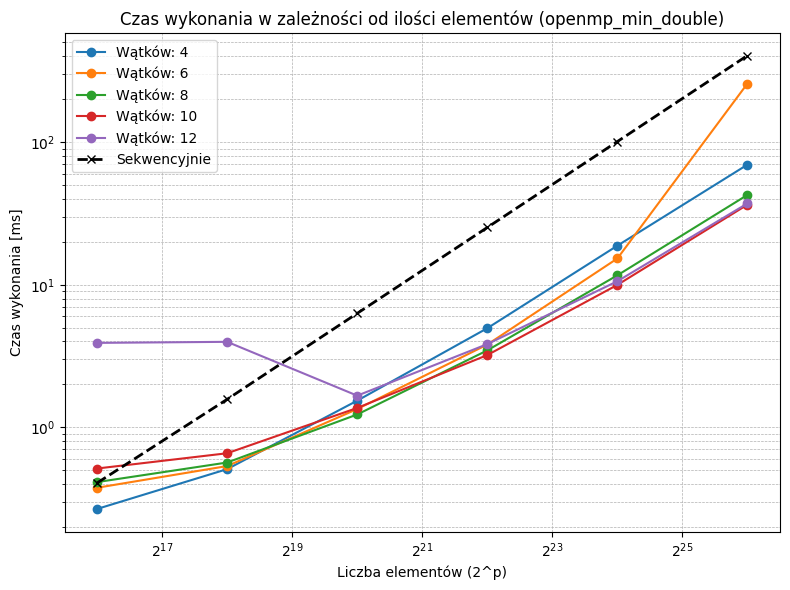

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


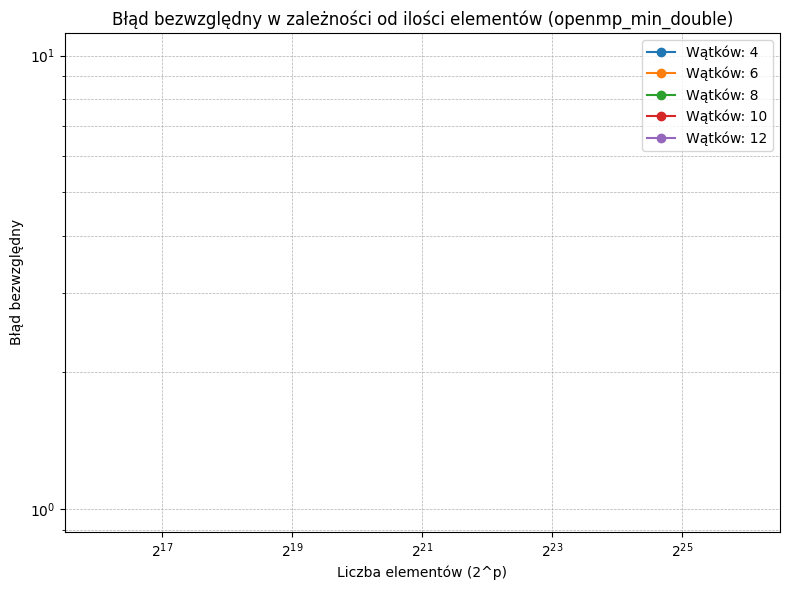

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


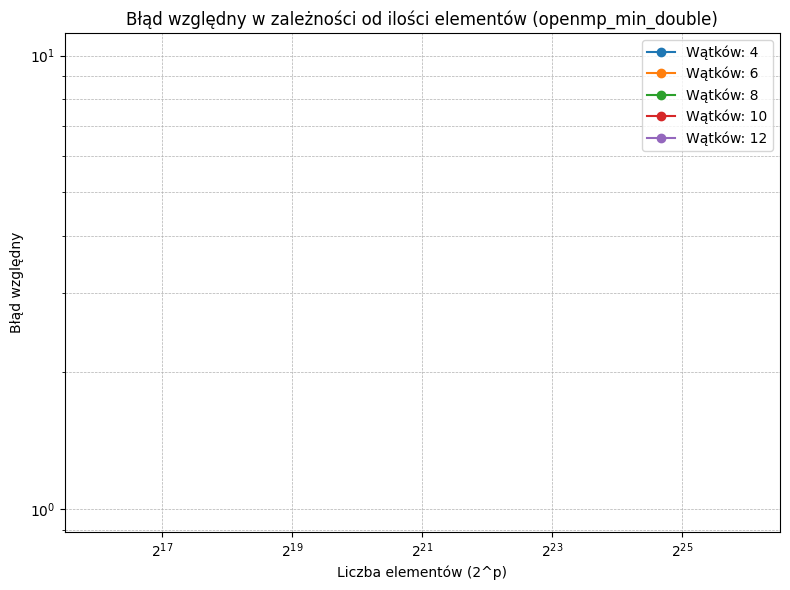

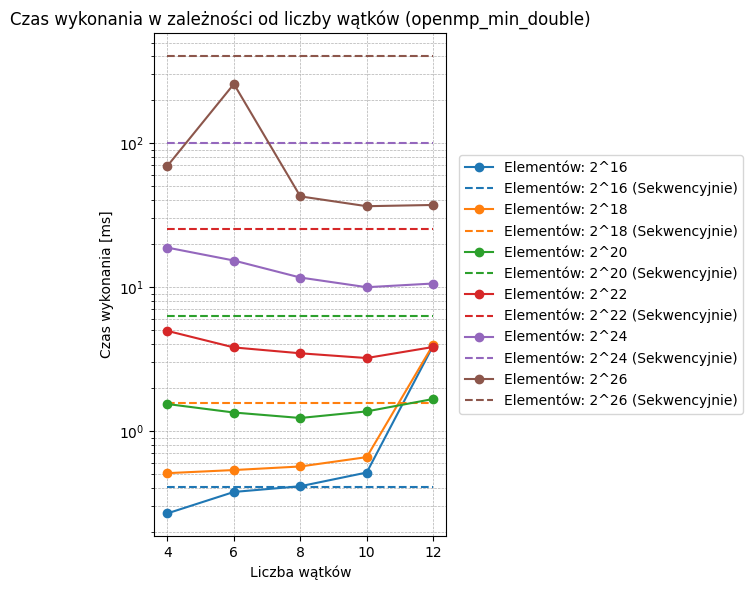

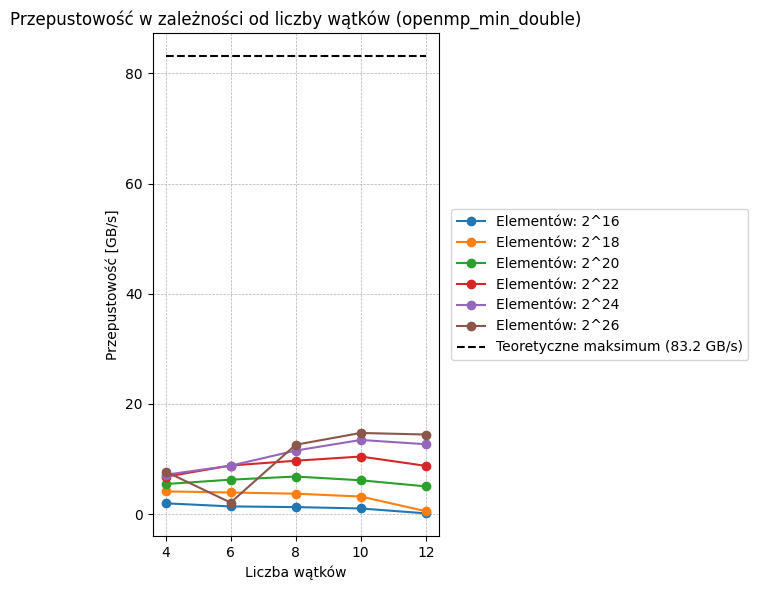

In [84]:
tech = "openmp"
op = "min"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - MAX - INT

Zapisano wynik do ../results/openmp/openmp_max_int.csv


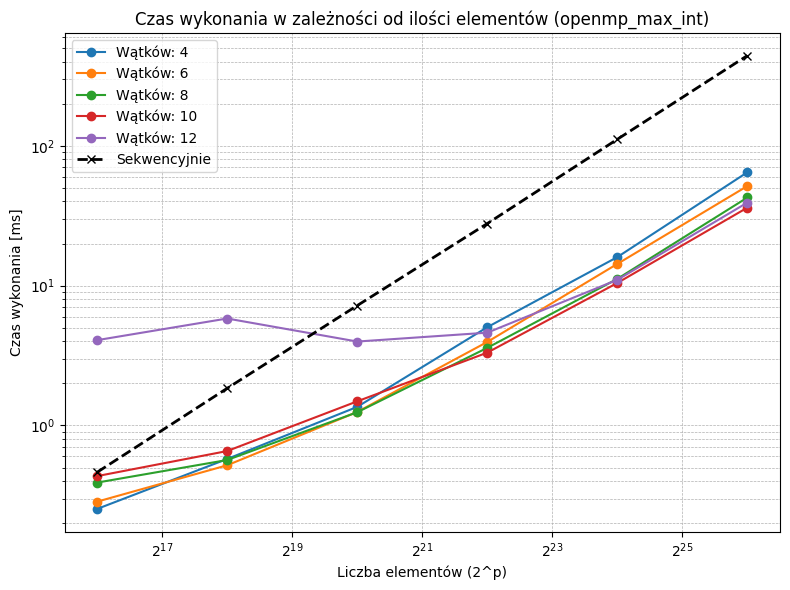

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


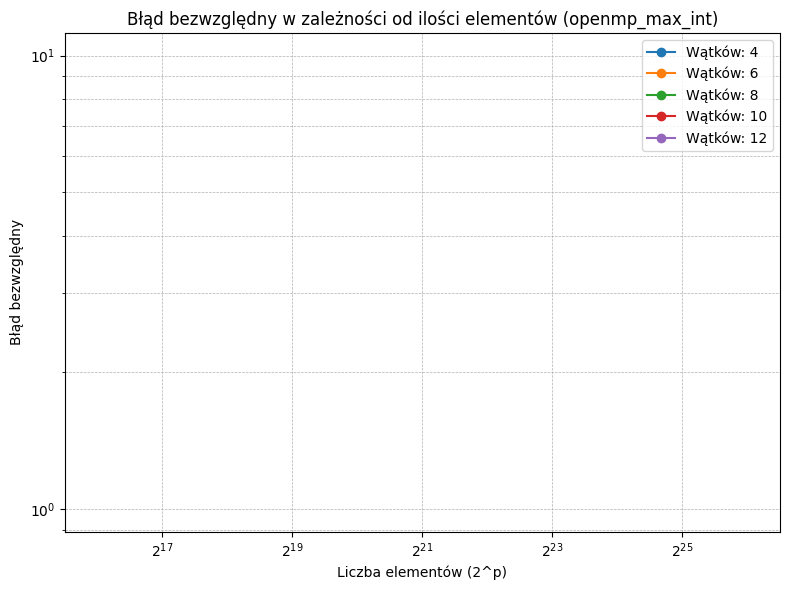

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


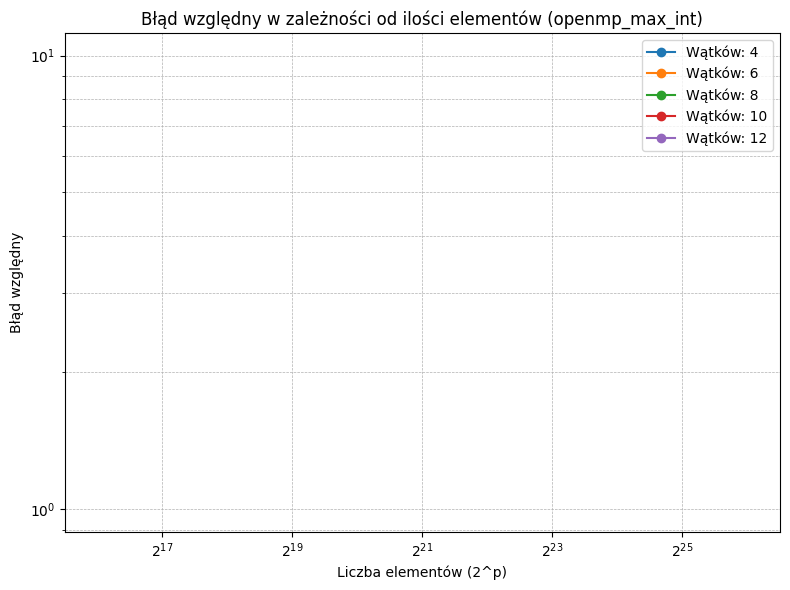

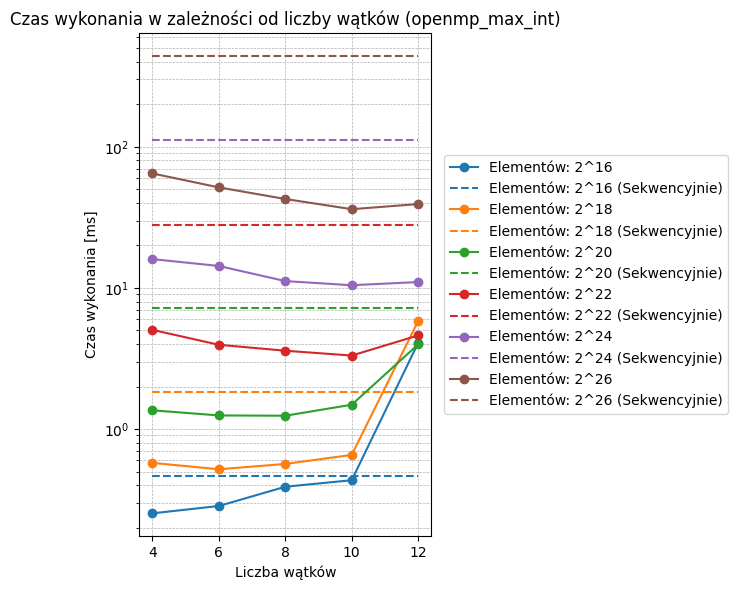

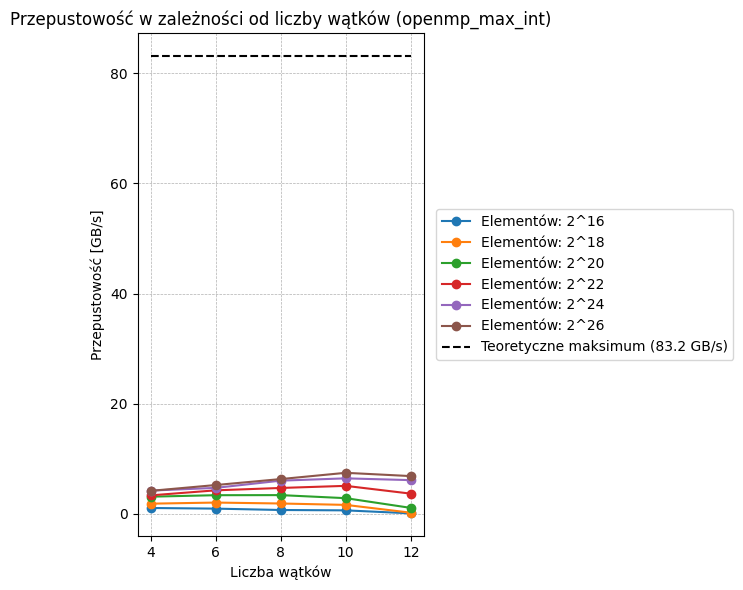

In [85]:
tech = "openmp"
op = "max"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - MAX - DOUBLE

Zapisano wynik do ../results/openmp/openmp_max_double.csv


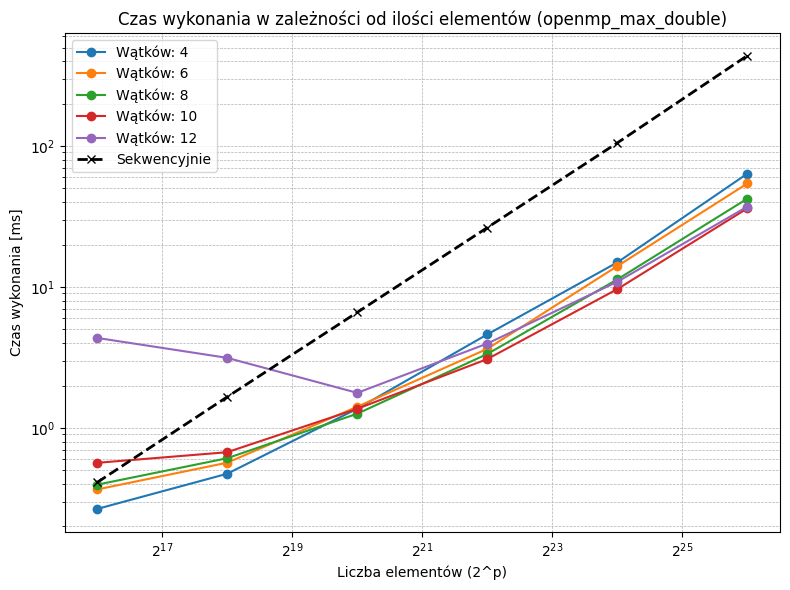

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


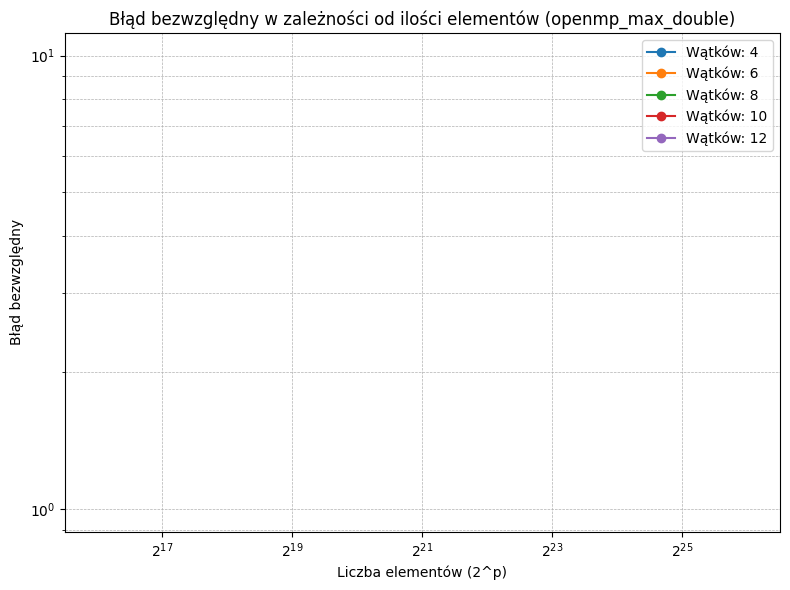

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


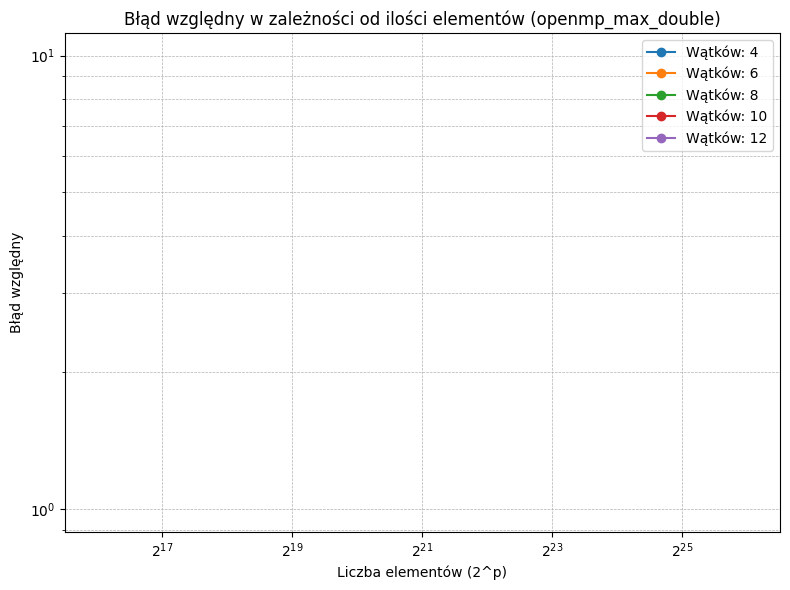

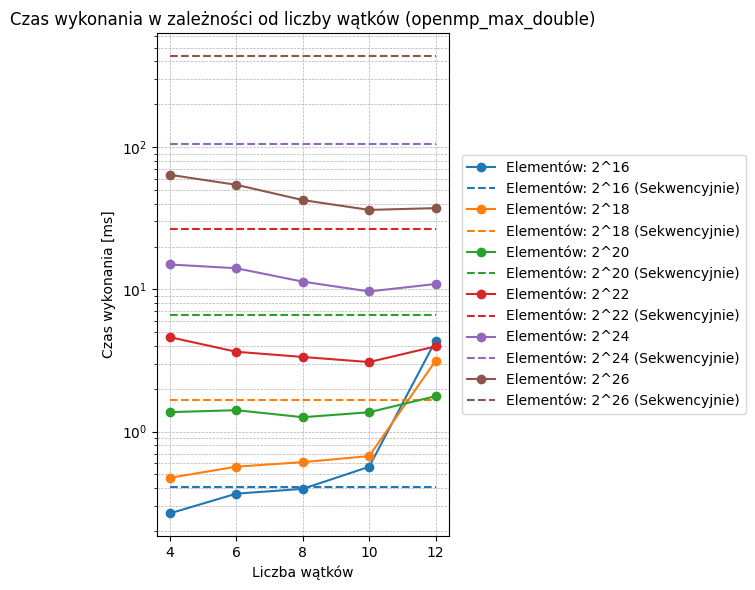

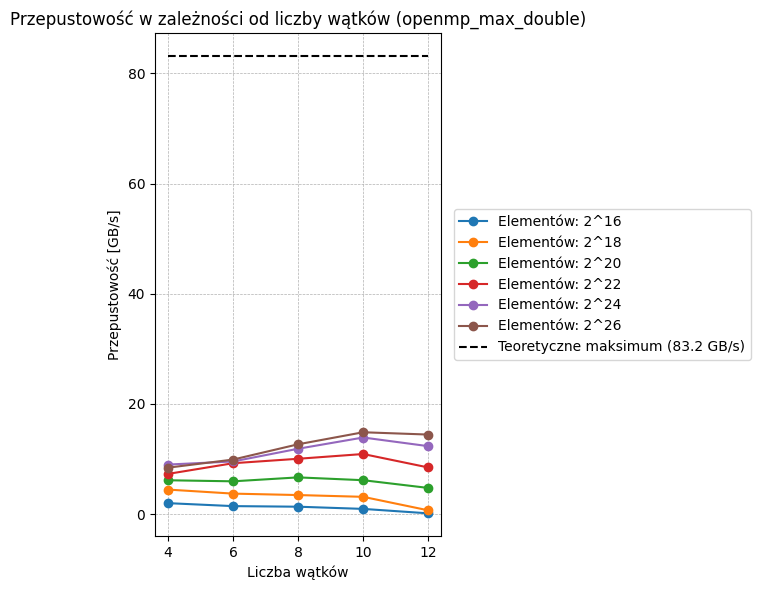

In [86]:
tech = "openmp"
op = "max"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - PREFIX - INT

Zapisano wynik do ../results/openmp/openmp_prefix_int.csv


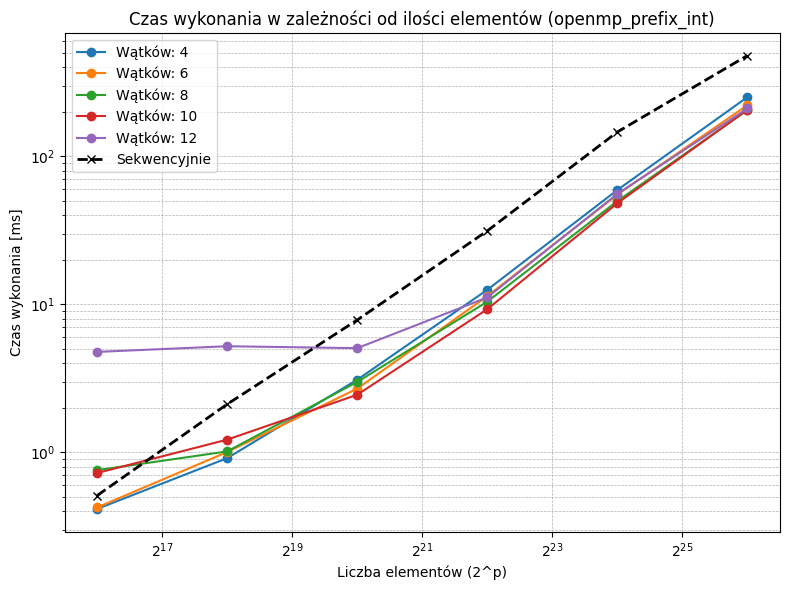

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


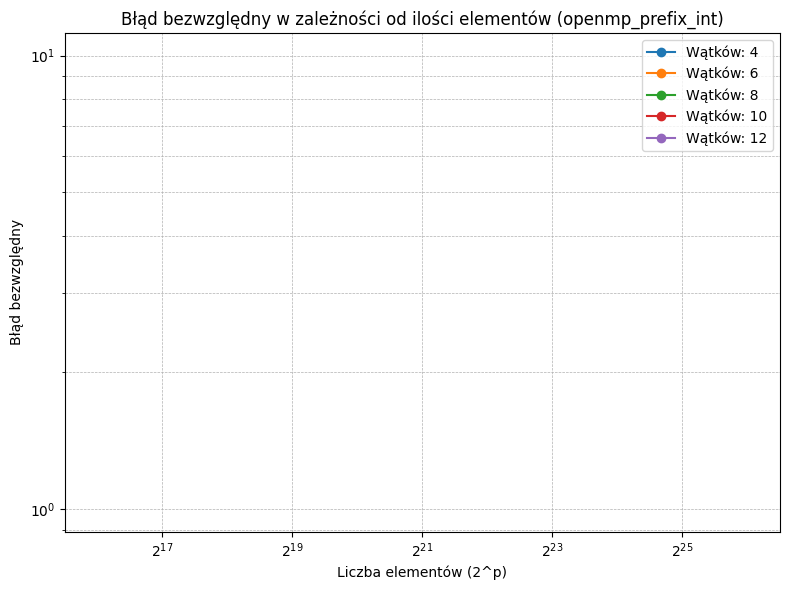

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\2972412483.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


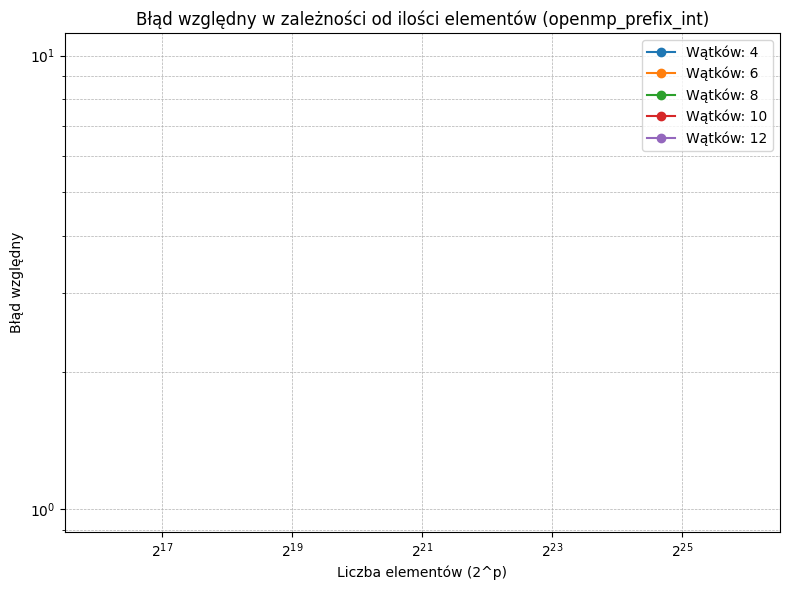

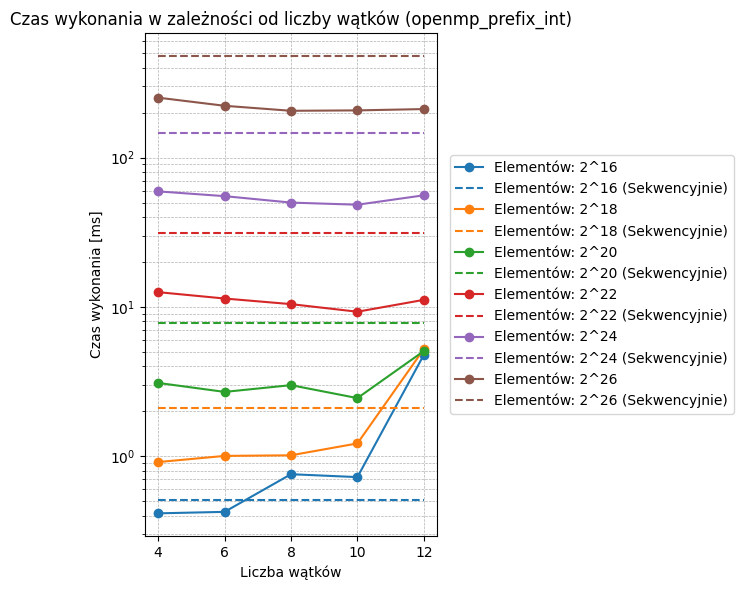

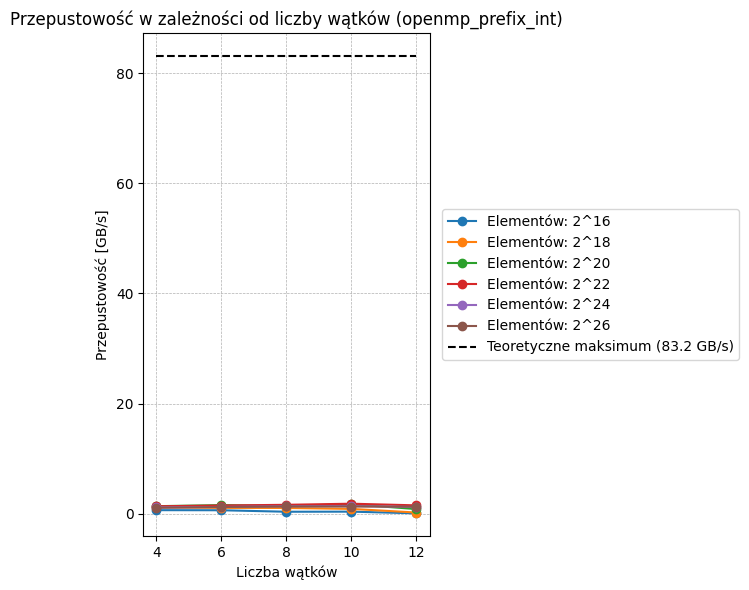

In [87]:
tech = "openmp"
op = "prefix"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### OpenMP - PREFIX - DOUBLE

Zapisano wynik do ../results/openmp/openmp_prefix_double.csv


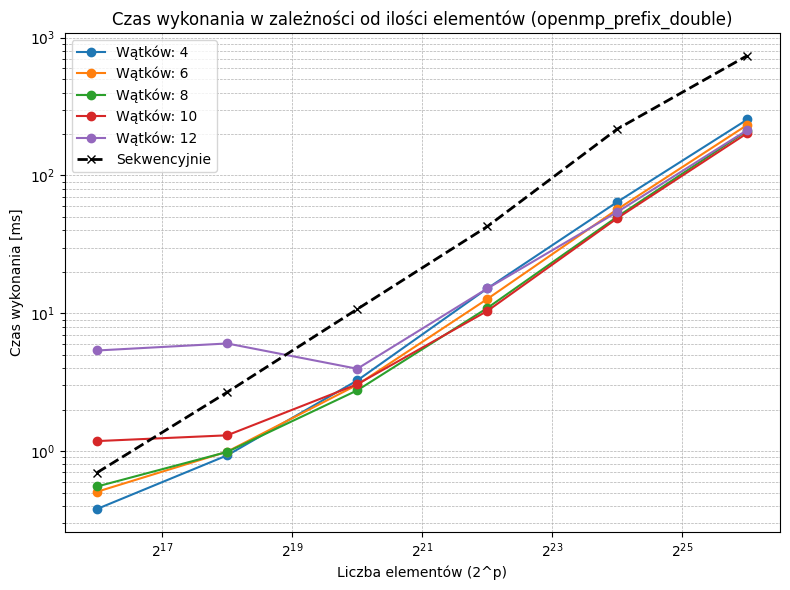

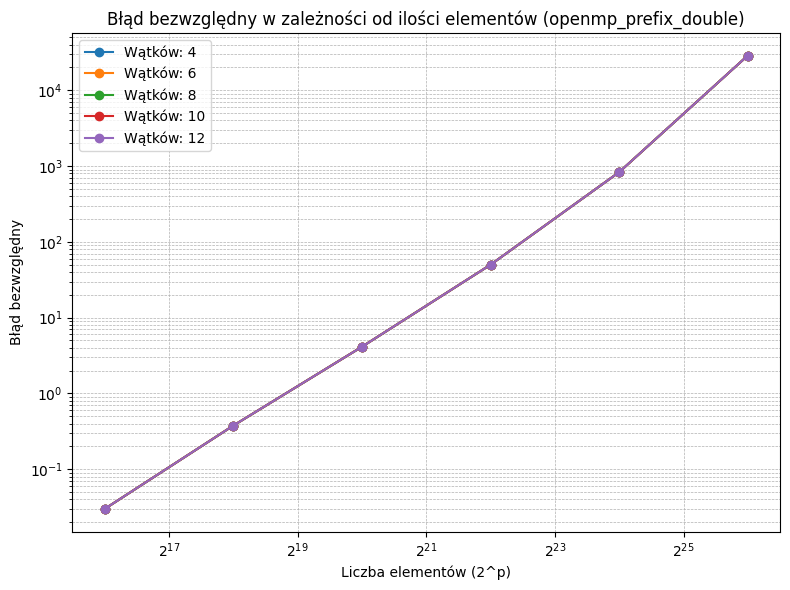

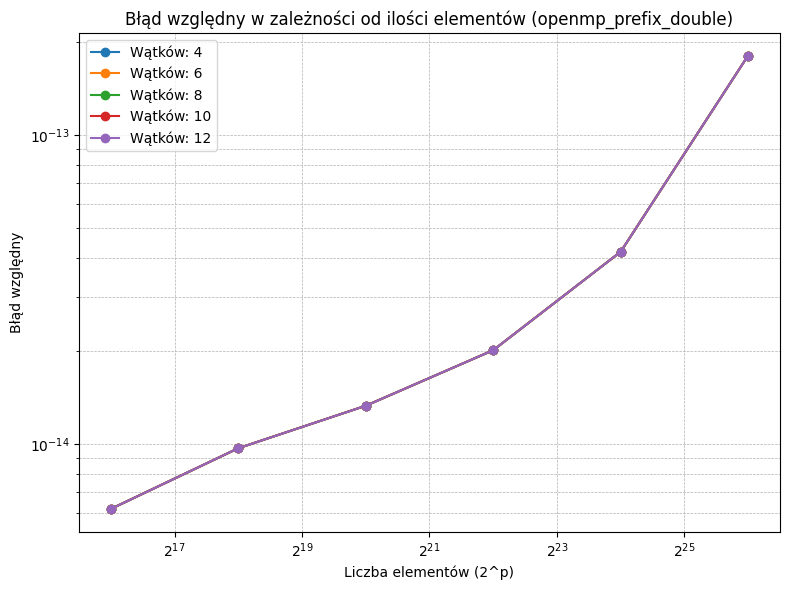

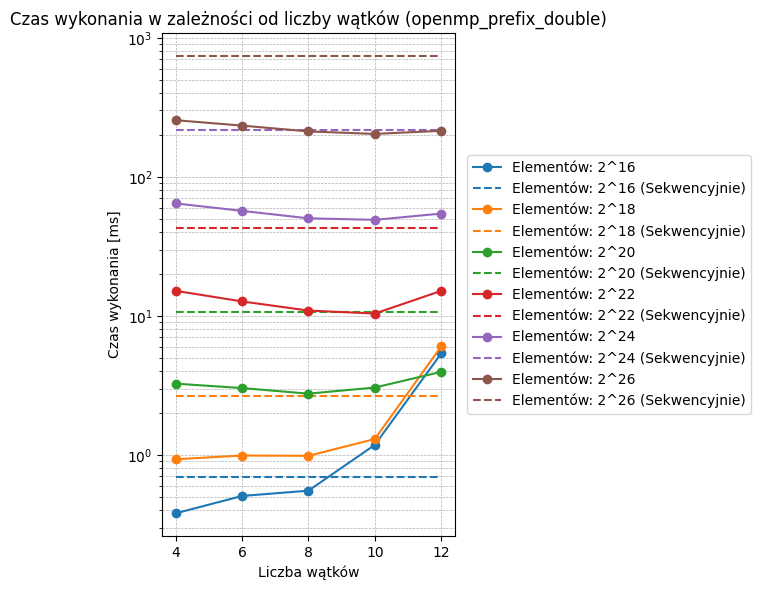

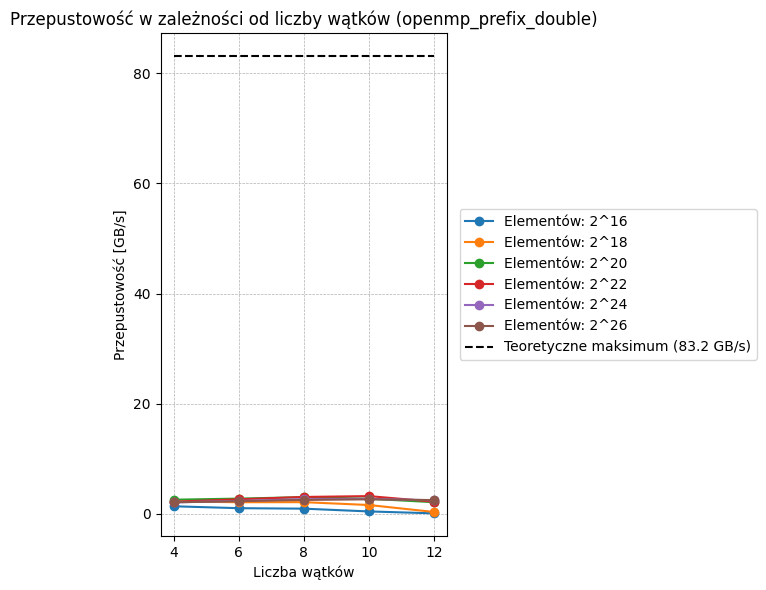

In [88]:
tech = "openmp"
op = "prefix"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

## CUDA

In [90]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_time_vs_elements(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania (ms) w zależności od ilości elementów (2^power)
    Serie odpowiadają liczbie wątków.
    Dodatkowo rysujemy linię z danych sekwencyjnych df_seq (kolumny: power, time).
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["time"], marker='o', label=f"Wątków: {proc}")

    if df_seq is not None and not df_seq.empty:
        plt.plot(2**df_seq["power"], df_seq["time"], marker='x', linestyle='--', color='k', linewidth=2, label="Sekwencyjnie")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_abs_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd bezwzględny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["abs_err"], marker='o', label=f"Wątków: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd bezwzględny")
    plt.title(f"Błąd bezwzględny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_rel_error_vs_elements(df, dtype_label="int64_t"):
    """
    Wykres: błąd względny w zależności od ilości elementów
    Serie odpowiadają liczbie procesów.
    """
    plt.figure(figsize=(8,6))
    for proc, group in df.groupby("threads"):
        plt.plot(2**group["power"], group["rel_err"], marker='o', label=f"Wątków: {proc}")

    plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba elementów (2^p)")
    plt.ylabel("Błąd względny")
    plt.title(f"Błąd względny w zależności od ilości elementów ({dtype_label})")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

def plot_time_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: czas wykonania w zależności od liczby wątków
    (dla każdego rozmiaru danych osobna linia).
    Dla każdego power rysujemy dodatkowo poziomą, przerywaną linię z czasu sekwencyjnego
    używając tego samego koloru co linia dla danej grupy. Legenda jest poza obszarem wykresu.
    """
    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        line = plt.plot(group["threads"], group["time"], marker='o', label=f"Elementów 2^{power}")
        color = line[0].get_color()

        if df_seq is not None and not df_seq.empty:
            seq_row = df_seq[df_seq["power"] == power]
            if not seq_row.empty:
                seq_time = seq_row["time"].values[0]
                x_min, x_max = group["threads"].min(), group["threads"].max()
                plt.hlines(seq_time, x_min, x_max, colors=color, linestyles='--', linewidth=1.5, label=f"Elementów: 2^{power} (Sekwencyjnie)")

    # plt.xscale('log', base=2)
    plt.yscale('log')
    plt.xlabel("Liczba wątków")
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależności od liczby wątków ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()


# --- NOWA FUNKCJA: przepustowość vs liczba procesów ---
def plot_bandwith_vs_processes(df, df_seq, dtype_label="int64_t"):
    """
    Wykres: przepustowość (GB/s) w zależności od liczby procesów.
    Serie: różne rozmiary danych (2^power).
    Rysuje poziomą przerywaną linię z teoretycznym maksimum (GPU dla 'cuda' w dtype_label, w przeciwnym razie CPU).
    """
    # określ rozmiar pojedynczego elementu w bajtach na podstawie dtype_label
    lbl = dtype_label.lower()
    if "double" in lbl:
        elem_size = 8
    elif "int64" in lbl or "int64_t" in lbl:
        elem_size = 8
    else:
        # domyślnie zwykły int -> 4 bajty
        elem_size = 4

    fig = plt.figure(figsize=(8,6))
    for power, group in df.groupby("power"):
        # liczba elementów = 2^power
        elements = 2 ** int(power)
        # czas w sekundach (zakładamy, że kolumna 'time' jest w ms)
        times_s = group["time"].astype(float) / 1000.0
        # unikamy dzielenia przez zero
        times_s = times_s.replace(0, 1e-9)

        # przepustowość w GB/s
        bandwidth_gbs = (elements * elem_size) / times_s / 1e9

        plt.plot(group["threads"], bandwidth_gbs, marker="o", label=f"Elementów: 2^{power}")

    # wybierz teoretyczne maksimum na podstawie technologii zawartej w dtype_label
    theoretical_max = GPU_BANDWIDTH if "cuda" in lbl else CPU_BANDWIDTH
    x_min, x_max = df["threads"].min(), df["threads"].max()
    plt.hlines(theoretical_max, x_min, x_max, colors="k", linestyles="--", linewidth=1.5, label=f"Teoretyczne maksimum ({theoretical_max} GB/s)")

    plt.xlabel("Liczba wątków")
    plt.ylabel("Przepustowość [GB/s]")
    plt.title(f"Przepustowość w zależności od liczby wątków ({dtype_label})")
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
    plt.tight_layout(rect=[0,0,0.85,1])
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    plt.show()

### CUDA - SUM - INT

Zapisano wynik do ../results/cuda/cuda_sum_int.csv


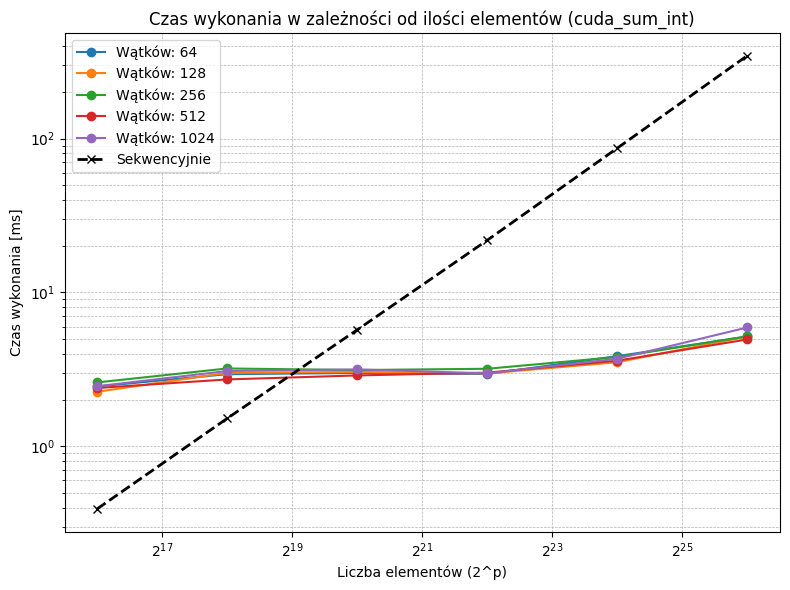

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


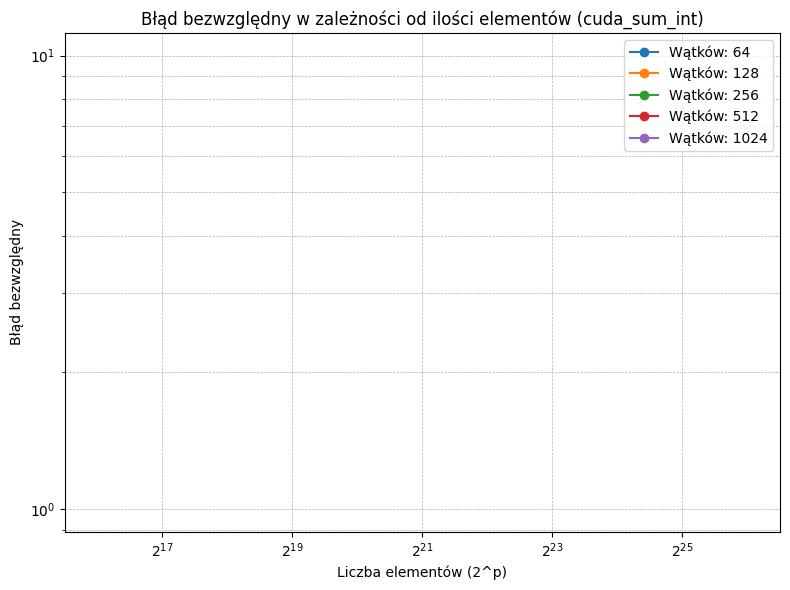

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


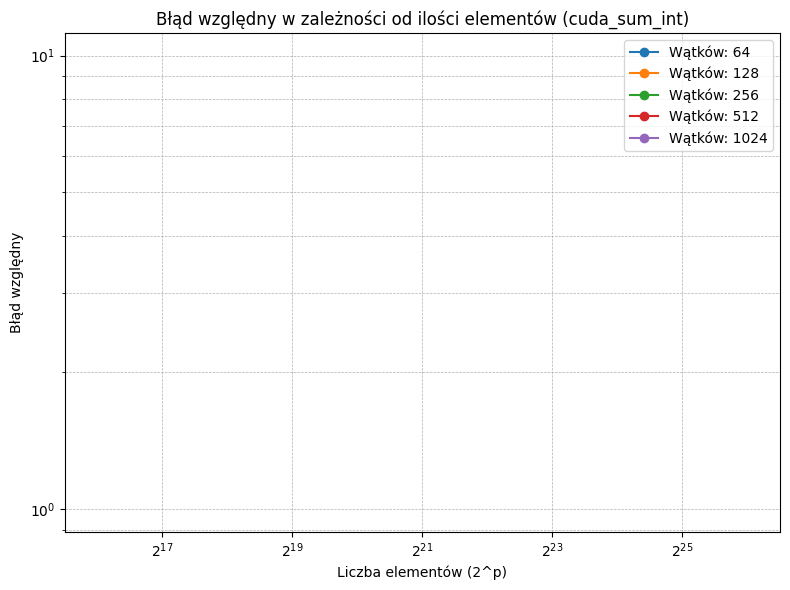

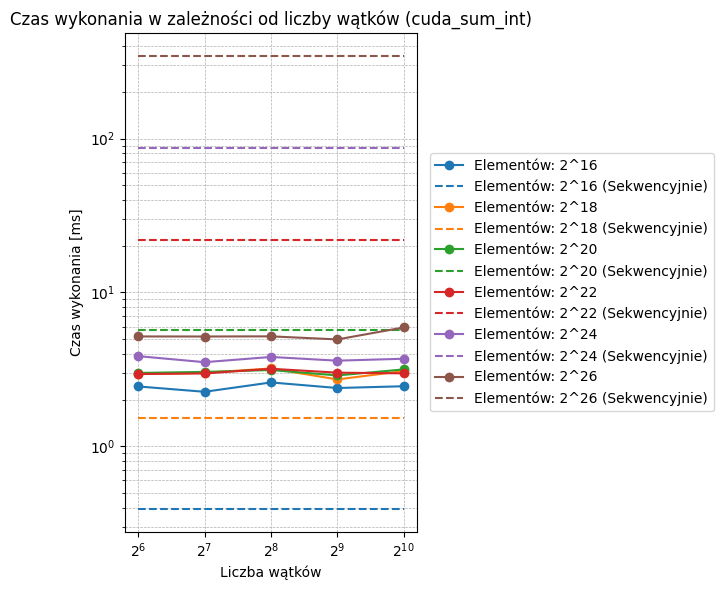

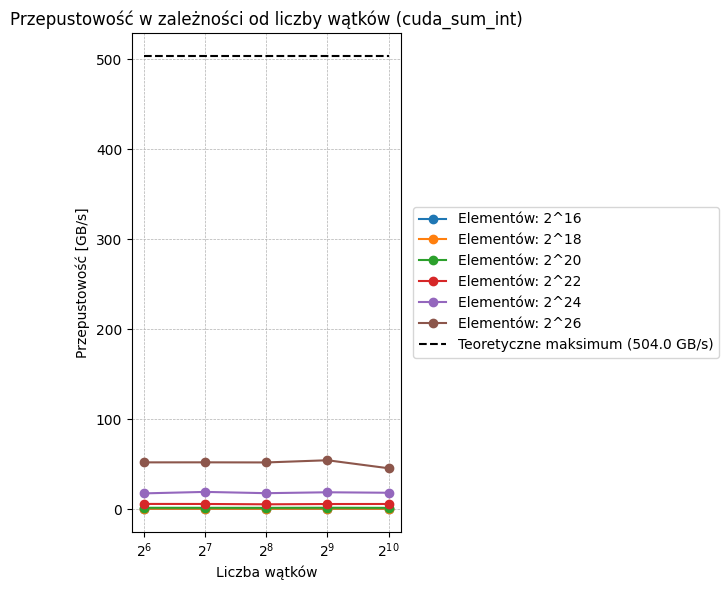

In [91]:
tech = "cuda"
op = "sum"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - SUM - DOUBLE

Zapisano wynik do ../results/cuda/cuda_sum_double.csv


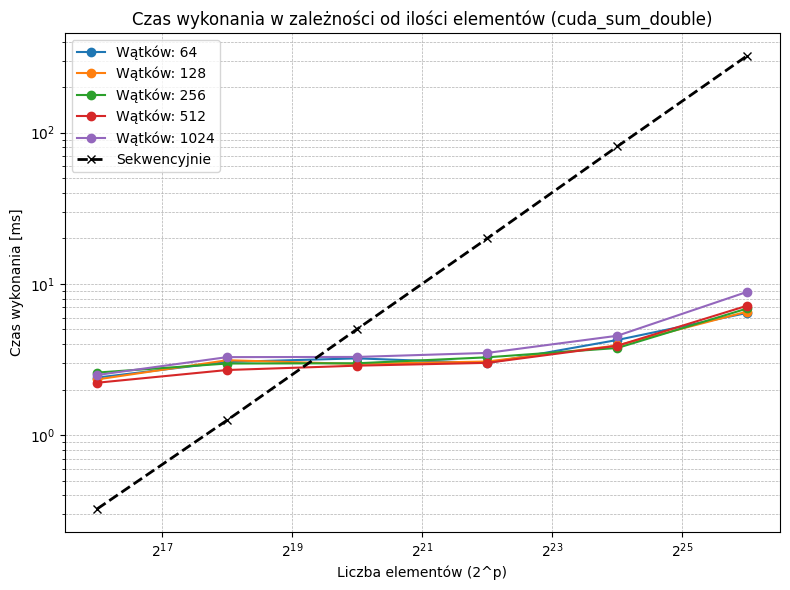

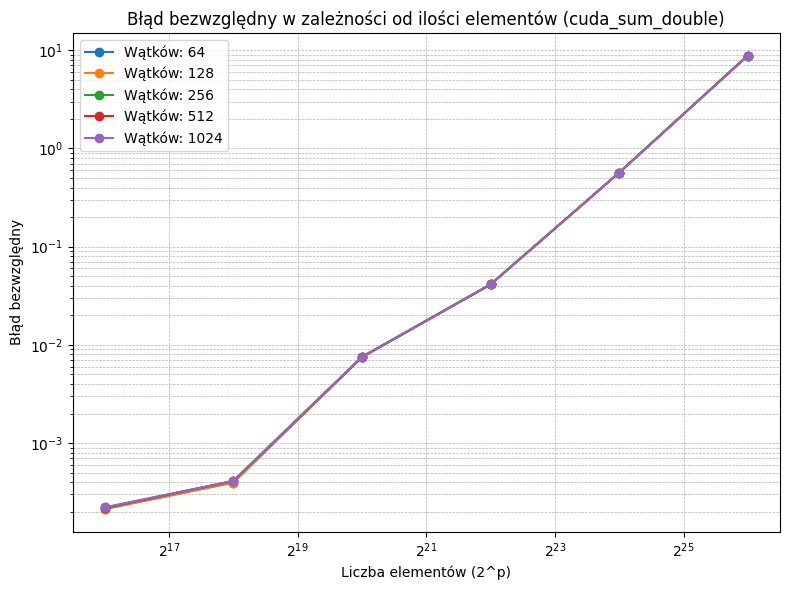

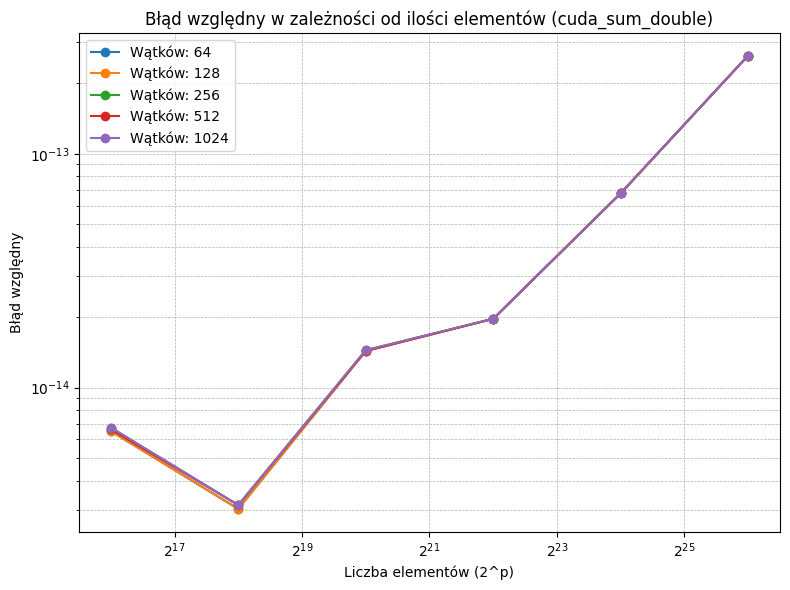

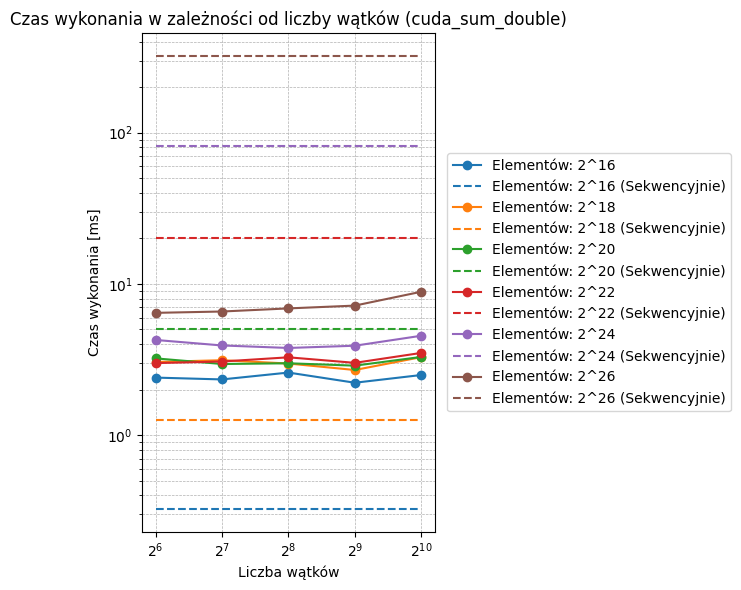

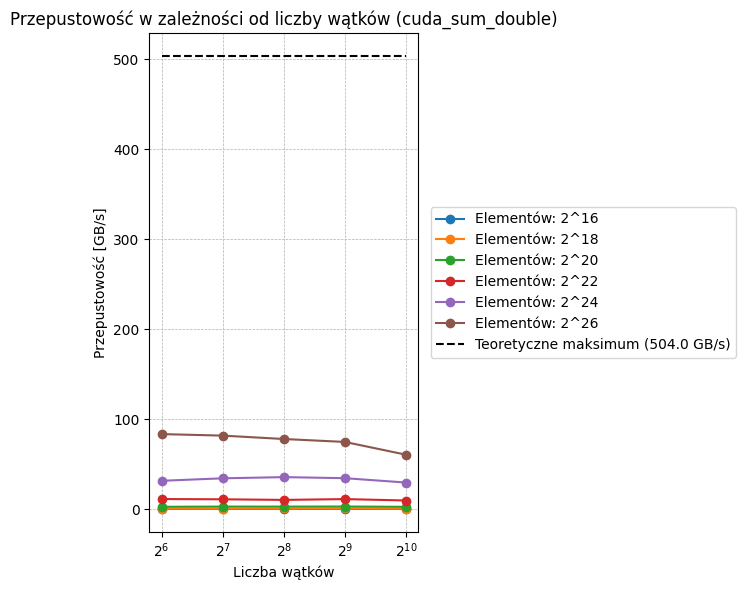

In [92]:
tech = "cuda"
op = "sum"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - MIN - INT 

Zapisano wynik do ../results/cuda/cuda_min_int.csv


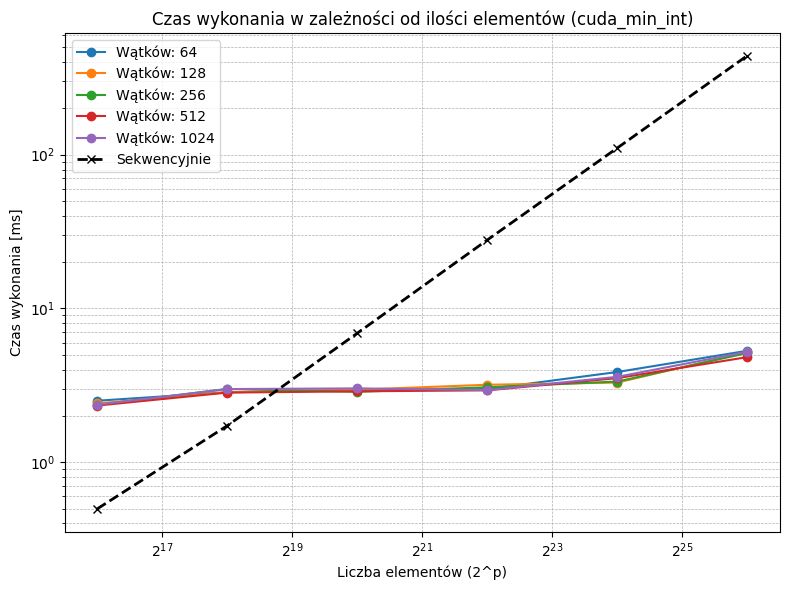

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


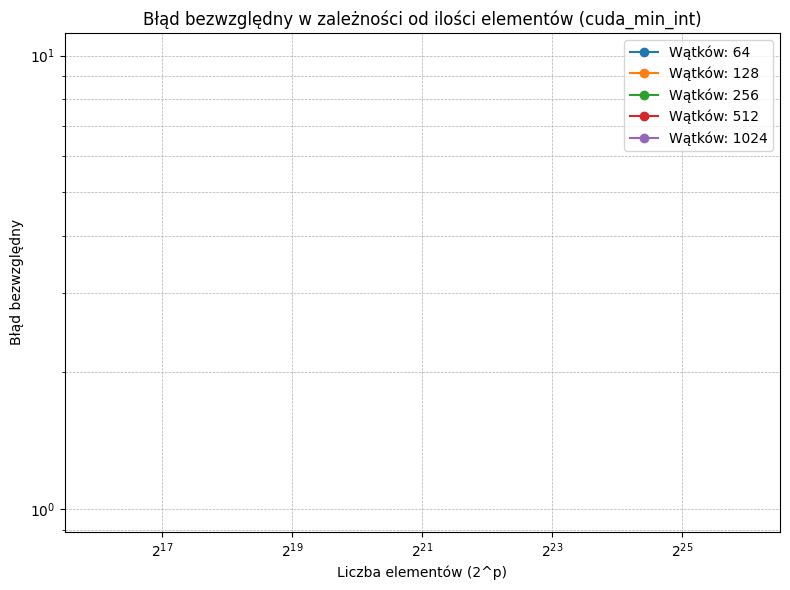

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


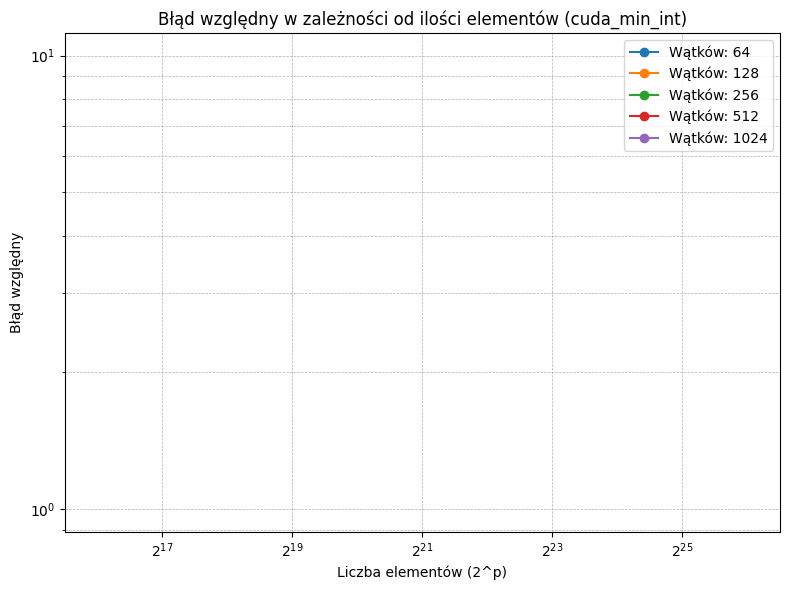

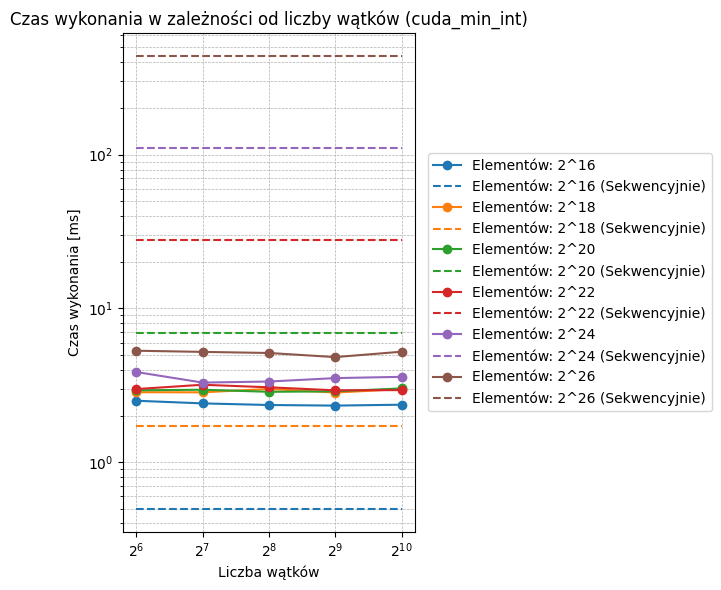

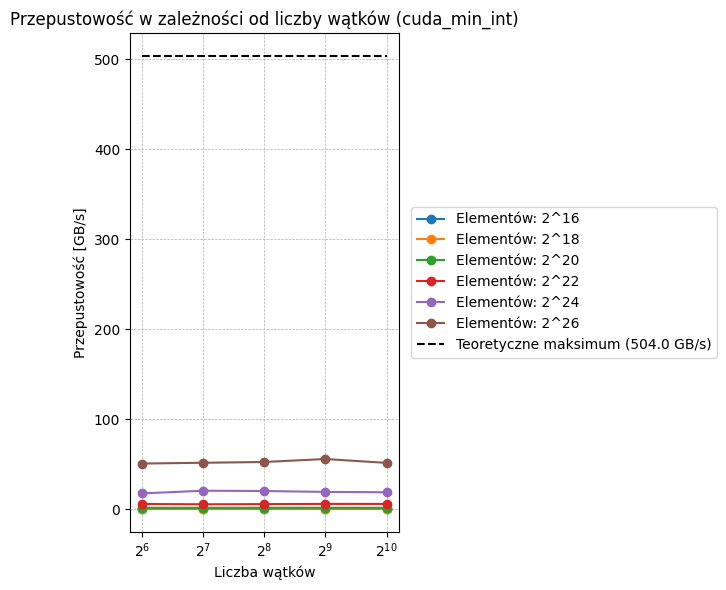

In [93]:
tech = "cuda"
op = "min"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - MIN - DOUBLE

Zapisano wynik do ../results/cuda/cuda_min_double.csv


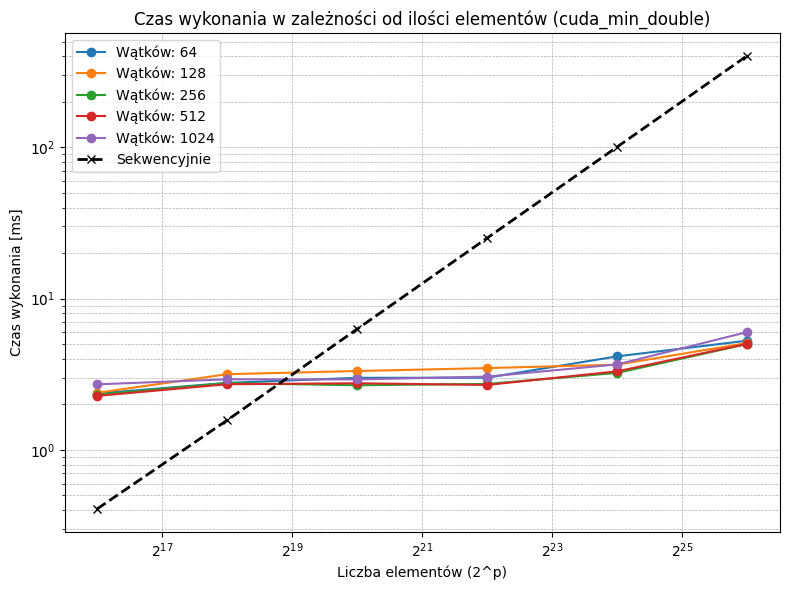

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


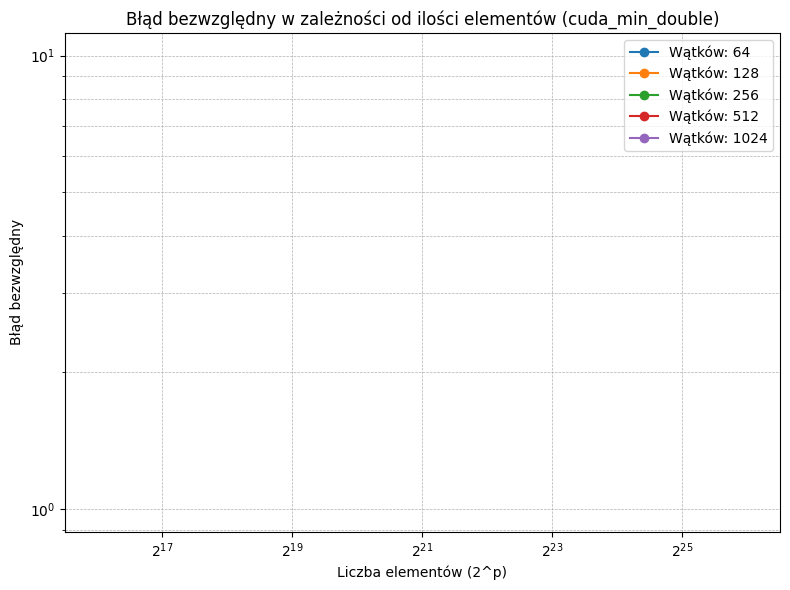

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


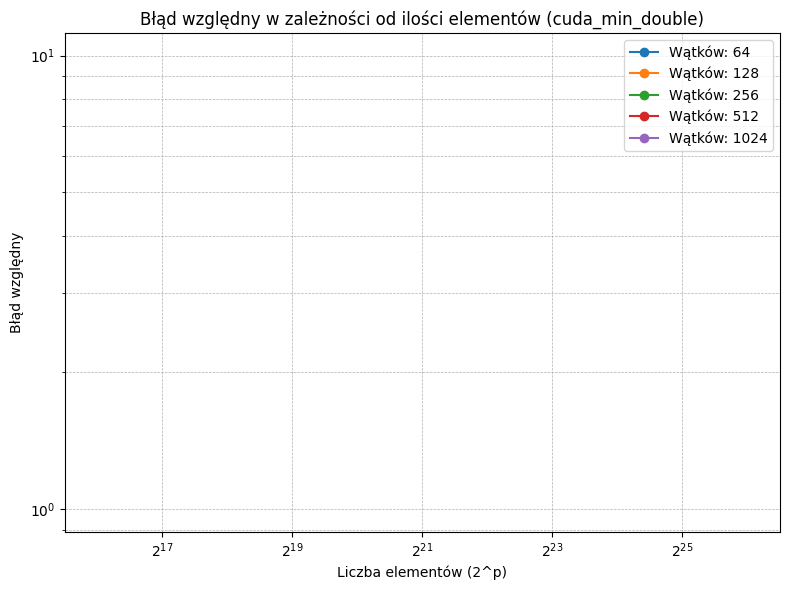

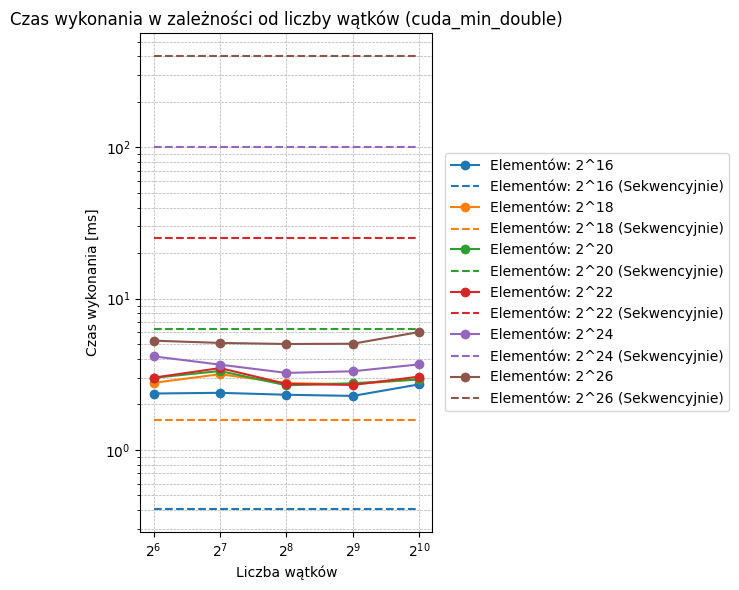

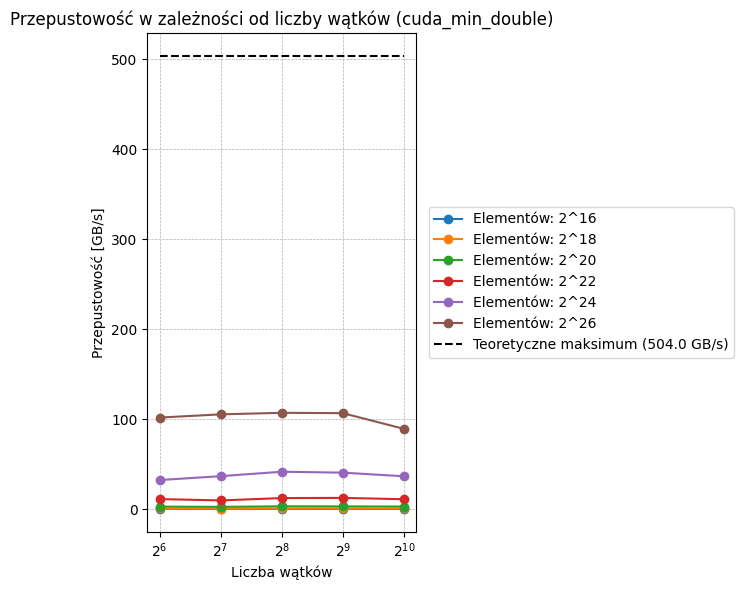

In [94]:
tech = "cuda"
op = "min"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - MAX - INT 

Zapisano wynik do ../results/cuda/cuda_max_int.csv


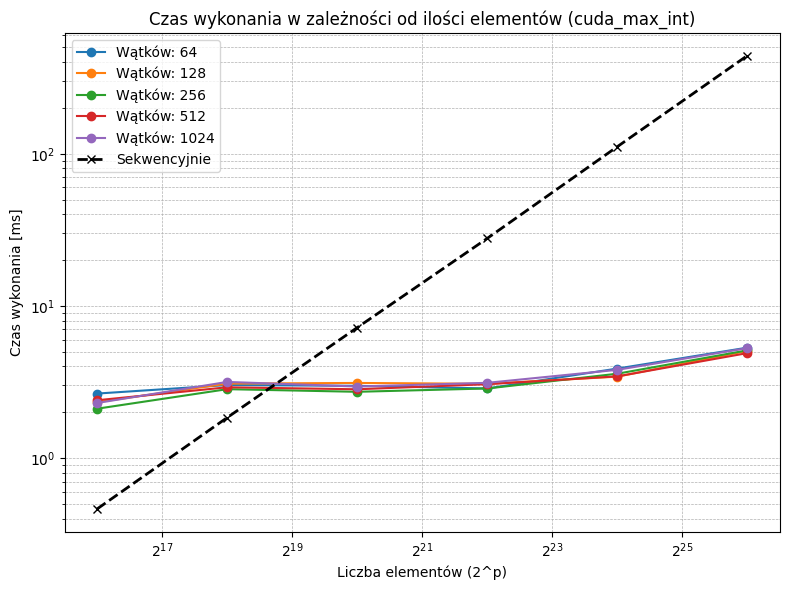

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


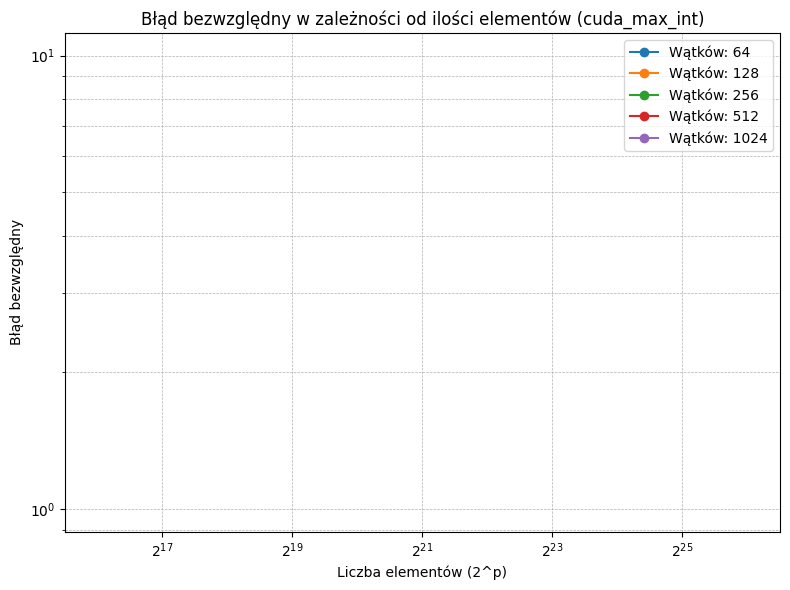

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


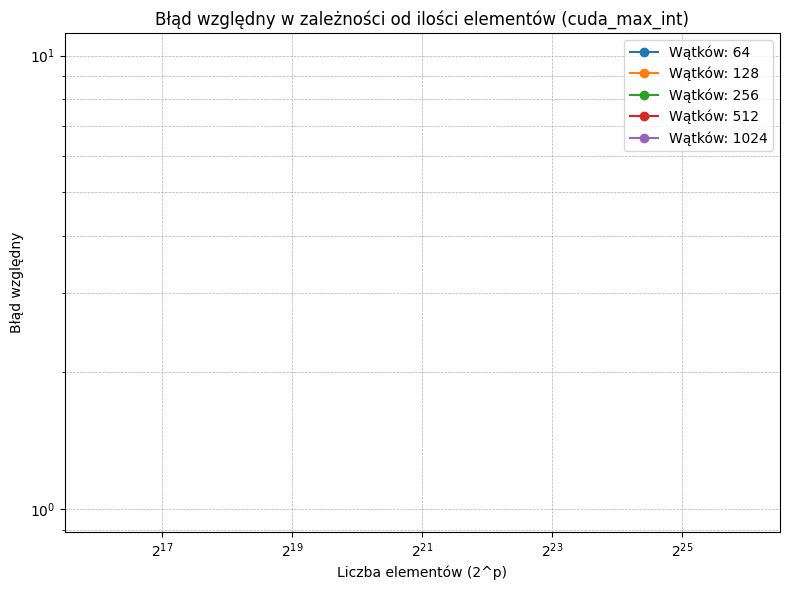

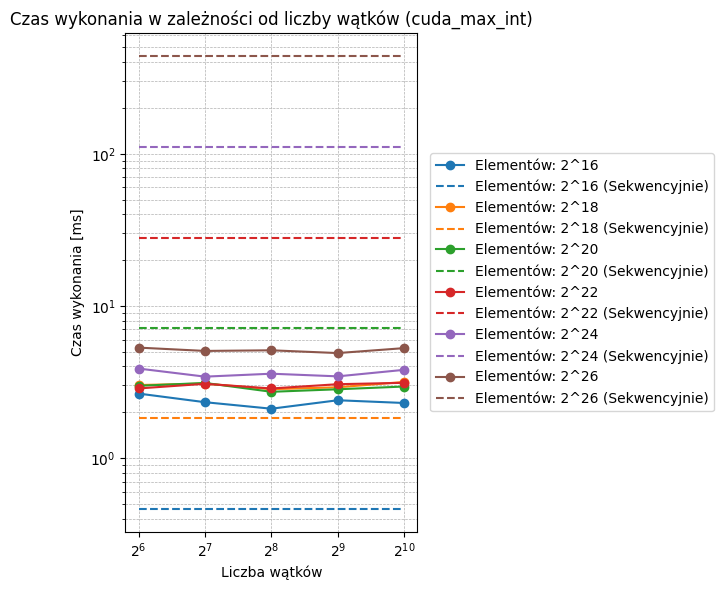

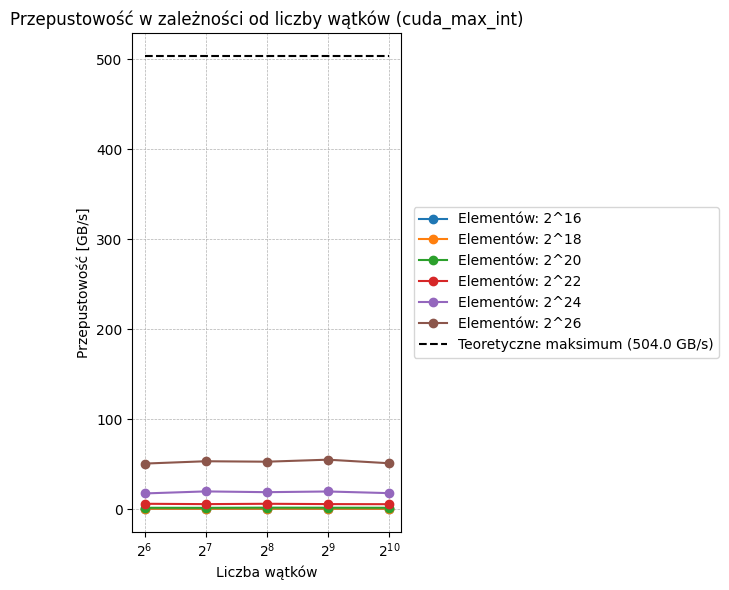

In [95]:
tech = "cuda"
op = "max"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - MAX - DOUBLE

Zapisano wynik do ../results/cuda/cuda_max_double.csv


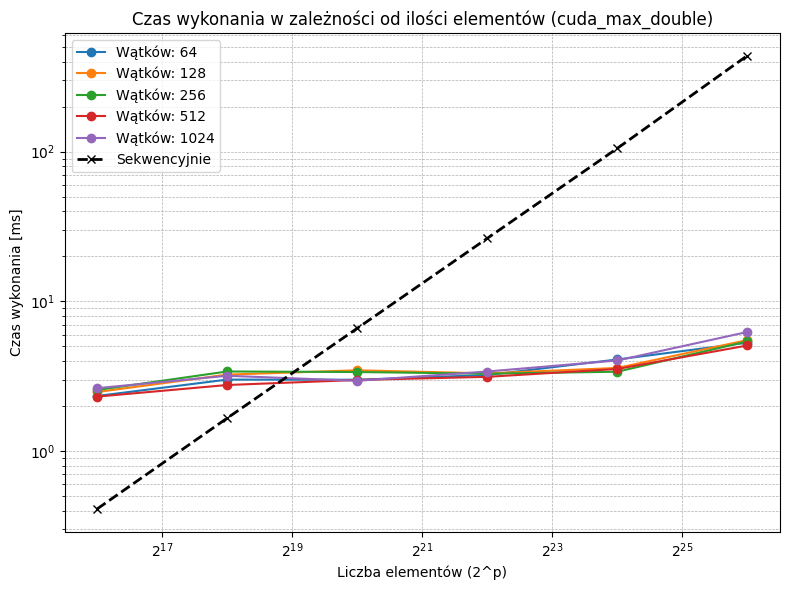

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4009326985.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


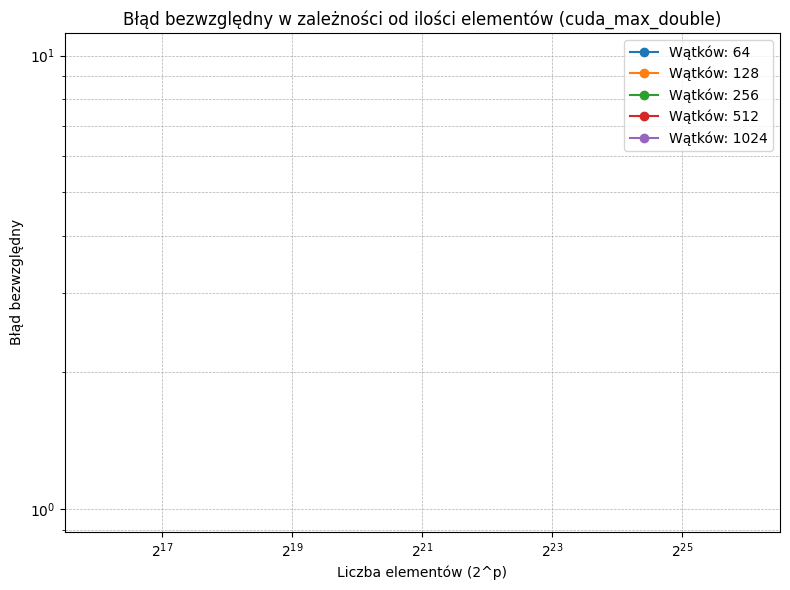

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4009326985.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


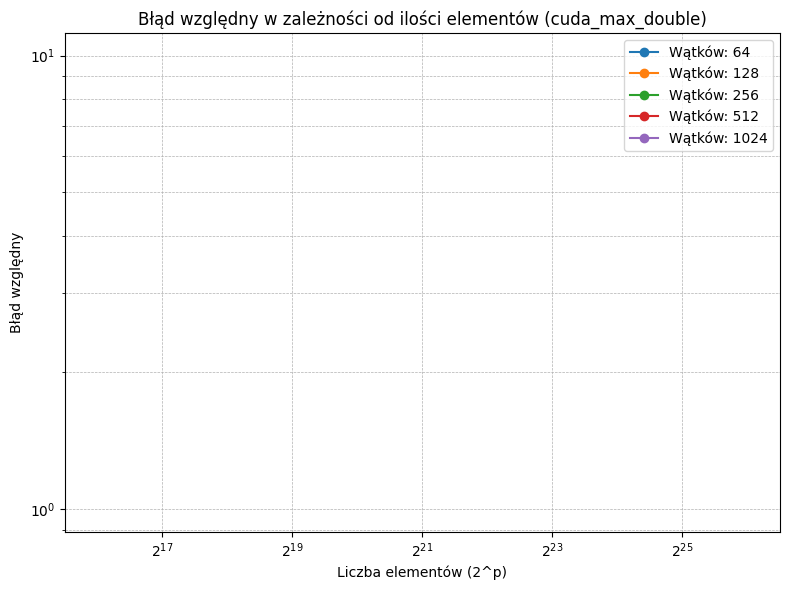

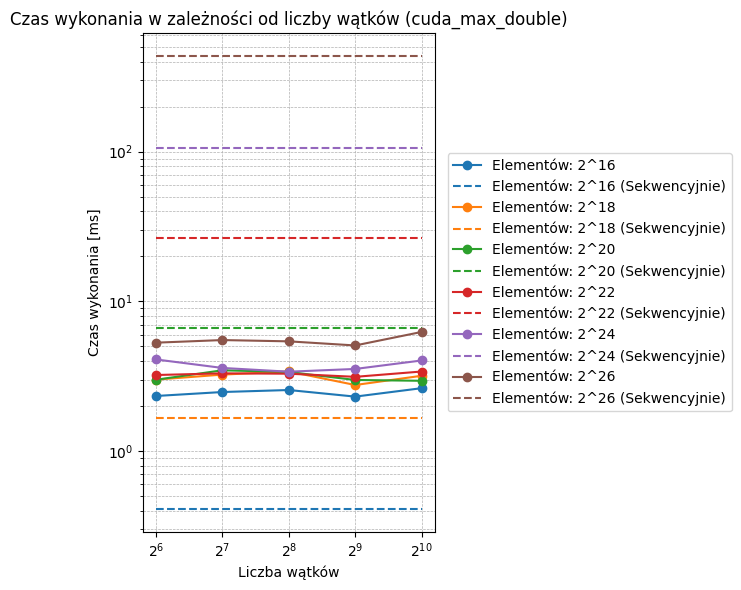

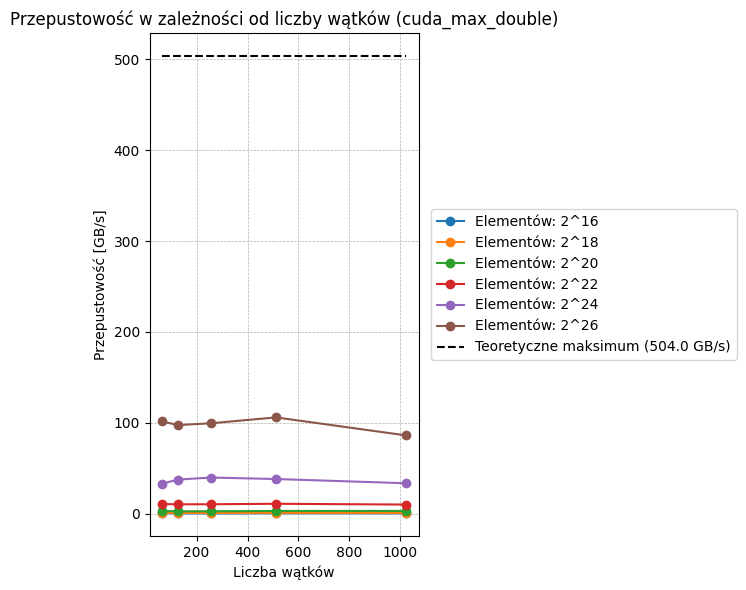

In [77]:
tech = "cuda"
op = "max"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - PREFIX - INT

Zapisano wynik do ../results/cuda/cuda_prefix_int.csv


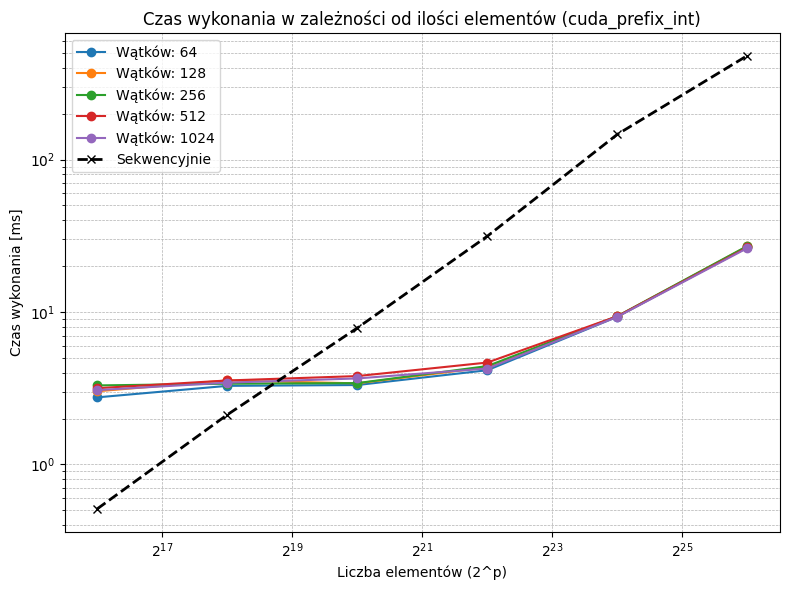

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


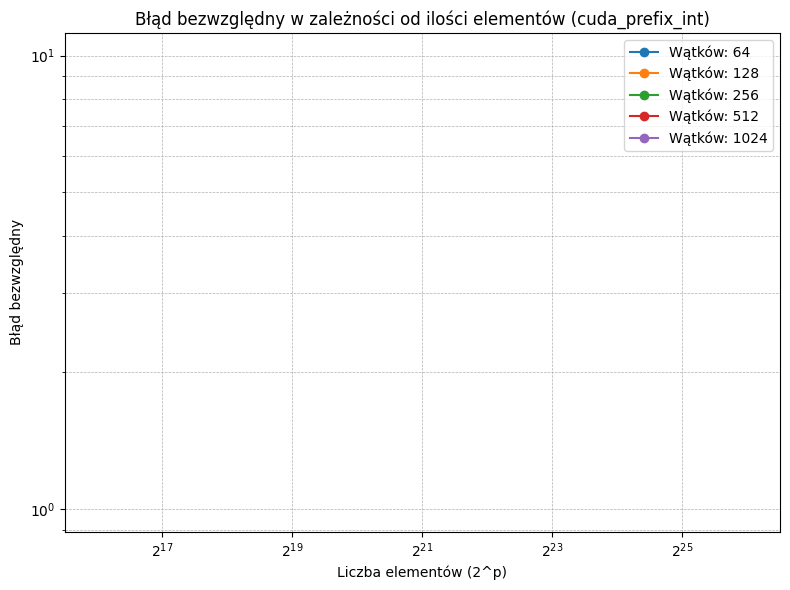

C:\Users\Adrian\AppData\Local\Temp\ipykernel_4496\4252382775.py:56: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale('log')


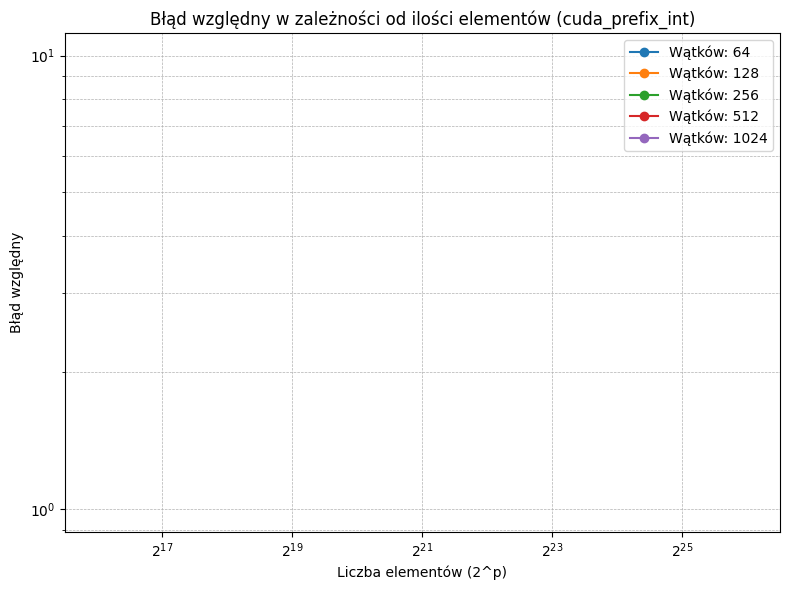

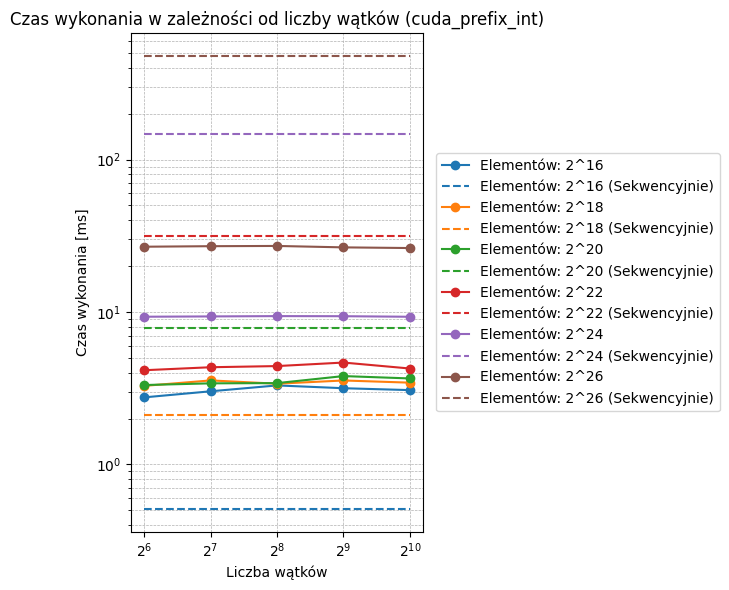

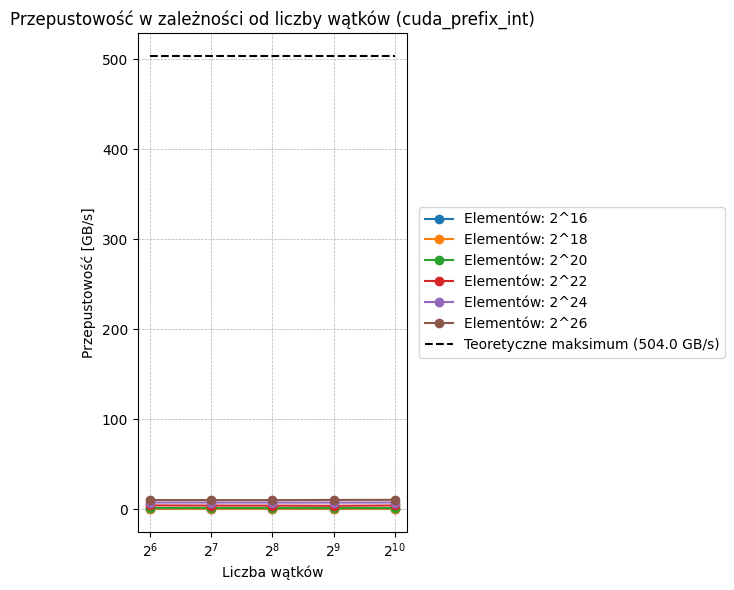

In [96]:
tech = "cuda"
op = "prefix"
datatype = "int"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

### CUDA - PREFIX - DOUBLE

Zapisano wynik do ../results/cuda/cuda_prefix_double.csv


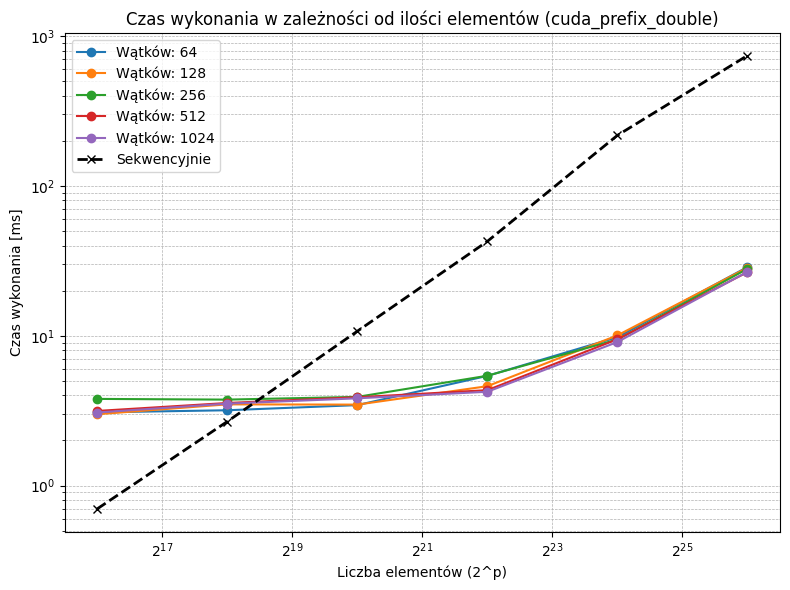

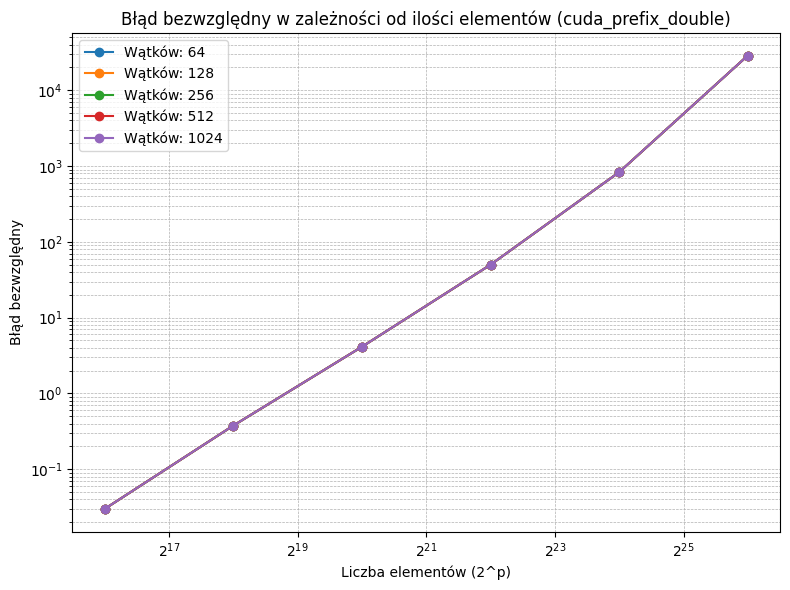

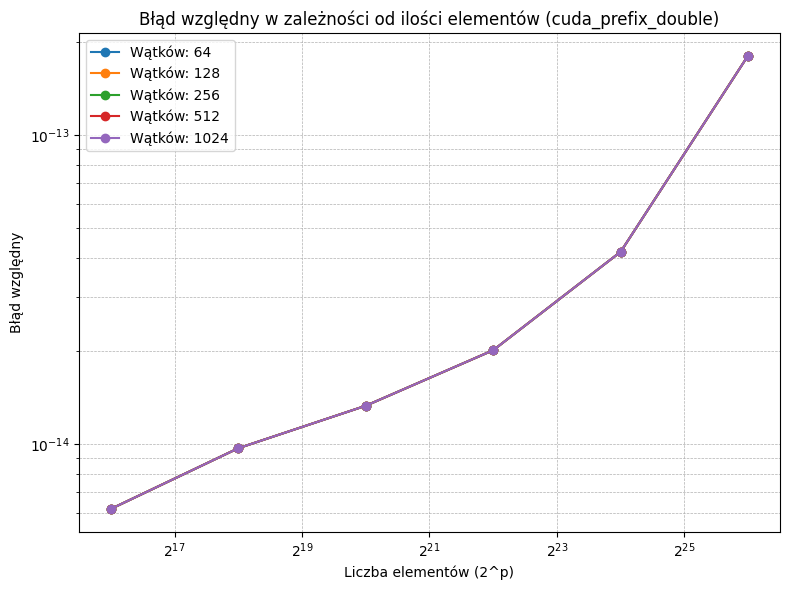

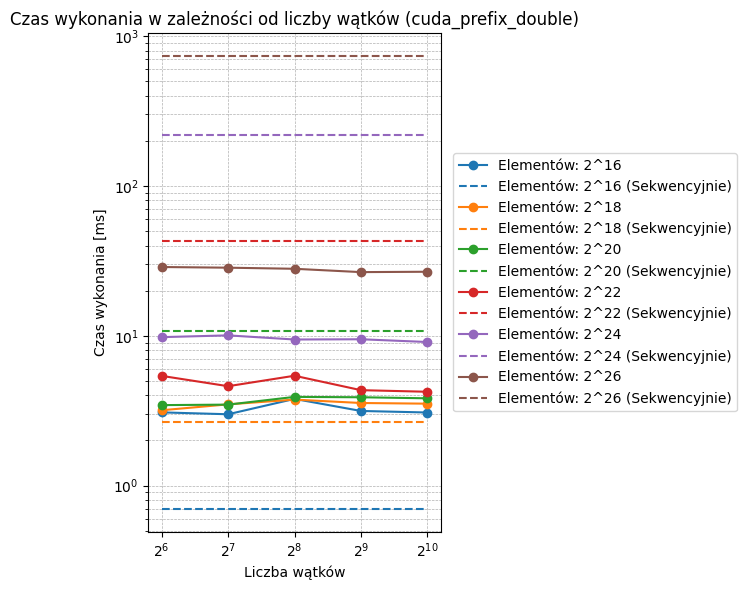

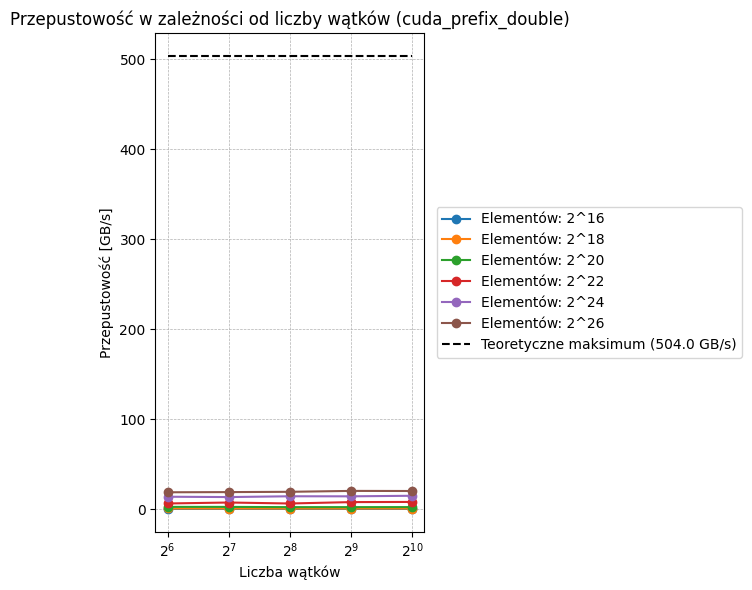

In [97]:
tech = "cuda"
op = "prefix"
datatype = "double"

reduce_mean_openmp(f"../results/{tech}/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/' + filename)

df_seq = pd.read_csv(f"../results/seq/seq_{op}_{datatype}.csv")

label = f"{tech}_{op}_{datatype}"
plot_time_vs_elements(df, df_seq, dtype_label=label)
plot_abs_error_vs_elements(df, dtype_label=label)
plot_rel_error_vs_elements(df, dtype_label=label)
plot_time_vs_processes(df, df_seq, dtype_label=label)
plot_bandwith_vs_processes(df, df_seq, dtype_label=label)

## Podsumowanie najlepszych konfiguracji

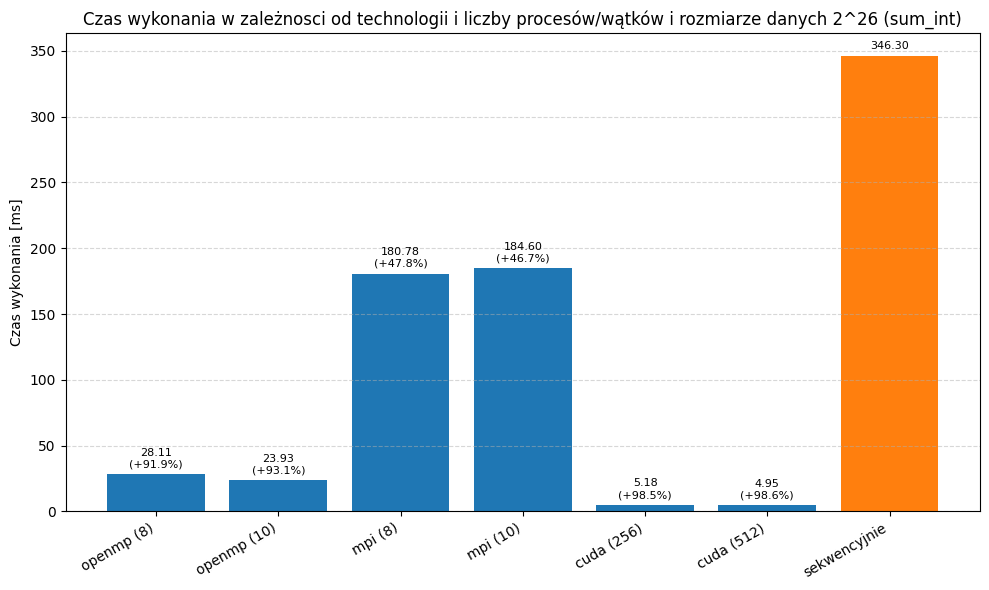

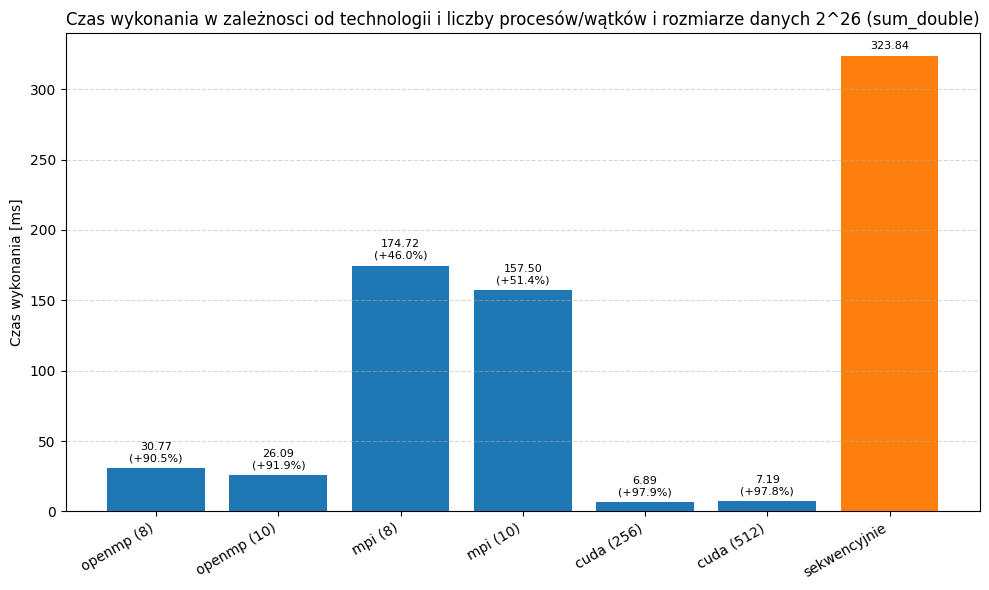

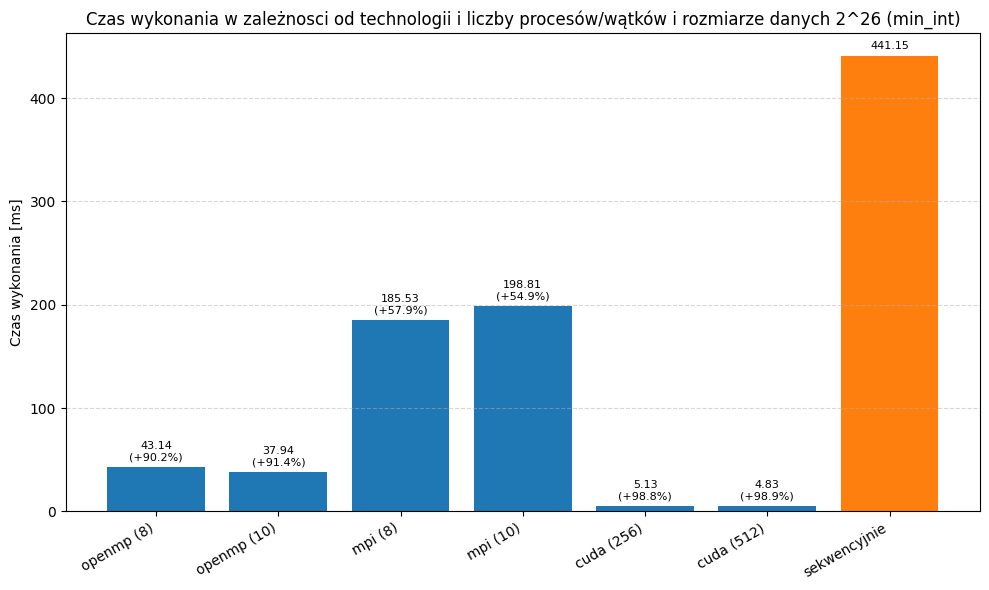

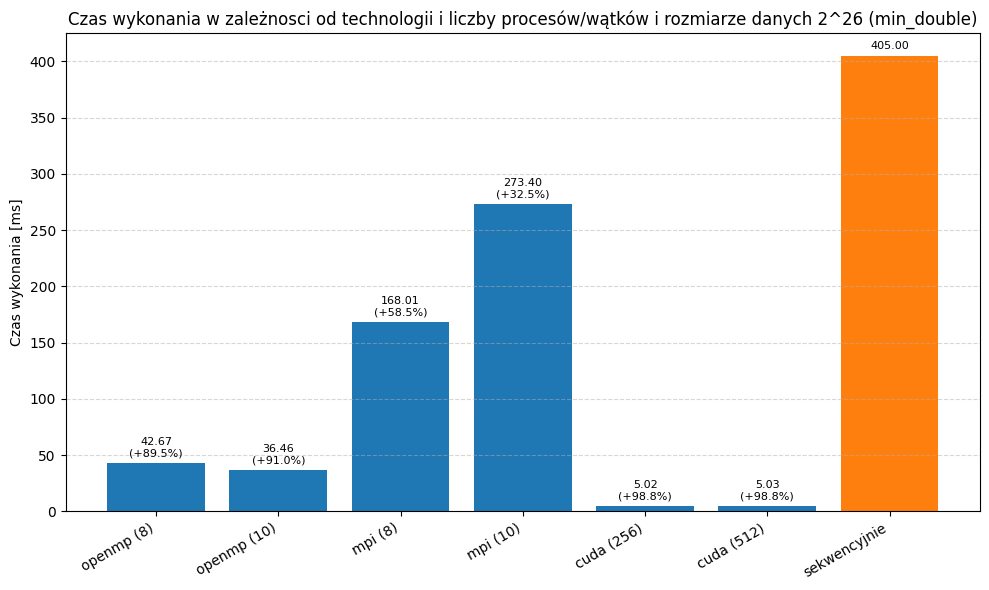

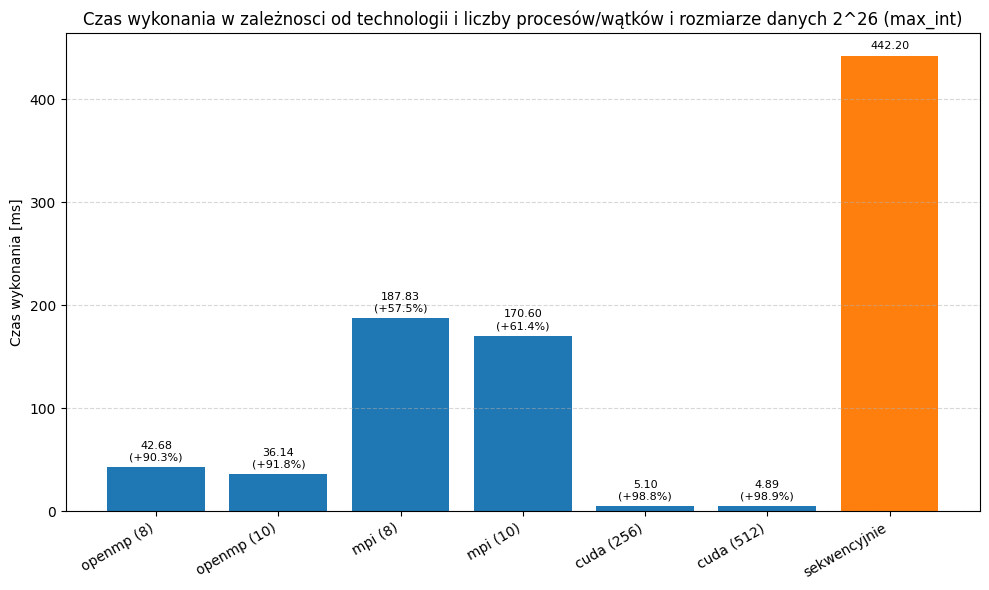

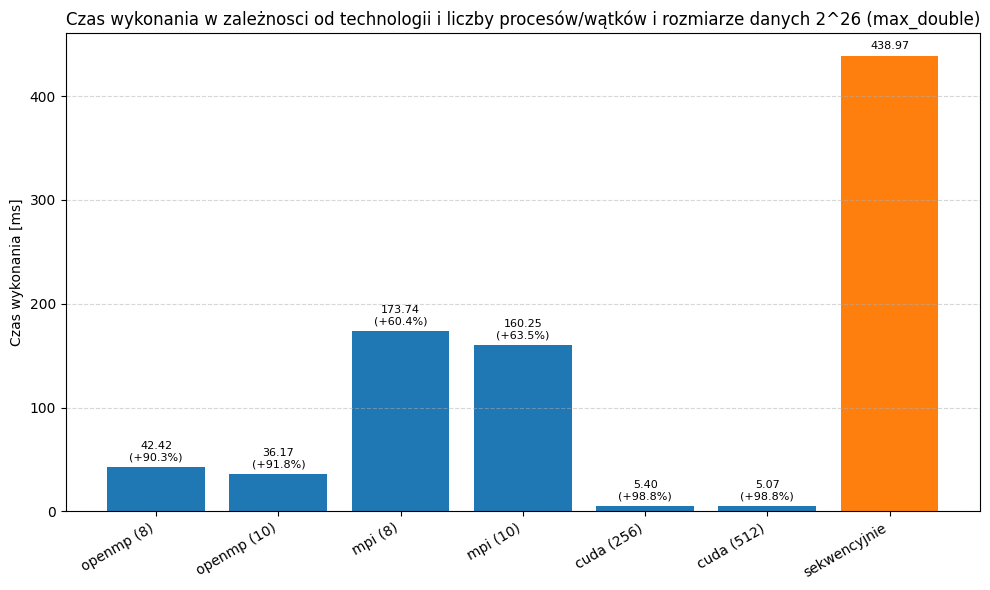

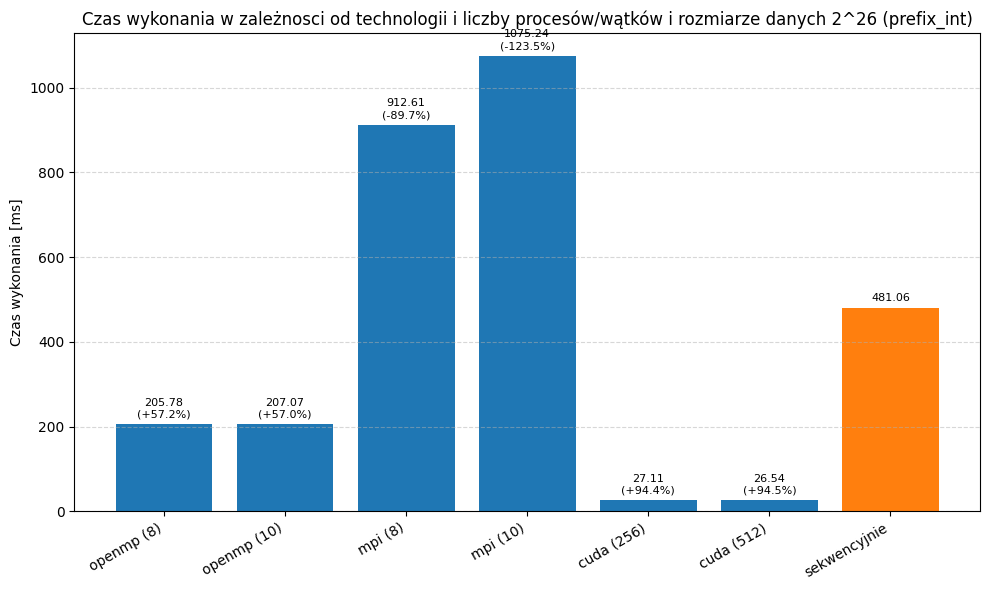

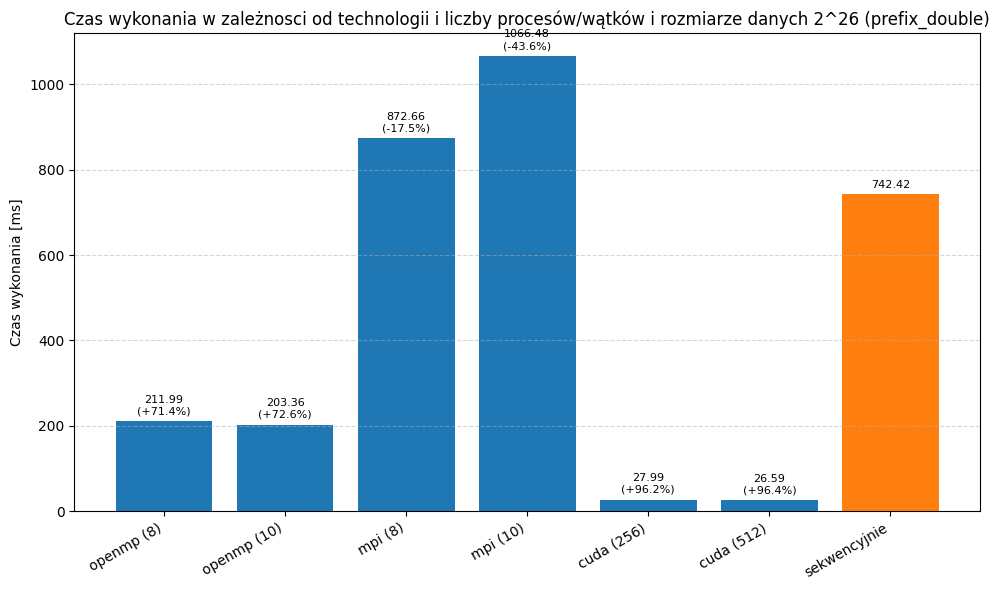

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_tech_time_bar(op, dtype_label, data_power=26, label=""):
    """
    Rysuje wykres słupkowy czasu wykonania (ms) dla rozmiaru danych 2^data_power
    dla 6 konfiguracji: openmp(8), openmp(10), mpi(8), mpi(10), cuda(256), cuda(512).
    Dodaje dodatkowy słupek z wynikiem sekwencyjnym (jeżeli dostępny).
    Nad każdą kolumną wyświetla czas oraz (jeżeli dostępne) procentowe przyspieszenie
    względem czasu sekwencyjnego.
    """
    configs = [("openmp", 8), ("openmp", 10), ("mpi", 8), ("mpi", 10), ("cuda", 256), ("cuda", 512)]
    times = []
    labels = []

    for tech, workers in configs:
        path = f"../results/{tech}/{tech}_{op}_{dtype_label}.csv"
        # dla MPI kolumna nazywa się 'processes', dla innych 'threads'
        col = 'processes' if tech == 'mpi' else 'threads'
        t = np.nan
        try:
            df = pd.read_csv(path)
            if 'power' in df.columns and col in df.columns and 'time' in df.columns:
                row = df[(df['power'] == data_power) & (df[col] == workers)]
                if not row.empty:
                    t = float(row['time'].values[0])
        except Exception:
            t = np.nan

        times.append(t)
        labels.append(f"{tech} ({workers})")

    # --- dodatkowy słupek: wynik sekwencyjny ---
    seq_t = np.nan
    try:
        seq_path = f"../results/seq/seq_{op}_{dtype_label}.csv"
        df_seq = pd.read_csv(seq_path)
        if 'power' in df_seq.columns and 'time' in df_seq.columns:
            row = df_seq[df_seq['power'] == data_power]
            if not row.empty:
                seq_t = float(row['time'].values[0])
    except Exception:
        seq_t = np.nan

    # Oblicz procentowe przyspieszenie względem seq_t dla każdej konfiguracji (None jeśli brak danych)
    pct_list = [None] * len(times)
    if not np.isnan(seq_t) and seq_t != 0:
        for i in range(len(times)):
            t = times[i]
            if not np.isnan(t):
                pct_list[i] = ((seq_t - t) / seq_t) * 100.0

    # dodajemy sam słupek sekwencyjny na końcu (bez %)
    times.append(seq_t)
    labels.append("sekwencyjnie")
    pct_list.append(None)

    # Rysowanie wykresu słupkowego
    plt.figure(figsize=(10,6))
    x = np.arange(len(labels))
    colors = ['C0'] * (len(labels)-1) + ['C1']
    bars = plt.bar(x, times, color=colors)
    plt.xticks(x, labels, rotation=30, ha='right')
    plt.ylabel("Czas wykonania [ms]")
    plt.title(f"Czas wykonania w zależnosci od technologii i liczby procesów/wątków i rozmiarze danych 2^{data_power} ({label})")

    # zabezpieczanie przypadku gdy wszystkie wartości NaN
    try:
        finite_times = [t for t in times if np.isfinite(t)]
        max_val = float(np.nanmax(finite_times)) if finite_times else 1.0
    except Exception:
        max_val = 1.0

    # pokaż wartości nad słupkami; jeśli dostępne, dodaj procentowe przyspieszenie w nowej linii
    for xi, yi, pct in zip(x, times, pct_list):
        if not np.isnan(yi):
            text = f"{yi:.2f}"
            if pct is not None:
                text += f"\n({pct:+.1f}%)"
            plt.text(xi, yi + max(1.0, 0.01 * max_val), text, ha='center', va='bottom', fontsize=8)

    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Wywołania:  4 operacje x 2 typy danych = 8 wykresów
for op in ["sum", "min", "max", "prefix"]:
    for dtype in ["int", "double"]:
        plot_tech_time_bar(op, dtype, data_power=26, label=f"{op}_{dtype}")

## Wpływ rozmiaru bloku na czas wykonania

In [135]:
def reduce_mean_openmp(path):
    # Wczytaj dane
    df = pd.read_csv(path)

    # Upewnij się, że podstawowe kolumny istnieją; uzupełnij sensownymi domyślnymi wartościami
    if 'power' not in df.columns:
        raise ValueError("Brak kolumny 'power' w pliku: " + path)
    if 'threads' not in df.columns:
        if 'processes' in df.columns:
            df['threads'] = df['processes']
        else:
            df['threads'] = 1
    if 'chunk' not in df.columns:
        df['chunk'] = 0
    if 'time' not in df.columns:
        df['time'] = 0.0
    # upewnij się, że błędy istnieją — jeśli nie, wypełnij zerami
    if 'abs_err' not in df.columns:
        df['abs_err'] = 0.0
    if 'rel_err' not in df.columns:
        df['rel_err'] = 0.0

    # Konwersje typów dla stabilnej agregacji
    df['power'] = df['power'].astype(int)
    try:
        df['threads'] = df['threads'].astype(int)
    except Exception:
        df['threads'] = pd.to_numeric(df['threads'], errors='coerce').fillna(0).astype(int)
    try:
        df['chunk'] = df['chunk'].astype(int)
    except Exception:
        df['chunk'] = pd.to_numeric(df['chunk'], errors='coerce').fillna(0).astype(int)
    df['time'] = pd.to_numeric(df['time'], errors='coerce').fillna(0.0)
    df['abs_err'] = pd.to_numeric(df['abs_err'], errors='coerce').fillna(0.0)
    df['rel_err'] = pd.to_numeric(df['rel_err'], errors='coerce').fillna(0.0)

    # Grupowanie i agregacja: średnie dla time, abs_err, rel_err
    agg = df.groupby(['power', 'threads', 'chunk'], as_index=False).agg({
        'time': 'mean',
        'abs_err': 'mean',
        'rel_err': 'mean'
    })

    # Upewnij się, że kolumny są w żądanej kolejności: power,threads,time,abs_err,rel_err,chunk
    agg = agg[['power', 'threads', 'time', 'abs_err', 'rel_err', 'chunk']]

    # Sortowanie dla wygody analizy
    agg = agg.sort_values(['power', 'threads', 'chunk']).reset_index(drop=True)

    # Zapisz wynik (nadpisanie pliku)
    agg.to_csv(path, index=False)
    print(f"Zapisano zagregowane wyniki do: {path} (rows={len(agg)})")

    return agg

In [145]:
import matplotlib.pyplot as plt
import numpy as np

def plot_time_vs_chunk(df, data_power=26, dtype_label='', op_label=''):
    """
    Rysuje zależność czasu (y) od wielkości bloku (chunk, x) dla zadanego power (liczba elementów).
    Każda seria odpowiada innej liczbie wątków (kolumna 'threads').
    df powinien zawierać kolumny: ['power','threads','chunk','time'] (czas w ms).
    """
    # Walidacja kolumn
    required = {'power','threads','chunk','time'}
    if not required.issubset(set(df.columns)):
        raise ValueError(f"DataFrame musi zawierać kolumny: {sorted(required)}")

    sub = df[df['power'] == data_power]
    if sub.empty:
        print(f'Brak danych dla power={data_power}')
        return

    plt.figure(figsize=(9,6))
    # grupujemy po liczbie wątków i rysujemy serię dla każdej grupy
    for th, group in sub.groupby('threads'):
        g = group.sort_values('chunk')
        # upewnij się, że chunk i time są numeryczne
        x = pd.to_numeric(g['chunk'], errors='coerce')
        y = pd.to_numeric(g['time'], errors='coerce')
        plt.plot(x, y, marker='o', linestyle='-', label=f'Wątków: {int(th)}')

    # skala x logarytmiczna (czytelniejsza przy dużych skokach chunk)
    try:
        plt.xscale('log', base=2)
    except Exception:
        # starsze matplotlib mogły używać tylko 'log' bez base param
        plt.xscale('log')

    plt.xlabel('Wielkośc bloku')
    plt.ylabel('Czas wykonania [ms]')
    title = f"Zalezność czasu wykonania od wielkości bloku dla 2^{data_power} elementów ({dtype_label})"
    plt.title(title)
    plt.legend(loc='best')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

Zapisano zagregowane wyniki do: ../results/openmp/chunks/openmp_sum_int.csv (rows=21)


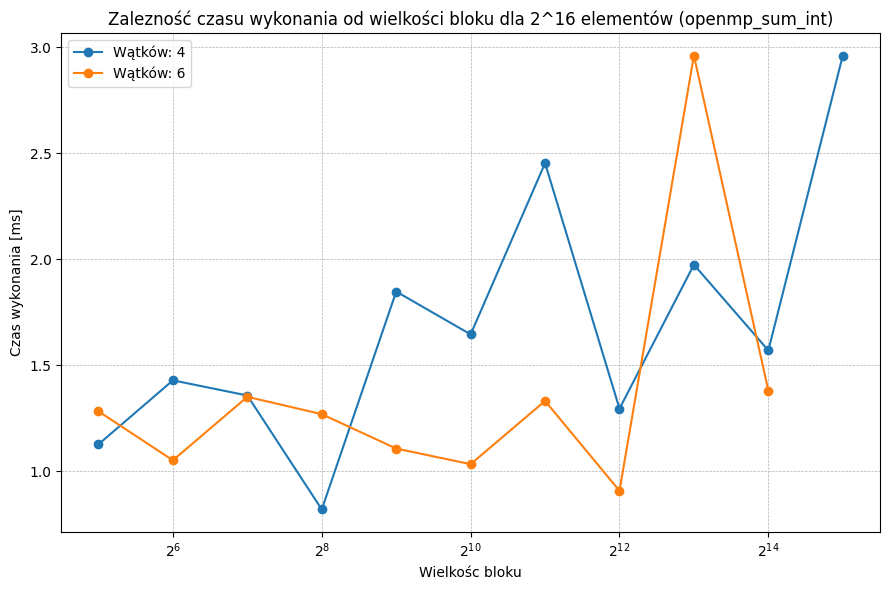

In [146]:
tech = "openmp"
op = "sum"
datatype = "int"

reduce_mean_openmp(f"../results/openmp/chunks/{tech}_{op}_{datatype}.csv")

filename = f"{tech}_{op}_{datatype}.csv"
df = pd.read_csv("../results/" + tech + '/chunks/' + filename)

plot_time_vs_chunk(df, 16, dtype_label=f"{tech}_{op}_{datatype}")